In [26]:
import pandas as pd
from thefuzz import process
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import unidecode
from collections import Counter

## Medicamentos dados al Ingreso

In [27]:
medicamentos_ingreso = pd.read_csv("data/admissiondrug.csv")
medicamentos_ingreso.head()

,admissiondrugid,patientunitstayid,drugoffset,drugenteredoffset,drugnotetype,specialtytype,usertype,rxincluded,writtenineicu,drugname,drugdosage,drugunit,drugadmitfrequency,drughiclseqno
0,1373386,281479,420,444,Daily Progress,eCM Primary,THC Physician,False,True,NOVOLOG ...,0.0,,,20769
1,1917810,281479,24,31,Admission,eCM Primary,THC Nurse,True,True,NOVOLOG ...,0.0,,,20769
2,2118524,292154,242,243,Daily Progress,eCM Primary,Other,False,True,ALLOPURINOL ...,0.0,,,1100
3,1984925,292154,53,69,Admission,eCM Primary,THC Nurse,False,True,DILTIAZEM 24HR CD ...,0.0,,,182
4,2118526,292154,242,243,Daily Progress,eCM Primary,Other,False,True,CALCIUM CARBONATE ...,0.0,,,1163


In [28]:
medicamentos_unicos = medicamentos_ingreso["drugname"].unique()
print(len(medicamentos_unicos))
medicamentos_unicos

820


array(['NOVOLOG                                                                                                                                                                                                                                                        ',
       'ALLOPURINOL                                                                                                                                                                                                                                                    ',
       'DILTIAZEM 24HR CD                                                                                                                                                                                                                                              ',
       'CALCIUM CARBONATE                                                                                                                                                                                 

In [29]:

# Diccionario de categorías terapéuticas
categories = {
    "Medicamento_Antiinflamatorio": ["ASPIRIN", "MOTRIN", "SOLU-MEDROL", "DEXAMETHASONE", "DICLOFENAC POTASSIUM", "MELOXICAM","TYLENOL-CODEINE NO.3", "HYDROCODONE BITARTRATE/ACETAMINOPHEN", "HYDROCODONE-ACETAMINOPHEN","ASPIRIN EC", "ASPIRIN","ADVIL", "DICLOFENAC SODIUM", "NAPROXEN", "ALEVE","OXYCODONE CONCENTRATE", "OXYCODONE HCL-ACETAMINOPHEN", "TRAMADOL HCL", "ACETAMINOPHEN", "PREDNISONE","OXYCODONE CONCENTRATE", "OXYCODONE HCL-ACETAMINOPHEN", "TRAMADOL HCL", "ACETAMINOPHEN", "PREDNISONE", "ULTRAM", "DURAGESIC","METHYLPREDNISOLONE", "IBUPROFEN","HYDROCODONE BIT/ACETAMINOPHEN", "OXYCODONE HCL", "TYLENOL","FENTANYL", "CELEBREX", "KETOPROFEN","HYDROCODONE-HOMATROPINE MBR", "CODEINE PHOSPHATE", "MEPERIDINE HCL", "PERCOCET ","MOBIC", "HYDROCORTISONE", "BAYER ADVANCED", "NABUMETONE", "VOLTAREN", "DECADRON","OXYMORPHONE HCL", "ROXICODONE ", "MS CONTIN ", "MORPHINE SULFATE", "TYLENOL PM EXTRA STRENGTH", "LORTAB ", "VICODIN ", "MOBIC ", "HYDROCORTISONE", "NABUMETONE", "BAYER ADVANCED", "DECADRON ", "VOLTAREN ", "INDOCIN ", "DICLOFENAC EPOLAMINE","OXYMORPHONE HCL", "ROXICODONE ", "MS CONTIN ", "MORPHINE SULFATE", "TYLENOL PM EXTRA STRENGTH", "LORTAB ", "VICODIN ", "TYLENOL EXTRA STRENGTH", "HYDROCODONE BITARTRATE", "OXYCONTIN ", "EXCEDRIN EXTRA STRENGTH", "MORPHINE SULFATE ER", "ROXICET ","INDOMETHACIN", "TRIAMCINOLONE", "CELECOXIB", "DELTASONE ", "NAPROSYN ","DILAUDID ", "HYDROMORPHONE HCL", "ACETAMINOPHEN-CODEINE","ETODOLAC"],
    "Medicamento_Alergias": ["DIPHENHYDRAMINE HCL ","CYPROHEPTADINE HCL","LORATADINE", "ZYRTEC ","CETIRIZINE HCL", "ALLEGRA ", "CHLORPHENIRAMINE MALEATE","CLARITIN ", "FEXOFENADINE HCL","LIDOCAINE","CLARITIN ", "FEXOFENADINE HCL", "BENADRYL","LORATADINE ALLERGY"],
    "Medicamento_Cardiovascular": ["DILTIAZEM 24HR CD", "COUMADIN ", "NITROGLYCERIN", "CRESTOR ", "AMLODIPINE BESILATE", "CARDIZEM ", "VERAPAMIL HCL", "LOSARTAN POTASSIUM", "CARVEDILOL", "AMIODARONE HCL", "SIMVASTATIN", "PLAVIX ", "METOPROLOL TARTRATE", "MICARDIS ", "ATORVASTATIN CALCIUM","CLONIDINE","ALLOPURINOL", "FUROSEMIDE ", "POTASSIUM CHLORIDE", "KLOR-CON ", "LASIX ", "WARFARIN SODIUM ", "POTASSIUM","DIPYRIDAMOLE", "BENICAR ", "ZOCOR ", "TOPROL XL ", "IMDUR ", "ASPIR 81 ", "NITROSTAT ", "PROCARDIA ", "HYDRALAZINE HCL", "NADOLOL", "CARDURA XL ", "PRADAXA ", "DIGOXIN", "EXFORGE ", "DOXAZOSIN MESYLATE", "METOPROLOL SUCCINATE", "ATENOLOL", "FENOFIBRATE", "AMLODIPINE BESYLATE", "MULTAQ ", "BENAZEPRIL HCL", "LOPRESSOR ", "NIASPAN ", "LOVENOX ", "CATAPRES ", "ENALAPRIL MALEATE","BUMETANIDE", "TRIAMTERENE-HCTZ", "KLOR-CON M20 ", "ALDACTONE ", "HYDROCHLOROTHIAZIDE","DIPYRIDAMOLE", "BENICAR ", "ZOCOR ", "TOPROL XL ", "IMDUR ", "ASPIR 81 ", "NITROSTAT ", "PROCARDIA ", "HYDRALAZINE HCL", "NADOLOL", "CARDURA XL ", "PRADAXA ", "DIGOXIN", "EXFORGE ", "DOXAZOSIN MESYLATE", "METOPROLOL SUCCINATE", "ATENOLOL", "FENOFIBRATE", "AMLODIPINE BESYLATE", "MULTAQ ", "BENAZEPRIL HCL", "LOPRESSOR ", "NIASPAN ", "LOVENOX ", "CATAPRES ", "ENALAPRIL MALEATE", "COREG ", "FLECAINIDE ACETATE", "TAZTIA XT ", "PRAVASTATIN SODIUM", "VERAPAMIL ER", "LOTENSIN ", "TERAZOSIN HCL", "SOTALOL", "ZETIA ", "NORVASC ", "ISOSORBIDE", "LETAIRIS ", "REVATIO ", "TYVASO ", "VASOTEC ", "CAPTOPRIL", "HEPARIN SODIUM", "LIPITOR ", "PROPRANOLOL HCL", "NIFEDIPINE", "BRILINTA ","BUMETANIDE", "TRIAMTERENE-HCTZ", "KLOR-CON M20 ", "ALDACTONE ", "HYDROCHLOROTHIAZIDE", "ZAROXOLYN ", "LISINOPRIL-HYDROCHLOROTHIAZIDE", "SPIRONOLACTONE","TERAZOSIN HCL", "PRAZOSIN HCL", "REVATIO ","PROTAMINE SULFATE", "LOVASTATIN", "ELIQUIS ", "MAVIK ", "BYSTOLIC ", "TRICOR ", "EFFIENT ", "ROSUVASTATIN CALCIUM", "LABETALOL HCL", "XARELTO ", "DIOVAN ", "AGGRENOX ", "PLETAL ", "VALSARTAN", "PRAVACHOL ", "CLOPIDOGREL", "ALTACE ", "ISORDIL ", "MIDODRINE HCL", "PERSANTINE ", "LISINOPRIL/HYDROCHLOROTHIAZIDE", "CILOSTAZOL", "LANOXIN ","ALDACTAZIDE ", "MAXZIDE ","TIMOLOL","TRIGLIDE", "TENORMIN ", "MEVACOR ", "RANOLAZINE", "CHOLESTYRAMINE", "PACERONE ", "ECOTRIN ", "PRASUGREL HCL", "COZAAR ", "ARIXTRA ", "TELMISARTAN", "PRINIVIL ", "CARDURA ", "NIACOR ","CHLORTHALIDONE", "ZYLOPRIM ", "DYAZIDE ","NITROLINGUAL ", "INSPRA ", "LESCOL XL ", "PROCARDIA XL ", "DILTIA XT ", "ACCUPRIL ", "BETAPACE ", "CARDIZEM CD ", "NITRO-BID ", "DOPAMINE HCL", "ZESTRIL ","MICROZIDE ", "HYZAAR ", "DEMADEX ", "INDAPAMIDE", "NITROLINGUAL ", "INSPRA ", "MICROZIDE ", "HYZAAR ", "LESCOL XL ", "PROCARDIA XL ", "DILTIA XT ", "DOPAMINE HCL", "BETAPACE ", "CARDIZEM CD ", "NITRO-BID ", "ZESTRIL ", "DABIGATRAN ETEXILATE MESYLATE", "APIXABAN", "EZETIMIBE", "BISOPROLOL FUMARATE", "TICAGRELOR", "RAMIPRIL", "GEMFIBROZIL", "DEMADEX ", "INDAPAMIDE", "TORSEMIDE", "METOLAZONE", "DIAMOX SEQUELS ", "ADALAT CC ", "MEXILETINE HCL", "QUINIDINE GLUCONATE", "QUINIDINE SULFATE", "LOPID ", "NIFEDIPINE ER", "LOTREL ", "DILTIAZEM HCL", "FELODIPINE", "DILTIAZEM 24HR ER", "ADULT LOW DOSE ASPIRIN EC", "CLOPIDOGREL BISULFATE", "DIOVAN HCT ","AMILORIDE HCL", "TRIAMTERENE","TENORETIC 100 ", "TELMISARTAN/HYDROCHLOROTHIAZIDE"],
    "Medicamento_Endocrino": ["NOVOLOG ", "LANTUS ", "INSULIN ASPART ", "HUMULIN R ", "NOVOLIN 70-30", "GLYBURIDE", "LEVEMIR ", "LEVOTHYROXINE SODIUM","MEGESTROL ACETATE","MEGACE ", "GLUCOPHAGE ", "JANUMET XR ", "GLIMEPIRIDE", "GLIPIZIDE", "SYNTHROID", "METFORMIN HCL", "HUMALOG ", "HUMALOG MIX 75-25","GLUCOPHAGE ", "JANUMET XR ", "GLIMEPIRIDE", "GLIPIZIDE", "SYNTHROID ", "METFORMIN HCL", "HUMALOG ", "HUMALOG MIX 75-25", "GLUCOTROL ","TRADJENTA ", "NESINA ", "TESTOSTERONE", "FORTEO ", "INSULIN LISPRO", "AMARYL ", "SITAGLIPTIN PHOSPHATE", "INSULIN DETEMIR", "INSULIN ADMIN. SUPPLIES", "NOVOLIN R ", "LEVOTHROID ", "GLYBURIDE-METFORMIN HCL","INSULIN ASPART PROTAMINE HUMAN/INSULIN ASPART", "LEENA", "NATEGLINIDE", "JANUVIA ", "INSULIN SYRINGE", "TEKTURNA ", "DIABETA ", "NOVOLOG FLEXPEN ","SANDOSTATIN ", "ADIPEX-P ", "GLUCOTROL XL ", "GLUCOVANCE ", "FOSAMAX ", "INSULIN NPH HUMAN ISOPHANE", "INSULIN LISPRO PROTAMINE AND INSULIN LISPRO", "VICTOZA 2-PAK ", "INSULIN LISPRO, HUMAN REC. ANLOG", "ESTRACE ","SANDOSTATIN ", "ADIPEX-P ", "GLUCOTROL XL ", "GLUCOVANCE ", "FOSAMAX ", "INSULIN NPH HUMAN ISOPHANE", "INSULIN LISPRO PROTAMINE AND INSULIN LISPRO", "VICTOZA 2-PAK ", "INSULIN LISPRO, HUMAN REC. ANLOG", "ESTRACE ", "IBANDRONATE SODIUM", "SAXAGLIPTIN HCL","TAPAZOLE ", "ACTOS ", "LANTUS SOLOSTAR ", "METHIMAZOLE", "APIDRA ", "PIOGLITAZONE HCL", "ESTRADIOL", "LEVOXYL ", "OCELLA ", "PREMARIN ", "ALENDRONATE SODIUM", "NOVOLIN N ","EVISTA ", "FLUDROCORTISONE ACETATE"],
    "Medicamento_Gastrointestinal": ["CALCIUM CARBONATE", "METOCLOPRAMIDE HCL", "PANTOPRAZOLE SODIUM", "CARAFATE ", "CARBOXYMETHYLCELLULOSE", "LINACLOTIDE", "PROBIOTIC", "PROBIOTIC & ACIDOPHILUS", "PROMETHAZINE HCL", "ONDANSETRON ", "POLYETHYLENE GLYCOL ", "BISACODYL", "MILK OF MAGNESIA", "OMEPRAZOLE ", "MINERAL OIL ENEMA", "ZOFRAN", "RANITIDINE HCL", "DULCOLAX ", "MIRALAX ", "PRILOSEC ","FAMOTIDINE", "PROTONIX ", "NEXIUM ", "FLORASTOR ", "SENOKOT ","FAMOTIDINE", "PROTONIX ", "NEXIUM ", "FLORASTOR ", "SENOKOT ", "COLACE ", "LACTOBACILLUS ACIDOPHILUS", "ROBINUL ", "LOPERAMIDE", "LANSOPRAZOLE", "REGLAN ","TUMS ", "DEXILANT ", "ESOMEPRAZOLE MAGNESIUM", "HYOSCYAMINE SULFATE", "MESALAMINE", "PEPCID ", "SUCRALFATE", "IMODIUM A-D ", "MAALOX ADVANCED","URSODIOL", "DICYCLOMINE HCL", "ENTOCORT EC", "ASACOL", "ZANTAC", "LACTULOSE", "AMITIZA ", "BALSALAZIDE DISODIUM", "PREVACID ", "ATROPINE", "PHENERGAN ", "LEVSIN ", "DOCUSATE SODIUM", "ZOFRAN ODT ", "KETOPROFEN", "LACTOBACILLUS ACIDOPH/BIFIDOBACT ANIM/GLOBULIN PROTEIN CONC", "AZULFIDINE ", "TAGAMET HB ","DOCUSATE CALCIUM", "LOMOTIL ", "ENULOSE ", "SENNA", "BENTYL ", "BACILLUS COAGULANS/INULIN", "SENNOSIDES A&B, CALCIUM", "FIBERCON ","DOCUSATE CALCIUM", "LOMOTIL ", "ENULOSE ", "SENNA", "BENTYL ", "SENNOSIDES A&B, CALCIUM", "FIBERCON ", "DELZICOL ", "SENNOSIDES", "BENEFIBER", "GLYCOLAX ","DIPHENOXYLATE HCL/ATROPINE SULFATE", "ZENPEP ","BACID ", "SIMETHICONE", "MOVIPREP ", "ACIDOPHILUS"],
    "Medicamento_Infeccioso": ["CEPHALEXIN", "XIFAXAN ", "ZITHROMAX ","LEVAQUIN ", "AUGMENTIN ", "FLAGYL ","NYSTATIN", "LEVAQUIN ", "AUGMENTIN ", "FLAGYL ", "KEFLEX","ROCEPHIN", "AZITHROMYCIN", "CIPRO ", "CEFPODOXIME PROXETIL", "NIZORAL ", "FLUCONAZOLE","CEFEPIME", "VANCOMYCIN", "ZOSYN ", "CIPROFLOXACIN", "NEOSPORIN", "ACYCLOVIR", "TAMIFLU ","VIBRAMYCIN ", "AMOXICILLIN", "TRIMETHOPRIM","ATRIPLA","ATRIPLA", "VALGANCICLOVIR HCL","VIBRAMYCIN ", "AMOXICILLIN", "TRIMETHOPRIM", "BACTRIM ", "AMOXICILLIN-CLAVULANATE ER", "NITROFURANTOIN", "TRIMETHOPRIM-POLYMYXIN B SULF", "CLINDAMYCIN HCL", "MUPIROCIN", "DAPSONE","MICONAZOLE", "LAMISIL ","MACROBID ", "DOXYCYCLINE CALCIUM", "AVELOX ", "PYRAZINAMIDE", "RIFAMPIN", "ISONIAZID", "ETHAMBUTOL HCL", "AMPICILLIN SODIUM", "PRIMAXIN ", "PERIDEX ", "SULFAMETHOXAZOLE-TRIMETHOPRIM","ZOVIRAX ", "COMBIVIR ", "VALCYTE ","DEMECLOCYCLINE HCL","DIFLUCAN "],
    "Medicamento_Neurológico": ["MECLIZINE HCL", "PRISTIQ ER ", "BUSPIRONE HCL", "NAMENDA ", "REQUIP ", "XANAX ", "TEMAZEPAM", "COMPAZINE ", "GABAPENTIN", "DONEPEZIL HCL", "LORAZEPAM", "CITALOPRAM HBR", "AMBIEN ", "TRAZODONE HCL", "CAMPRAL ","PRISTIQ ER ", "BUSPIRONE HCL", "NAMENDA", "REQUIP ", "XANAX ", "TEMAZEPAM", "COMPAZINE ", "GABAPENTIN", "DONEPEZIL HCL", "LORAZEPAM", "CITALOPRAM HBR", "AMBIEN ", "TRAZODONE HCL", "CAMPRAL ", "METHADONE HCL", "ATIVAN ", "MEMANTINE HCL", "ESZOPICLONE", "CLORAZEPATE DIPOTASSIUM", "COGENTIN ", "ABILIFY ", "CYMBALTA ", "LAMICTAL ", "NEURONTIN ", "ARICEPT ", "BUPROPION HCL", "MIRTAZAPINE", "SERTRALINE HCL", "LEVETIRACETAM","KLONOPIN ", "WELLBUTRIN ", "VILAZODONE HYDROCHLORIDE", "RISPERDAL ", "LITHIUM", "QUETIAPINE FUMARATE", "PHENYTOIN", "ESCITALOPRAM OXALATE", "RESTORIL ", "CHLORDIAZEPOXIDE HCL", "LYRICA ", "KEPPRA ", "VALPROATE SODIUM", "CELEXA ", "ZYPREXA ", "ZOLOFT ", "EFFEXOR XR ", "INVEGA ","NALTREXONE HCL", "MIRAPEX ", "MELATONIN", "DILANTIN ", "PAROXETINE HCL", "AMBIEN CR ", "TOPAMAX ", "PROCHLORPERAZINE MALEATE", "EFFEXOR ", "METHADONE", "CITALOPRAM", "MILNACIPRAN HCL", "PERPHENAZINE/AMITRIPTYLINE HCL", "NALTREXONE HCL", "MIRAPEX ", "DILANTIN ", "PAROXETINE HCL", "AMBIEN CR ", "TOPAMAX ", "PROCHLORPERAZINE MALEATE", "EFFEXOR ", "METHADONE", "CITALOPRAM", "MILNACIPRAN HCL", "PERPHENAZINE/AMITRIPTYLINE HCL", "MELATONIN", "VENLAFAXINE HCL", "LOXAPINE", "IMIPRAMINE HCL", "PRIMIDONE", "NORTRIPTYLINE HCL", "DIAZEPAM", "TOPIRAMATE", "ANTIVERT ", "TRILEPTAL ", "HALDOL ", "HALCION ", "HYDROXYZINE PAMOATE", "TRIAZOLAM", "ROPINIROLE HCL", "SAPHRIS ", "BENZTROPINE MESYLATE", "ABILIFY DISCMELT ", "DEPAKOTE "],
    "Medicamento_Nutricional": ["CHOLECALCIFEROL /SOY ISOFLAVONE", "OMEGA 3", "PRESERVISION LUTEIN", "FOLIC ACID","FEOSOL ", "PRENATAL", "FERROUS SULFATE", "CITRACAL ", "TL 4.25% BPO MX", "PROMOD", "THERA M PLUS", "ASCORBIC ACID ","FEOSOL ", "PRENATAL", "FERROUS SULFATE", "CITRACAL ", "TL 4.25% BPO MX", "PROMOD", "THERA M PLUS", "ASCORBIC ACID ", "VITAMIN D-3", "CENTRUM", "VITAMIN B-1 ", "FERGON ", "VITAMIN D3", "CYANOCOBALAMIN ", "CHOLECALCIFEROL ", "FISH OIL ", "VITAMIN B-12", "MAGNESIUM OXIDE", "MULTIVITAMIN", "VITAMIN E", "CALCIUM CARBONATE/CHOLECALCIFEROL /MINERALS", "VITAMIN A", "COPPER", "ZINC", "MAG-OXIDE ", "COENZYME Q-10", "LOVAZA ","VITAMIN D", "CALCIUM", "IRON", "THIAMINE HCL ", "MAGOX 400 ", "NEPHRONEX", "NEPHROCAPS", "RENAL CAPS", "MASANTI","GLUCOSAMINE & CHONDROITIN", "GLUCOSAMINE", "CALCIUM + D", "FOLBIC", "METANX", "LYSINE", "VITAMIN C", "DAILY VITE","CRANBERRY", "MULTIPLE VITAMIN", "GARLIC", "MULTI VITAMIN DAILY", "B COMPLEX", "CINNAMON", "CALCIUM CARB&CITRATE/VITAMIN D3/MINERAL COMB NO.34/GENISTEIN", "MAGNESIUM", "CALTRATE 600", "POTASSIUM GLUCONATE", "MAGNESIUM GLUCONATE", "ECHINACEA", "VIT C/CHERRY EXT/CELERY SEED EXT/CELERY SEED/GRAPE SEED EXT", "MAGNESIUM HYDROXIDE", "ERGOCALCIFEROL ", "OCUVITE", "VITAMIN B COMPLEX/VIT B12", "VITAMIN B COMPLEX#11/FOLIC ACID/ASCORBIC ACID/BIOTIN/ZN OXID", "BIOFLAVONOID CITRUS", "THERAGRAN-M PREMIER 50 PLUS", "KRILL OIL", "L-LYSINE", "MULTI-VITAMIN", "CENTRUM SILVER", "BIOTIN","CRANBERRY", "MULTIPLE VITAMIN", "GARLIC", "MULTI VITAMIN DAILY", "B COMPLEX", "CINNAMON", "CALCIUM CARB&CITRATE/VITAMIN D3/MINERAL COMB NO.34/GENISTEIN", "MAGNESIUM", "CALTRATE 600", "POTASSIUM GLUCONATE", "MAGNESIUM GLUCONATE", "ECHINACEA", "VIT C/CHERRY EXT/CELERY SEED EXT/CELERY SEED/GRAPE SEED EXT", "MAGNESIUM HYDROXIDE", "ERGOCALCIFEROL ", "VITAMIN B COMPLEX#11/FOLIC ACID/ASCORBIC ACID/BIOTIN/ZN OXID", "OCUVITE", "VITAMIN B COMPLEX/VIT B12", "BIOFLAVONOID CITRUS", "THERAGRAN-M PREMIER 50 PLUS", "KRILL OIL", "L-LYSINE", "MULTI-VITAMIN", "ESSENTIAL MAN", "MULTIVITAMINS W-CALCIUM-IRON", "FISH OIL + VITAMIN D-3", "B-12", "MULTIVIT W-CA, MIN/IRON CHELATE/FA/LUTEIN/HERBAL #179", "CHOLECALCIFEROL /FOLIC ACID", "UBIDECARENONE ", "CHONDROITIN SULFATE", "CAL MAG ZINC + D", "PRESERVISION AREDS", "PRO-RED AC", "POTASSIUM PHOS, M-BASIC-D-BASIC", "OMEGA 3-6-9 FATTY ACIDS","FERROUS GLUCONATE", "N-ACETYL-L-CYSTEINE", "OYST-CAL-500", "CALTRATE 600 + D", "PRENATAL VITAMINS", "OYSTER SHELL + D", "NEPHRO-VITE", "CINNAMON OIL", "ENSURE", "VITAMIN B12-FOLIC ACID", "OMEGA-3 ACID ETHYL ESTERS","DIALYVITE", "LECITHIN", "SODIUM CHLORIDE", "ARNICA", "SAW PALMETTO"],
    "Medicamento_Oncológico": ["MEGACE ", "LEUPROLIDE ACETATE","METHOTREXATE", "XELODA ","ARIMIDEX ","CAPECITABINE", "CISPLATIN", "TOREMIFENE CITRATE", "APREPITANT", "ZYTIGA ", "TAMOXIFEN CITRATE"],
    "Medicamento_Neurológico": ["DULOXETINE HCL", "OLANZAPINE ", "CLONAZEPAM", "SEROQUEL ", "CITALOPRAM HYDROBROMIDE", "OXAZEPAM", "ADDERALL", "FLUOXETINE ", "ZOLPIDEM TARTRATE", "REMERON ", "ALPRAZOLAM ", "RIVASTIGMINE", "PROCHLORPERAZINE EDISYLATE", "AMITRIPTYLINE HCL", "DOXEPIN HCL", "VALIUM ","NICODERM CQ", "DEXTROAMPHETAMINE-AMPHETAMINE", "BUPROPION HBR", "LAMOTRIGINE", "RISPERIDONE", "RIZATRIPTAN", "PAXIL ", "SUBOXONE ", "CLOZARIL ", "AMANTADINE", "SINEMET 25-100 ", "PROZAC ", "RITALIN ", "DIVALPROEX SODIUM", "COPAXONE ", "PREGABALIN", "HYDROXYZINE HCL","LORAZEPAM INTENSOL", "PRAMIPEXOLE DI-HCL", "VALPROIC ACID", "METHADOSE ", "VIIBRYD ", "LAMICTAL ", "CHLORPROMAZINE HCL","SONATA ", "MYSOLINE "],
    "Medicamento_Respiratorio": ["IPRATROPIUM BROMIDE/ALBUTEROL SULFATE", "SPIRIVA ", "ADVAIR DISKUS ", "ALBUTEROL", "GUAIFENESIN-CODEINE", "MUCINEX DM ","SPIRIVA ","ALBUTEROL SULFATE", "PULMICORT ", "THEO-24 ", "XOPENEX ", "SINGULAIR ", "IPRATROPIUM BROMIDE", "VENTOLIN HFA ", "ATROVENT ","ALBUTEROL SULFATE", "PULMICORT ", "THEO-24 ", "XOPENEX ", "SINGULAIR ", "IPRATROPIUM BROMIDE", "VENTOLIN HFA ", "ATROVENT ", "PROAIR HFA ", "TUDORZA PRESSAIR ", "DUONEB ", "SYMBICORT ", "AFRIN ", "MUCINEX ", "QVAR ", "FLONASE ", "SALMETEROL XINAFOATE", "TIOTROPIUM BROMIDE","DULERA ", "PROVENTIL HFA ", "GUAIFENESIN","COMBIVENT ", "HYDROCODONE-HOMATROPINE MBR", "NASONEX ","FLUTICASONE FUROATE","FLUTICASONE FUROATE", "PHENYLEPHRINE HCL/ACETAMINOPHEN/CHLORPHENIRAMINE", "BUDESONIDE", "TESSALON PERLE ", "DALIRESP ", "FLUNISOLIDE", "MUCINEX D ", "FORADIL ", "FLUTICASONE PROPIONATE","CHLORPHENIRAMINE MAL/PHENYLEPHRINE/D-METHORPHAN HB/ASPIRIN", "SEREVENT DISKUS ", "THEOPHYLLINE", "CHLORPHENIRAMINE MALEATE/PHENYLEPHRINE BITARTRATE/ASPIRIN", "FLOVENT DISKUS ", "FLUTICASONE PROPIONATE/SALMETEROL XINAFOATE", "UMECLIDINIUM BROMIDE/VILANTEROL TRIFENATATE"],
    "Medicamento_Urológico": ["SOLIFENACIN SUCCINATE", "SILDENAFIL","TAMSULOSIN HCL", "FLOMAX ","TAMSULOSIN HCL", "FLOMAX ", "AVODART ", "PROSCAR ", "FINASTERIDE", "LEVITRA ", "VESICARE ", "DITROPAN XL ", "CIALIS ","TOVIAZ ", "TOVIAZ ", "VIAGRA ", "OXYBUTYNIN", "MYRBETRIQ ","PHENAZOPYRIDINE HCL", "DUTASTERIDE", "TADALAFIL"],
    "Medicamento_Renal": ["KAYEXALATE ", "RENAGEL ", "ZEMPLAR ", "PHOSLO ", "CALCITRIOL","KAYEXALATE ", "RENAGEL ", "ZEMPLAR ", "PHOSLO ", "CALCITRIOL","SEVELAMER CARBONATE", "CALCIUM ACETATE","SENSIPAR ", "RENVELA ","POTASSIUM CITRATE"],
    "Otros_Medicamentos": []
}

# Función para asignar la categoría
def assign_category(med, threshold=65):
    med = med.upper().strip()

    best_category = "Otros_Medicamentos"
    best_score = 0

    for category, meds in categories.items():
        # Saltar categorías vacías
        if not meds:
            continue

        # Convertir meds a mayúsculas para asegurar consistencia
        meds = [m.upper() for m in meds]

        result = process.extractOne(med, meds)

        if result:
            match, score = result

            if score > best_score:
                best_score = score
                best_category = category

    if best_score >= threshold:
        return best_category
    else:
        return "Otros Medicamentos"

# Aplicar
medicamentos_ingreso["category"] = medicamentos_ingreso["drugname"].apply(assign_category)





In [30]:
# Ver resultados
medicamentos_ingreso.head(30)

,admissiondrugid,patientunitstayid,drugoffset,drugenteredoffset,drugnotetype,specialtytype,usertype,rxincluded,writtenineicu,drugname,drugdosage,drugunit,drugadmitfrequency,drughiclseqno,category
0,1373386,281479,420,444,Daily Progress,eCM Primary,THC Physician,False,True,NOVOLOG ...,0.0,,,20769,Medicamento_Endocrino
1,1917810,281479,24,31,Admission,eCM Primary,THC Nurse,True,True,NOVOLOG ...,0.0,,,20769,Medicamento_Endocrino
2,2118524,292154,242,243,Daily Progress,eCM Primary,Other,False,True,ALLOPURINOL ...,0.0,,,1100,Medicamento_Cardiovascular
3,1984925,292154,53,69,Admission,eCM Primary,THC Nurse,False,True,DILTIAZEM 24HR CD ...,0.0,,,182,Medicamento_Cardiovascular
4,2118526,292154,242,243,Daily Progress,eCM Primary,Other,False,True,CALCIUM CARBONATE ...,0.0,,,1163,Medicamento_Gastrointestinal
5,1984920,292154,53,69,Admission,eCM Primary,THC Nurse,False,True,ALLOPURINOL ...,0.0,,,1100,Medicamento_Cardiovascular
6,2118525,292154,242,243,Daily Progress,eCM Primary,Other,False,True,ASPIRIN ...,0.0,,,1820,Medicamento_Antiinflamatorio
7,1984924,292154,53,69,Admission,eCM Primary,THC Nurse,False,True,CLONIDINE ...,0.0,,,36550,Medicamento_Cardiovascular
8,2118529,292154,242,243,Daily Progress,eCM Primary,Other,False,True,COUMADIN ...,0.0,,,2812,Medicamento_Cardiovascular
9,1984923,292154,53,69,Admission,eCM Primary,THC Nurse,False,True,CHOLECALCIFEROL (VIT D3)/SOY ISOFLAVONE ...,0.0,,,36211,Medicamento_Nutricional


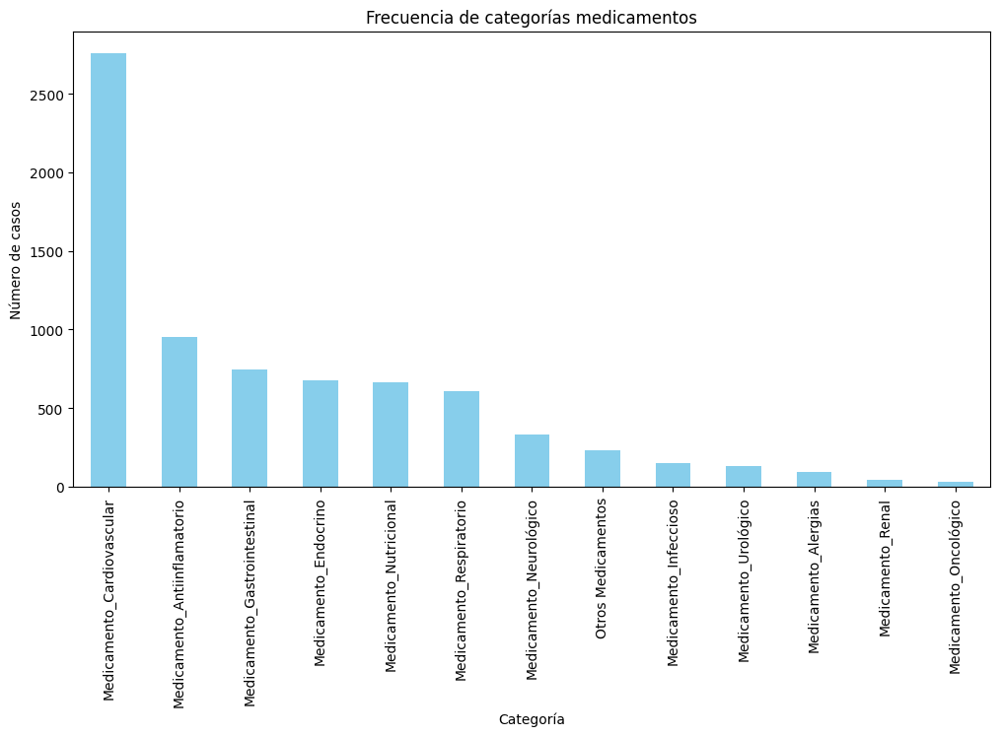

In [31]:
conteo_categorias = medicamentos_ingreso["category"].value_counts()
conteo_categorias.plot(kind="bar", figsize=(12, 6), color="skyblue")
plt.title("Frecuencia de categorías medicamentos")
plt.xlabel("Categoría")
plt.ylabel("Número de casos")
plt.xticks(rotation=90)  # Rotar etiquetas para mejor visibilidad
plt.show()

In [32]:
medicamentos_ingreso_final = medicamentos_ingreso[['patientunitstayid', 'category']].copy()
medicamentos_ingreso_final['value'] = 1
medicamentos_ingreso_final_pivot = medicamentos_ingreso_final.pivot_table(index='patientunitstayid', columns='category', values='value', fill_value=0)
medicamentos_ingreso_final_pivot.reset_index(inplace=True)
medicamentos_ingreso_final_pivot.head(30)


category,patientunitstayid,Medicamento_Alergias,Medicamento_Antiinflamatorio,Medicamento_Cardiovascular,Medicamento_Endocrino,Medicamento_Gastrointestinal,Medicamento_Infeccioso,Medicamento_Neurológico,Medicamento_Nutricional,Medicamento_Oncológico,Medicamento_Renal,Medicamento_Respiratorio,Medicamento_Urológico,Otros Medicamentos
0,281479,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,292154,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,310446,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,332296,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,350263,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
5,351717,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
6,356949,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
7,365652,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
8,369273,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
9,390956,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0


In [33]:
medicamentos_ingreso_final_pivot.info()
medicamentos_ingreso_final_pivot.to_csv("data/medicamentos_de_ingreso.csv", index=False)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 551 entries, 0 to 550
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   patientunitstayid             551 non-null    int64  
 1   Medicamento_Alergias          551 non-null    float64
 2   Medicamento_Antiinflamatorio  551 non-null    float64
 3   Medicamento_Cardiovascular    551 non-null    float64
 4   Medicamento_Endocrino         551 non-null    float64
 5   Medicamento_Gastrointestinal  551 non-null    float64
 6   Medicamento_Infeccioso        551 non-null    float64
 7   Medicamento_Neurológico       551 non-null    float64
 8   Medicamento_Nutricional       551 non-null    float64
 9   Medicamento_Oncológico        551 non-null    float64
 10  Medicamento_Renal             551 non-null    float64
 11  Medicamento_Respiratorio      551 non-null    float64
 12  Medicamento_Urológico         551 non-null    float64
 13  Otros

## Alergias

In [34]:
alergias_paciente = pd.read_csv("data/allergy.csv")
alergias_paciente.head()

,allergyid,patientunitstayid,allergyoffset,allergyenteredoffset,allergynotetype,specialtytype,usertype,rxincluded,writtenineicu,drugname,allergytype,allergyname,drughiclseqno
0,357144,243097,2549,2552,Comprehensive Progress,eCM Primary,THC Nurse,True,True,NaN,Non Drug,penicillins,NaN
1,442253,243097,1288,1294,Comprehensive Progress,eCM Primary,THC Nurse,True,True,CODEINE PHOSPHATE,Drug,CODEINE PHOSPHATE,1721.0
2,357143,243097,2549,2552,Comprehensive Progress,eCM Primary,THC Nurse,True,True,CODEINE PHOSPHATE,Drug,CODEINE PHOSPHATE,1721.0
3,329929,243097,21,28,Admission,eCM Primary,THC Nurse,True,True,NaN,Non Drug,penicillins,NaN
4,363374,243097,3988,3989,Comprehensive Progress,eCM Primary,THC Nurse,True,True,CODEINE PHOSPHATE,Drug,CODEINE PHOSPHATE,1721.0


In [35]:
allergy_name = alergias_paciente["allergyname"].unique()
df_allergy = pd.DataFrame(allergy_name, columns=["allergyname"])
df_allergy

,allergyname
0,penicillins
1,CODEINE PHOSPHATE
2,VALSARTAN
3,HYDROCHLOROTHIAZIDE
4,ATENOLOL
...,...
661,FLUVASTATIN SODIUM
662,DAPAGLIFLOZIN
663,ROSUVASTATIN CALCIUM
664,LATEX EXAM GLOVES


In [36]:
# Diccionario de categorías terapéuticas
categories_allergy = {
    "Alergia_a_Antibióticos": ["Penicillins", "AMOXICILLIN", "PCN", "Amoxicillin", "penicillin", "PENICILLINS", "LINCOMYCIN", "Azithromycin", "AZITHROMYCIN", "cephazolin", "ampicillin", "Cephalosporin", "PENICILLIN G BENZATHINE", "PENICILLIN G SODIUM", "SULFONAMIDES", "PENICILLIN", "Pencillin", "CEFEPIME", "ERTAPENEM", "CEFUROXIME", "CIPRO", "LEVAQUIN", "BACTRIM", "SULFADIAZINE", "KEFLEX", "AUGMENTIN", "ciprofloxacin", "Levofloxacin", "LEVOFLOXACIN", "cefazolin", "CEPHALEXIN", "TRIMETHOPRIM", "SULFAMETHOXAZOLE", "Sulfamethoxazole", "Trimethoprim", "Sulfa drugs", "Sulfa", "sulfa", "SULFA", "SULFA DRUGS", "Sulfonamides", "rocephin", "cleocin", "ZITHROMAX", "MOXIFLOXACIN HCL", "PCNs", "PCN ECM", "penicillen", "AMOXICILLIN/POTASSIUM CLAVULANATE", "cephalosporins"],
    "Alergia_a_Analgésicos_y_Antiinflamatorios": ["Codeine", "CODEINE PHOSPHATE", "CODEINE SULFATE", "MORPHINE", "morphine", "MORPHINE SULFATE", "OXYCODONE HCL", "OXYCODONE", "HYDROCODONE", "HYDROCODONE BITARTRATE", "FENTANYL", "TRAMADOL HCL", "ULTRACET", "NSAIDS", "ibuprofen", "IBUPROFEN", "aspirin", "ASPIRIN", "MOTRIN", "NAPROXEN", "VICODIN", "PERCOCET", "OXYCONTIN", "Darvocet-N", "darvon", "DILAUDID", "TORADOL", "KETOROLAC TROMETHAMINE", "darvocet", "demerol", "DEMEROL", "CELECOXIB", "celecoxib", "vioxx", "INDOMETHACIN", "INDOCIN", "DICLOFENAC SODIUM", "DICLOFENAC EPOLAMINE", "DICLOFENAC", "METHADONE HCL", "morphine and related"],
    "Alergia_a_Antihistamínicos": ["Antihistamines", "antihistamines", "ANTIHISTAMINE", "benadryl", "BENADRYL", "Dimetapp"],
    "Alergia_a_Contrastes_y_Yodo": ["IV DYE", "IV Dye", "IVP DYE", "IV contrast", "contrast media", "Contrast Dye", "IVP dye", "iodine", "IODINE", "iodine containing", "iodine agents", "iodine cont. compoun", "IVP contr dye", "IODIDES", "IODIXANOL", "Barium"],
    "Alergia_a_Estatinas_y_Medicamentos_Colesterol": ["Statins", "statins", "ATORVASTATIN", "LIPITOR", "Lipitor", "SIMVASTATIN", "ZOCOR", "crestor", "CRESTOR", "rosuvastatin", "ATORVASTATIN CALCIUM", "FLUVASTATIN SODIUM", "PRAVASTATIN", "Vytorin", "VYTORIN", "ZETIA", "Zetia", "LOVASTATIN", "trilipix", "TRICOR", "GEMFIBROZIL", "FENOFIBRATE"],
    "Alergia_a_Antidepresivos_y_Psicofármacos": ["Duloxetine", "DULOXETINE HCL", "duloxetine", "ZOLOFT", "Sertaline HCL", "SERTRALINE HCL", "VENLAFAXINE HCL", "PAXIL", "WELLBUTRIN", "BUPROPION", "Elavil", "AMITRIPTYLINE HCL", "Lexapro", "ARIPIPRAZOLE", "aripiprazole"],
    "Alergia_a_Anticonvulsivos": ["Carbamazepine", "CARBAMAZEPINE", "Phenytoin", "PHENYTOIN", "Dilantin", "DILANTIN", "GABAPENTIN", "gabapentin", "pregabalin", "PREGABALIN", "DIVALPROEX SODIUM", "divalproex", "KEPPRA", "OXCARBAZEPINE", "Phenobarbital", "PHENOBARBITAL"],
    "Alergia_a_Anestésicos": ["LIDOCAINE", "XYLOCAINE", "Lidocaine", "Bupivicaine", "novocain", "Amide type anestheti", "Halogenated anesthetic"],
    "Alergia_a_Vacunas_y_Componentes_de_Vacunas": ["Tetanus Toxoid", "tetanus toxoid", "Tetanus", "Tetanus toxoids", "TETANUS TOXOID ADSORBED", "H1N1 vaccine", "Influenza A vaccine", "influenza virus vacc", "flu vacine", "Flu Virus Vaccine", "INFLUENZA VACCINE", "Pneumonia vaccine", "PNEUMOVAX 23"],
    "Alergia_a_Inhibidores_de_la_ECA": ["Lisinopril", "lisinopril", "ACE inhibitors", "ace inhibitors", "ACE INHIBITORS", "captopril", "CAPTOPRIL", "PRINIVIL", "ZESTRIL", "BENAZEPRIL HCL", "fosinopril", "ENALAPRIL MALEATE", "QUINAPRIL HCL", "RAMIPRIL"],
    "Alergia_a_Betabloqueantes": ["ATENOLOL", "Metoprolol", "METOPROLOL SUCCINATE", "BETA BLOCKERS", "beta blockers", "COREG", "PROPRANOLOL", "LOPRESSOR", "TOPROL XL", "Labetalol"],
    "Alergia_a_Sulfonamidas": ["SULFAMETHOXAZOLE", "SULFAMETHOXAZOLE-TRIMETHOPRIM", "SULFANILAMIDE", "SULFABENZAMIDE", "SULFACETAMIDE", "SULFACETAMIDE SODIUM", "SULFAS"],
    "Alergias_Alimentarias": ["cocoa", "Peanuts", "tomato", "watermelon","Pineapple", "shrimp", "egg", "EGG", "WATERMELON", "MILK EGGS FRUIT", "honey", "coconut oil", "wine", "Beef", "Milk", "cinnamon", "Tree nuts", "eggs", "milk", "mushrooms", "seafood", "Strawberry C", "SHELLFISH, SHRIMP","mango", "LACTOSE", "STRAWBERRY C", "lactose", "PEANUTS","coffee", "red yeast rice", "chocolate", "nuts", "Vinegar", "VINEGAR", "CAFFEINE", "SHELLFISH","Banana", "shelfish", "Shell fish", "PEANUT BUTTER FLAVOR", "Lactose", "cashews", "shellfish", "Shellfish", "Strawberries","bleached flour", "SEAFOOD", "Chocolate", "Fish", "MANY FOOD ALLERGIES", "Seafood", "Nuts", "gluten meal", "GLUTEN", "Blackberry", "pork"],
    "Alergia_por_contacto": ["Adhesives", "silicone", "LATEX","LATEX LEG STRAPS", "LATEX EXTENSION TUBING", "LATEX GLOVES", "Adhesive", "Latex", "tape", "TAPE", "latex", "OPSITE TAPE","adhesive", "adhesive tape", "Tape","ADHESIVE", "Adhesive tape","ADHESIVE TAPE", "Latex natural rubber", "adhesives", "Nickel", "LATEX EXAM GLOVES", "Titanium", "SILICONES", "ADHESIVES", "adhesive/rash", "MERCURY AMMONIATED", "MERBROMIN", "mercury"],
    "Otras_Alergias": []
}

def normalize_text(text):
    if pd.isna(text):
        return ""
    return unidecode.unidecode(str(text).upper().strip())

def assign_category(med, threshold=55):  # Reducimos el threshold
    if pd.isna(med):
        return "Otras_Alergias"

    med = normalize_text(med)

    best_category = "Otras_Alergias"
    best_score = 0

    for category, meds in categories_allergy.items():
        if not meds:
            continue

        meds = [normalize_text(m) for m in meds]  # Normalizamos la lista de medicamentos

        result = process.extractOne(med, meds)
        if result:
            match, score = result
            if score > best_score:
                best_score = score
                best_category = category

    return best_category if best_score >= threshold else "Otras_Alergias"

# Aplicar
alergias_paciente["category_allergy"] = alergias_paciente["allergyname"].apply(assign_category)




In [37]:
alergias_paciente.head(5)


,allergyid,patientunitstayid,allergyoffset,allergyenteredoffset,allergynotetype,specialtytype,usertype,rxincluded,writtenineicu,drugname,allergytype,allergyname,drughiclseqno,category_allergy
0,357144,243097,2549,2552,Comprehensive Progress,eCM Primary,THC Nurse,True,True,NaN,Non Drug,penicillins,NaN,Alergia_a_Antibióticos
1,442253,243097,1288,1294,Comprehensive Progress,eCM Primary,THC Nurse,True,True,CODEINE PHOSPHATE,Drug,CODEINE PHOSPHATE,1721.0,Alergia_a_Analgésicos_y_Antiinflamatorios
2,357143,243097,2549,2552,Comprehensive Progress,eCM Primary,THC Nurse,True,True,CODEINE PHOSPHATE,Drug,CODEINE PHOSPHATE,1721.0,Alergia_a_Analgésicos_y_Antiinflamatorios
3,329929,243097,21,28,Admission,eCM Primary,THC Nurse,True,True,NaN,Non Drug,penicillins,NaN,Alergia_a_Antibióticos
4,363374,243097,3988,3989,Comprehensive Progress,eCM Primary,THC Nurse,True,True,CODEINE PHOSPHATE,Drug,CODEINE PHOSPHATE,1721.0,Alergia_a_Analgésicos_y_Antiinflamatorios


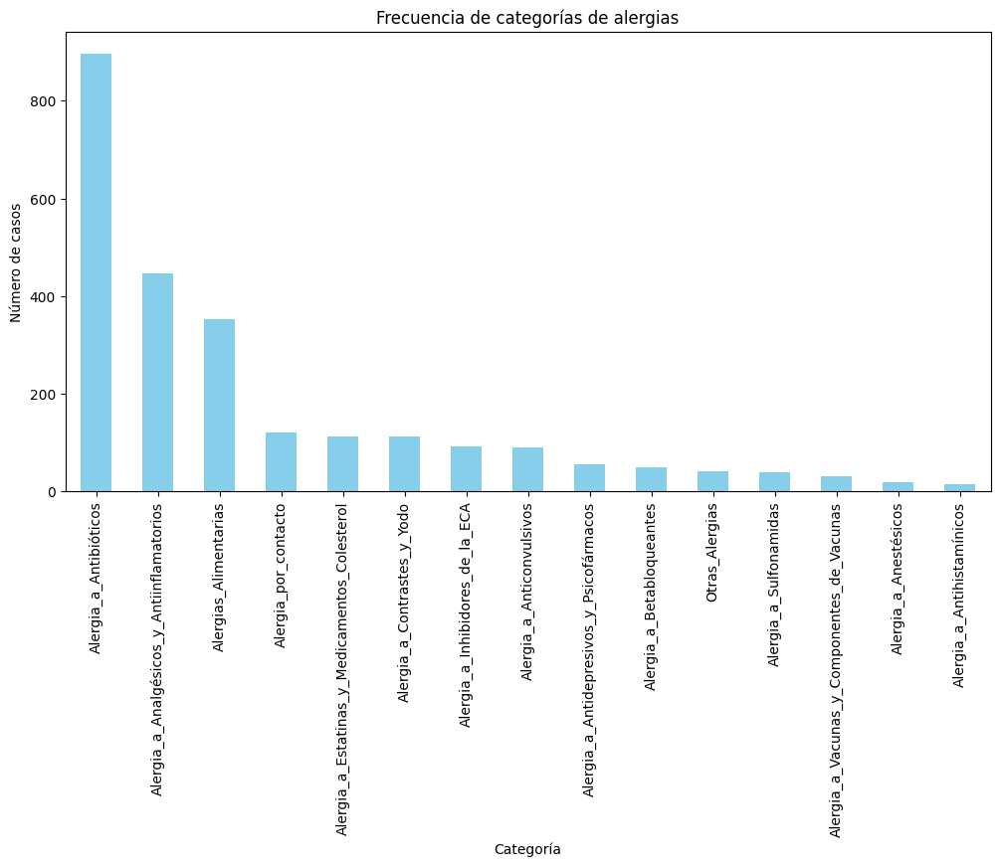

In [38]:
conteo_categorias = alergias_paciente["category_allergy"].value_counts()
conteo_categorias.plot(kind="bar", figsize=(12, 6), color="skyblue")
plt.title("Frecuencia de categorías de alergias")
plt.xlabel("Categoría")
plt.ylabel("Número de casos")
plt.xticks(rotation=90)  # Rotar etiquetas para mejor visibilidad
plt.show()

In [39]:
alergias = alergias_paciente[['patientunitstayid', 'category_allergy']].copy()
alergias['value'] = 1
alergias_pivot = alergias.pivot_table(index='patientunitstayid', columns='category_allergy', values='value', fill_value=0)
alergias_pivot.reset_index(inplace=True)
alergias_pivot.head(5)



category_allergy,patientunitstayid,Alergia_a_Analgésicos_y_Antiinflamatorios,Alergia_a_Anestésicos,Alergia_a_Antibióticos,Alergia_a_Anticonvulsivos,Alergia_a_Antidepresivos_y_Psicofármacos,Alergia_a_Antihistamínicos,Alergia_a_Betabloqueantes,Alergia_a_Contrastes_y_Yodo,Alergia_a_Estatinas_y_Medicamentos_Colesterol,Alergia_a_Inhibidores_de_la_ECA,Alergia_a_Sulfonamidas,Alergia_a_Vacunas_y_Componentes_de_Vacunas,Alergia_por_contacto,Alergias_Alimentarias,Otras_Alergias
0,243097,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,244477,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,246997,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,249328,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
4,250073,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [40]:
medicamentos_ingreso_final_pivot.info()
medicamentos_ingreso_final_pivot.to_csv("data/alergias.csv", index=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 551 entries, 0 to 550
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   patientunitstayid             551 non-null    int64  
 1   Medicamento_Alergias          551 non-null    float64
 2   Medicamento_Antiinflamatorio  551 non-null    float64
 3   Medicamento_Cardiovascular    551 non-null    float64
 4   Medicamento_Endocrino         551 non-null    float64
 5   Medicamento_Gastrointestinal  551 non-null    float64
 6   Medicamento_Infeccioso        551 non-null    float64
 7   Medicamento_Neurológico       551 non-null    float64
 8   Medicamento_Nutricional       551 non-null    float64
 9   Medicamento_Oncológico        551 non-null    float64
 10  Medicamento_Renal             551 non-null    float64
 11  Medicamento_Respiratorio      551 non-null    float64
 12  Medicamento_Urológico         551 non-null    float64
 13  Otros

## Diagnóstico

In [41]:
diagnostico = pd.read_csv("data/diagnosis.csv")
diagnostico.head()

,diagnosisid,patientunitstayid,activeupondischarge,diagnosisoffset,diagnosisstring,icd9code,diagnosispriority
0,7607199,346380,False,5028,cardiovascular|ventricular disorders|hypertension,"401.9, I10",Other
1,7570429,346380,False,685,neurologic|altered mental status / pain|change...,"780.09, R41.82",Major
2,7705483,346380,True,5035,cardiovascular|shock / hypotension|hypotension,"458.9, I95.9",Major
3,7848601,346380,True,5035,neurologic|altered mental status / pain|schizo...,"295.90, F20.9",Major
4,7451475,346380,False,5028,pulmonary|disorders of vasculature|pulmonary e...,"415.19, I26.99",Major


In [42]:
diagnosticos_lista = []

for lista in diagnostico["diagnosisstring"].dropna():
    primer_diagnostico = lista.split("|")[0].strip().lower()  # Tomar solo el texto antes del primer '|'
    primer_diagnostico = unidecode.unidecode(primer_diagnostico)  # Normalizar
    diagnosticos_lista.append(primer_diagnostico)

conteo_diagnosticos = Counter(diagnosticos_lista)
df_diagnosticos = pd.DataFrame(conteo_diagnosticos.items(), columns=["Diagnóstico", "Frecuencia"])
df_diagnosticos = df_diagnosticos.sort_values(by="Frecuencia", ascending=False)
df_diagnosticos


,Diagnóstico,Frecuencia
0,cardiovascular,6823
2,pulmonary,4742
1,neurologic,2834
3,renal,2533
8,gastrointestinal,2125
6,endocrine,1858
5,infectious diseases,1337
9,hematology,1165
12,burns/trauma,577
11,toxicology,359


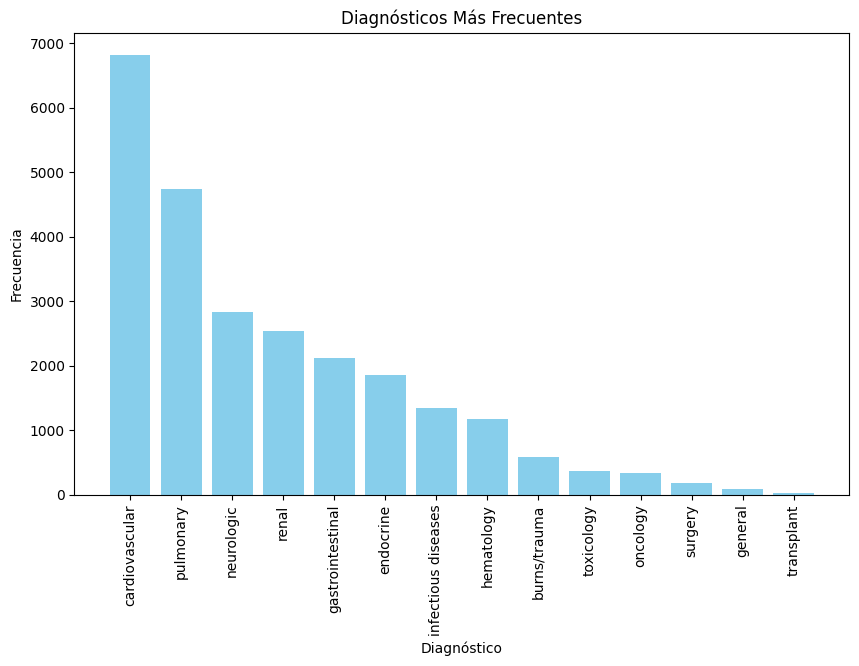

In [43]:
plt.figure(figsize=(10, 6))
plt.bar(df_diagnosticos["Diagnóstico"], df_diagnosticos["Frecuencia"], color='skyblue')
plt.xlabel("Diagnóstico")
plt.ylabel("Frecuencia")
plt.title("Diagnósticos Más Frecuentes")
plt.xticks(rotation=90)  # Rotar las etiquetas del eje X si son muchas
plt.show()



In [44]:
categories_diagnosis = {
    "Enfermedad_Cardiovascular": ["cardiovascular"],
    "Enfermedad_Respiratoria": ["pulmonary"],
    "Enfermedad_Renal": ["renal"],
    "Enfermedad_Neurológica": ["neurologic",],
    "Enfermedad_Endocrinas_y_Metabólica": ["endocrine"],
    "Enfermedad_Infecciosa": ["infectious diseases"],
    "Enfermedad_Gastrointestinal": ["gastrointestinal"],
    "Enfermedad_Hematológica": ["hematology"],
    "Trauma_Quemaduras": ["burns/trauma"],
    "Enfermedad_Ocológica": ["oncology"],
    "Toxicología_y_Farmacología": ["toxicology"],
    "Medicina General_Cirugía_Transplantes": ["surgery", "transplant", "general"],
}
# Asegurar que la columna diagnosisstring no tenga valores nulos
diagnostico["diagnosisstring"] = diagnostico["diagnosisstring"].fillna("")

# Crear nuevas columnas para cada categoría e inicializarlas en 0
for categoria in categories_diagnosis.keys():
    diagnostico[categoria] = 0

# Asignar 1 si un diagnóstico pertenece a una categoría
for index, row in diagnostico.iterrows():
    diagnostico_actual = row["diagnosisstring"].split("|")[0].strip() 
    for categoria, lista_diagnosticos in categories_diagnosis.items():
        if diagnostico_actual in lista_diagnosticos:
            diagnostico.at[index, categoria] = 1

# Mostrar resultado
diagnostico.head(30)


,diagnosisid,patientunitstayid,activeupondischarge,diagnosisoffset,diagnosisstring,icd9code,diagnosispriority,Enfermedad_Cardiovascular,Enfermedad_Respiratoria,Enfermedad_Renal,Enfermedad_Neurológica,Enfermedad_Endocrinas_y_Metabólica,Enfermedad_Infecciosa,Enfermedad_Gastrointestinal,Enfermedad_Hematológica,Trauma_Quemaduras,Enfermedad_Ocológica,Toxicología_y_Farmacología,Medicina General_Cirugía_Transplantes
0,7607199,346380,False,5028,cardiovascular|ventricular disorders|hypertension,"401.9, I10",Other,1,0,0,0,0,0,0,0,0,0,0,0
1,7570429,346380,False,685,neurologic|altered mental status / pain|change...,"780.09, R41.82",Major,0,0,0,1,0,0,0,0,0,0,0,0
2,7705483,346380,True,5035,cardiovascular|shock / hypotension|hypotension,"458.9, I95.9",Major,1,0,0,0,0,0,0,0,0,0,0,0
3,7848601,346380,True,5035,neurologic|altered mental status / pain|schizo...,"295.90, F20.9",Major,0,0,0,1,0,0,0,0,0,0,0,0
4,7451475,346380,False,5028,pulmonary|disorders of vasculature|pulmonary e...,"415.19, I26.99",Major,0,1,0,0,0,0,0,0,0,0,0,0
5,7839760,346380,False,5028,cardiovascular|shock / hypotension|hypotension,"458.9, I95.9",Major,1,0,0,0,0,0,0,0,0,0,0,0
6,7194271,346380,True,5035,renal|disorder of kidney|acute renal failure,"584.9, N17.9",Primary,0,0,1,0,0,0,0,0,0,0,0,0
7,6926969,346380,True,5035,general|other syndromes|syncope,"780.2, R55",Major,0,0,0,0,0,0,0,0,0,0,0,1
8,7517655,346380,False,5028,neurologic|misc|Parkinson's disease,"332.0, G20",Major,0,0,0,1,0,0,0,0,0,0,0,0
9,7251429,346380,False,5028,cardiovascular|shock / hypotension|dehydration,"276.51, E86.0",Major,1,0,0,0,0,0,0,0,0,0,0,0


In [45]:
diagnostico_final = diagnostico.copy()
diagnostico_final = diagnostico_final.drop(columns=["diagnosisid", "diagnosisoffset", "activeupondischarge","diagnosisoffset","diagnosisstring","icd9code","diagnosispriority"])
diagnostico_final_grouped = diagnostico_final.groupby("patientunitstayid").max().reset_index()
diagnostico_final_grouped.head(30)

,patientunitstayid,Enfermedad_Cardiovascular,Enfermedad_Respiratoria,Enfermedad_Renal,Enfermedad_Neurológica,Enfermedad_Endocrinas_y_Metabólica,Enfermedad_Infecciosa,Enfermedad_Gastrointestinal,Enfermedad_Hematológica,Trauma_Quemaduras,Enfermedad_Ocológica,Toxicología_y_Farmacología,Medicina General_Cirugía_Transplantes
0,143870,1,0,0,0,0,0,0,0,0,0,0,0
1,145427,0,0,0,0,0,1,1,0,0,0,0,0
2,151179,1,0,1,0,0,1,1,0,0,1,0,0
3,151867,0,0,0,0,0,0,1,0,0,0,0,0
4,151900,1,1,1,0,1,0,0,1,0,1,0,0
5,152954,1,1,0,0,0,0,0,0,0,0,0,0
6,153972,1,1,0,0,0,0,1,1,0,0,0,0
7,155961,1,1,0,0,0,0,0,0,0,0,0,1
8,156308,1,1,0,0,1,0,0,0,0,1,0,0
9,157016,0,0,0,0,0,0,1,0,0,0,0,1


In [46]:
diagnostico_final_grouped.info()
diagnostico_final_grouped.to_csv("data/diagnosticos.csv", index=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2155 entries, 0 to 2154
Data columns (total 13 columns):
 #   Column                                 Non-Null Count  Dtype
---  ------                                 --------------  -----
 0   patientunitstayid                      2155 non-null   int64
 1   Enfermedad_Cardiovascular              2155 non-null   int64
 2   Enfermedad_Respiratoria                2155 non-null   int64
 3   Enfermedad_Renal                       2155 non-null   int64
 4   Enfermedad_Neurológica                 2155 non-null   int64
 5   Enfermedad_Endocrinas_y_Metabólica     2155 non-null   int64
 6   Enfermedad_Infecciosa                  2155 non-null   int64
 7   Enfermedad_Gastrointestinal            2155 non-null   int64
 8   Enfermedad_Hematológica                2155 non-null   int64
 9   Trauma_Quemaduras                      2155 non-null   int64
 10  Enfermedad_Ocológica                   2155 non-null   int64
 11  Toxicología_y_Farmacología    

## Historial Médico

In [47]:
df_past_history = pd.read_csv("data/pastHistory.csv")
df_past_history.head(10)

,pasthistoryid,patientunitstayid,pasthistoryoffset,pasthistoryenteredoffset,pasthistorynotetype,pasthistorypath,pasthistoryvalue,pasthistoryvaluetext
0,990803,141765,7,12,Comprehensive Progress,notes/Progress Notes/Past History/Past History...,No Health Problems,NoHealthProblems
1,970059,143870,4,10,Comprehensive Progress,notes/Progress Notes/Past History/Past History...,No Health Problems,NoHealthProblems
2,1180401,144815,32,41,Comprehensive Progress,notes/Progress Notes/Past History/Past History...,No Health Problems,NoHealthProblems
3,1194998,145427,8,13,Comprehensive Progress,notes/Progress Notes/Past History/Past History...,No Health Problems,NoHealthProblems
4,896652,147307,53,56,Comprehensive Progress,notes/Progress Notes/Past History/Past History...,No Health Problems,NoHealthProblems
5,1261966,147784,10,20,Comprehensive Progress,notes/Progress Notes/Past History/Past History...,Performed,Performed
6,1261967,147784,10,20,Comprehensive Progress,notes/Progress Notes/Past History/Organ System...,medication dependent,medication dependent
7,1150985,148611,-93,-82,Comprehensive Progress,notes/Progress Notes/Past History/Past History...,No Health Problems,NoHealthProblems
8,1252461,149713,4,9,Comprehensive Progress,notes/Progress Notes/Past History/Past History...,No Health Problems,NoHealthProblems
9,1137517,151179,18,29,Comprehensive Progress,notes/Progress Notes/Past History/Past History...,Performed,Performed


In [48]:
pd.set_option('display.max_colwidth', None)
pd.set_option('display.expand_frame_repr', False)

historial_lista = []

for lista in df_past_history["pasthistorypath"].dropna():
    historial_lista.append(lista)

conteo_historial = Counter(historial_lista)
df_historial = pd.DataFrame(conteo_historial.items(), columns=["Historial", "Frecuencia"])
df_historial = df_historial.sort_values(by="Frecuencia", ascending=False)
df_historial.head(30)

,Historial,Frecuencia
1,notes/Progress Notes/Past History/Past History Obtain Options/Performed,2998
11,notes/Progress Notes/Past History/Organ Systems/Cardiovascular (R)/Hypertension Requiring Treatment/hypertension requiring treatment,1746
21,notes/Progress Notes/Past History/Organ Systems/Endocrine (R)/Insulin Dependent Diabetes/insulin dependent diabetes,457
2,notes/Progress Notes/Past History/Organ Systems/Endocrine (R)/Non-Insulin Dependent Diabetes/medication dependent,397
25,notes/Progress Notes/Past History/Organ Systems/Cardiovascular (R)/Congestive Heart Failure/CHF,392
10,notes/Progress Notes/Past History/Organ Systems/Cardiovascular (R)/Arrhythmias/atrial fibrillation - chronic,292
33,notes/Progress Notes/Past History/Organ Systems/Pulmonary/COPD/COPD - moderate,276
38,notes/Progress Notes/Past History/Organ Systems/Endocrine (R)/Hypothyroidism/hypothyroidism,273
0,notes/Progress Notes/Past History/Past History Obtain Options/No Health Problems,239
24,notes/Progress Notes/Past History/Organ Systems/Pulmonary/Asthma/asthma,205


In [49]:
df_past_history_sin_performed = df_past_history[df_past_history["pasthistorypath"] != "notes/Progress Notes/Past History/Past History Obtain Options/Performed"]

In [50]:
pd.set_option('display.max_colwidth', None)
pd.set_option('display.expand_frame_repr', False)

historial_lista = []

for lista in df_past_history_sin_performed["pasthistorypath"].dropna():
    historial_lista.append(lista)

conteo_historial = Counter(historial_lista)
df_historial = pd.DataFrame(conteo_historial.items(), columns=["Historial", "Frecuencia"])
df_historial = df_historial.sort_values(by="Frecuencia", ascending=False)
df_historial.head(30)

,Historial,Frecuencia
10,notes/Progress Notes/Past History/Organ Systems/Cardiovascular (R)/Hypertension Requiring Treatment/hypertension requiring treatment,1746
20,notes/Progress Notes/Past History/Organ Systems/Endocrine (R)/Insulin Dependent Diabetes/insulin dependent diabetes,457
1,notes/Progress Notes/Past History/Organ Systems/Endocrine (R)/Non-Insulin Dependent Diabetes/medication dependent,397
24,notes/Progress Notes/Past History/Organ Systems/Cardiovascular (R)/Congestive Heart Failure/CHF,392
9,notes/Progress Notes/Past History/Organ Systems/Cardiovascular (R)/Arrhythmias/atrial fibrillation - chronic,292
32,notes/Progress Notes/Past History/Organ Systems/Pulmonary/COPD/COPD - moderate,276
37,notes/Progress Notes/Past History/Organ Systems/Endocrine (R)/Hypothyroidism/hypothyroidism,273
0,notes/Progress Notes/Past History/Past History Obtain Options/No Health Problems,239
23,notes/Progress Notes/Past History/Organ Systems/Pulmonary/Asthma/asthma,205
15,notes/Progress Notes/Past History/Organ Systems/Cardiovascular (R)/Myocardial Infarction/MI - date unknown,204


In [51]:
df_past_history_sin_performed = df_past_history_sin_performed.copy()

df_past_history_sin_performed.loc[:, 'historial_extraido'] = df_past_history_sin_performed['pasthistorypath'].str.extract(
    r'Organ Systems/([^/]+)|Past History Obtain Options/([^/]+)'
).bfill(axis=1).iloc[:, 0]
df_past_history_sin_performed.head(30)

,pasthistoryid,patientunitstayid,pasthistoryoffset,pasthistoryenteredoffset,pasthistorynotetype,pasthistorypath,pasthistoryvalue,pasthistoryvaluetext,historial_extraido
0,990803,141765,7,12,Comprehensive Progress,notes/Progress Notes/Past History/Past History Obtain Options/No Health Problems,No Health Problems,NoHealthProblems,No Health Problems
1,970059,143870,4,10,Comprehensive Progress,notes/Progress Notes/Past History/Past History Obtain Options/No Health Problems,No Health Problems,NoHealthProblems,No Health Problems
2,1180401,144815,32,41,Comprehensive Progress,notes/Progress Notes/Past History/Past History Obtain Options/No Health Problems,No Health Problems,NoHealthProblems,No Health Problems
3,1194998,145427,8,13,Comprehensive Progress,notes/Progress Notes/Past History/Past History Obtain Options/No Health Problems,No Health Problems,NoHealthProblems,No Health Problems
4,896652,147307,53,56,Comprehensive Progress,notes/Progress Notes/Past History/Past History Obtain Options/No Health Problems,No Health Problems,NoHealthProblems,No Health Problems
6,1261967,147784,10,20,Comprehensive Progress,notes/Progress Notes/Past History/Organ Systems/Endocrine (R)/Non-Insulin Dependent Diabetes/medication dependent,medication dependent,medication dependent,Endocrine (R)
7,1150985,148611,-93,-82,Comprehensive Progress,notes/Progress Notes/Past History/Past History Obtain Options/No Health Problems,No Health Problems,NoHealthProblems,No Health Problems
8,1252461,149713,4,9,Comprehensive Progress,notes/Progress Notes/Past History/Past History Obtain Options/No Health Problems,No Health Problems,NoHealthProblems,No Health Problems
10,1137518,151179,18,29,Comprehensive Progress,notes/Progress Notes/Past History/Organ Systems/Hematology/Oncology (R)/Cancer/Metastases/lung,lung,lung,Hematology
11,1137519,151179,18,29,Comprehensive Progress,notes/Progress Notes/Past History/Organ Systems/Hematology/Oncology (R)/Cancer/Cancer-Primary Site/other,other,other,Hematology


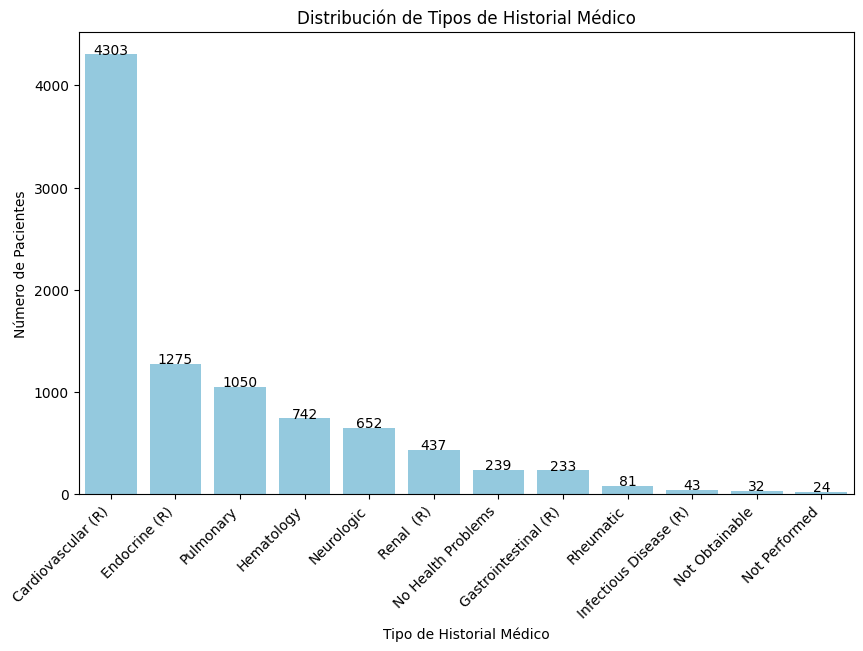

In [52]:

historial_counts = df_past_history_sin_performed['historial_extraido'].value_counts()

plt.figure(figsize=(10, 6))
sns.barplot(x=historial_counts.index, y=historial_counts.values, color="skyblue")

# Personalizar etiquetas
plt.xticks(rotation=45, ha='right')
plt.xlabel("Tipo de Historial Médico")
plt.ylabel("Número de Pacientes")
plt.title("Distribución de Tipos de Historial Médico")

# Mostrar valores en las barras
for i, v in enumerate(historial_counts.values):
    plt.text(i, v + 1, str(v), ha='center', fontsize=10)

# Mostrar el gráfico
plt.show()


In [53]:
renombrar = {
    "Cardiovascular (R)": "Tuvo_problemas_Cardivaculares",
    "Endocrine (R)": "Tuvo_problemas_Endocrinos",
    "Pulmonary": "Tuvo_problemas_Respiratorios",
    "Hematology": "Tuvo_problemas_Hematologicos",
    "Neurologic": "Tuvo_problemas_Neurologicos",
    "Renal  (R)": "Tuvo_problemas_Renales",
    "No Health Problems": "No_tuvo_problemas",
    "Gastrointestinal (R)": "Tuvo_problemas_Gastrointestinales",
    "Rheumatic": "Tuvo_problemas_Reumatologicos",
    "Infectious Disease (R)": "tuvo_problemas_Infecciosos",
    "Not Obtainable": "Historial_no_disponible",
    "Not Performed": "Historial_no_disponible"
}
df_past_history_sin_performed['historial_extraido'] = df_past_history_sin_performed['historial_extraido'].replace(renombrar)
df_past_history_sin_performed.head(30)

,pasthistoryid,patientunitstayid,pasthistoryoffset,pasthistoryenteredoffset,pasthistorynotetype,pasthistorypath,pasthistoryvalue,pasthistoryvaluetext,historial_extraido
0,990803,141765,7,12,Comprehensive Progress,notes/Progress Notes/Past History/Past History Obtain Options/No Health Problems,No Health Problems,NoHealthProblems,No_tuvo_problemas
1,970059,143870,4,10,Comprehensive Progress,notes/Progress Notes/Past History/Past History Obtain Options/No Health Problems,No Health Problems,NoHealthProblems,No_tuvo_problemas
2,1180401,144815,32,41,Comprehensive Progress,notes/Progress Notes/Past History/Past History Obtain Options/No Health Problems,No Health Problems,NoHealthProblems,No_tuvo_problemas
3,1194998,145427,8,13,Comprehensive Progress,notes/Progress Notes/Past History/Past History Obtain Options/No Health Problems,No Health Problems,NoHealthProblems,No_tuvo_problemas
4,896652,147307,53,56,Comprehensive Progress,notes/Progress Notes/Past History/Past History Obtain Options/No Health Problems,No Health Problems,NoHealthProblems,No_tuvo_problemas
6,1261967,147784,10,20,Comprehensive Progress,notes/Progress Notes/Past History/Organ Systems/Endocrine (R)/Non-Insulin Dependent Diabetes/medication dependent,medication dependent,medication dependent,Tuvo_problemas_Endocrinos
7,1150985,148611,-93,-82,Comprehensive Progress,notes/Progress Notes/Past History/Past History Obtain Options/No Health Problems,No Health Problems,NoHealthProblems,No_tuvo_problemas
8,1252461,149713,4,9,Comprehensive Progress,notes/Progress Notes/Past History/Past History Obtain Options/No Health Problems,No Health Problems,NoHealthProblems,No_tuvo_problemas
10,1137518,151179,18,29,Comprehensive Progress,notes/Progress Notes/Past History/Organ Systems/Hematology/Oncology (R)/Cancer/Metastases/lung,lung,lung,Tuvo_problemas_Hematologicos
11,1137519,151179,18,29,Comprehensive Progress,notes/Progress Notes/Past History/Organ Systems/Hematology/Oncology (R)/Cancer/Cancer-Primary Site/other,other,other,Tuvo_problemas_Hematologicos


In [54]:
# Supongamos que el dataframe original se llama df
df_past_history_sin_performed_final = df_past_history_sin_performed[['patientunitstayid', 'historial_extraido']].copy()

# Crear una columna con valor 1 para indicar presencia de la categoría
df_past_history_sin_performed_final['value'] = 1

# Pivotear la tabla para tener una matriz de categorías
df_past_history_sin_performed_final_pivot = df_past_history_sin_performed_final.pivot_table(index='patientunitstayid', columns='historial_extraido', values='value', fill_value=0)

# Resetear el índice para que patientunitstayid sea una columna normal
df_past_history_sin_performed_final_pivot.reset_index(inplace=True)

df_past_history_sin_performed_final_pivot.head(30)

historial_extraido,patientunitstayid,Historial_no_disponible,No_tuvo_problemas,Tuvo_problemas_Cardivaculares,Tuvo_problemas_Endocrinos,Tuvo_problemas_Gastrointestinales,Tuvo_problemas_Hematologicos,Tuvo_problemas_Neurologicos,Tuvo_problemas_Renales,Tuvo_problemas_Respiratorios,Tuvo_problemas_Reumatologicos,tuvo_problemas_Infecciosos
0,141765,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,143870,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,144815,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,145427,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,147307,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,147784,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,148611,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,149713,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,151179,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
9,151867,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [55]:
df_past_history_sin_performed_final_pivot.info()
df_past_history_sin_performed_final_pivot.to_csv("data/historial_pacientes.csv", index=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2049 entries, 0 to 2048
Data columns (total 12 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   patientunitstayid                  2049 non-null   int64  
 1   Historial_no_disponible            2049 non-null   float64
 2   No_tuvo_problemas                  2049 non-null   float64
 3   Tuvo_problemas_Cardivaculares      2049 non-null   float64
 4   Tuvo_problemas_Endocrinos          2049 non-null   float64
 5   Tuvo_problemas_Gastrointestinales  2049 non-null   float64
 6   Tuvo_problemas_Hematologicos       2049 non-null   float64
 7   Tuvo_problemas_Neurologicos        2049 non-null   float64
 8   Tuvo_problemas_Renales             2049 non-null   float64
 9   Tuvo_problemas_Respiratorios       2049 non-null   float64
 10  Tuvo_problemas_Reumatologicos      2049 non-null   float64
 11  tuvo_problemas_Infecciosos         2049 non-null   float

## Apache Variables


In [56]:
# Establecer el número máximo de columnas a mostrar (None significa sin límite)
pd.set_option('display.max_columns', None)

# Cargar el archivo CSV y mostrar las primeras 10 filas con todas las columnas
df_apache_aps_var = pd.read_csv("data/apacheApsVar.csv")
print(df_apache_aps_var.shape[1])
print(df_apache_aps_var.head(10))

26
   apacheapsvarid  patientunitstayid  intubated  vent  dialysis  eyes  motor  verbal  meds  urine   wbc  temperature  respiratoryrate  sodium  heartrate  meanbp    ph  hematocrit  creatinine  albumin  pao2  pco2   bun  glucose  bilirubin  fio2
0           92788             141765          0     0         0     4      6       5     0   -1.0  10.2         36.2               39   139.0         88     108 -1.00        37.8        1.04     -1.0  -1.0  -1.0  28.0       61       -1.0    -1
1            8893             143870          0     0         0     4      6       5     0   -1.0  11.7         36.4               60   133.0         40      47 -1.00        34.1        1.14     -1.0  -1.0  -1.0  14.0      140       -1.0    -1
2           79585             144815          0     0         0     4      6       5     0   -1.0   7.9         36.7                6   141.0        131      61 -1.00        36.6        0.63      3.6  -1.0  -1.0   6.0       82        0.5    -1
3          203242    

In [57]:
# Reemplazar -1 con NaN para detectar valores faltantes
df_apache_aps_var2 = df_apache_aps_var.copy()
df_apache_aps_var2.replace(-1, pd.NA, inplace=True)

# Calcular porcentaje de valores faltantes por columna
missing_percentage = df_apache_aps_var2.isna().sum() / len(df_apache_aps_var2) * 100

print(missing_percentage)

apacheapsvarid        0.000000
patientunitstayid     0.000000
intubated             0.000000
vent                  0.000000
dialysis              0.000000
eyes                  4.535147
motor                 4.535147
verbal                4.535147
meds                  3.401361
urine                51.700680
wbc                  31.201814
temperature           9.659864
respiratoryrate       2.585034
sodium               25.170068
heartrate             1.904762
meanbp                2.721088
ph                   81.632653
hematocrit           28.934240
creatinine           25.442177
albumin              61.269841
pao2                 81.632653
pco2                 81.632653
bun                  25.623583
glucose              17.596372
bilirubin            65.396825
fio2                 81.632653
dtype: float64


In [58]:
# Filtrar filas donde ninguna columna tiene NaN
df_sin_faltantes = df_apache_aps_var2.dropna()

# Mostrar las primeras filas del nuevo dataframe
print(df_sin_faltantes.head())

# Ver cuántas filas cumplen esta condición
print(f"Total de filas sin valores NaN: {len(df_sin_faltantes)}")

     apacheapsvarid  patientunitstayid  intubated  vent  dialysis eyes motor verbal meds      urine   wbc temperature respiratoryrate sodium heartrate meanbp     ph hematocrit creatinine albumin   pao2  pco2   bun glucose bilirubin fio2
148           63077             249805          0     0         0    4     6      4    0  2912.2848   9.0        36.8               6  138.0       122     56   7.23       30.1        0.6     2.5   93.0  29.0  20.0     371       0.3   21
161         2400400             261520          1     1         0    1     1      1    0  2769.2064  21.0        32.9              56  135.0        67    131  7.341       39.3       0.61     4.4   82.8  46.5  24.0     315       0.9   60
172           50255             272886          1     1         0    1     5      1    0  1918.5984  16.3       35.89              47  129.0       120    135   7.38       34.1        0.6     4.3  115.0  39.0   8.0     146       0.5   40
196         1830094             297175          0   

In [59]:
# Contar el número de valores NaN por columna
na_por_columna = df_apache_aps_var2.isna().sum()

# Mostrar los resultados
print(na_por_columna)

apacheapsvarid          0
patientunitstayid       0
intubated               0
vent                    0
dialysis                0
eyes                  100
motor                 100
verbal                100
meds                   75
urine                1140
wbc                   688
temperature           213
respiratoryrate        57
sodium                555
heartrate              42
meanbp                 60
ph                   1800
hematocrit            638
creatinine            561
albumin              1351
pao2                 1800
pco2                 1800
bun                   565
glucose               388
bilirubin            1442
fio2                 1800
dtype: int64


## APACHE Patient Result

In [60]:
# Establecer el número máximo de columnas a mostrar (None significa sin límite)
pd.set_option('display.max_columns', None)

# Cargar el archivo CSV y mostrar las primeras 10 filas con todas las columnas
df_apache_patient_res = pd.read_csv("data/apachePatientResult.csv")
print(df_apache_patient_res.shape[1])
print(df_apache_patient_res.head(10))


23
   apachepatientresultsid  patientunitstayid physicianspeciality physicianinterventioncategory  acutephysiologyscore  apachescore apacheversion  predictedicumortality actualicumortality  predictediculos  actualiculos  predictedhospitalmortality actualhospitalmortality  predictedhospitallos  actualhospitallos  preopmi  preopcardiaccath  ptcawithin24h  unabridgedunitlos  unabridgedhosplos  actualventdays  predventdays  unabridgedactualventdays
0                   31917             141765         hospitalist                       Unknown                    23           47            IV               0.008247              ALIVE         0.722231        1.5625                    0.037320                   ALIVE              2.881710             1.8222        0                 0              0             1.5625             1.8222             NaN           NaN                       NaN
1                   31918             141765         hospitalist                       Unknown           

## Análisis Valores Faltantes

In [61]:
df_apache_patient_distinct = df_apache_patient_res.drop_duplicates(subset='patientunitstayid', keep='first')
print(df_apache_patient_distinct.shape[0])
df_apache_patient_distinct.head(10)

1838


,apachepatientresultsid,patientunitstayid,physicianspeciality,physicianinterventioncategory,acutephysiologyscore,apachescore,apacheversion,predictedicumortality,actualicumortality,predictediculos,actualiculos,predictedhospitalmortality,actualhospitalmortality,predictedhospitallos,actualhospitallos,preopmi,preopcardiaccath,ptcawithin24h,unabridgedunitlos,unabridgedhosplos,actualventdays,predventdays,unabridgedactualventdays
0,31917,141765,hospitalist,Unknown,23,47,IV,0.008247,ALIVE,0.722231,1.5625,0.037320,ALIVE,2.881710,1.8222,0,0,0,1.5625,1.8222,NaN,NaN,NaN
2,21398,143870,family practice,Unknown,43,60,IVa,0.015707,ALIVE,3.021671,0.5506,0.028932,ALIVE,6.032627,0.8465,0,0,0,0.5506,0.8465,NaN,NaN,NaN
4,181,144815,internal medicine,I,25,25,IV,0.001834,ALIVE,0.592446,0.7784,0.004253,ALIVE,2.196294,0.8063,0,0,0,0.7784,0.8063,NaN,NaN,NaN
6,106474,145427,surgery-trauma,Unknown,26,37,IV,0.009514,ALIVE,3.188109,0.9506,0.021407,ALIVE,10.930641,3.6618,0,0,0,0.9506,3.6618,NaN,NaN,NaN
8,133082,147307,unknown,Unknown,15,20,IV,0.001609,ALIVE,0.674527,0.3305,0.002514,ALIVE,0.758865,0.7674,0,0,0,0.3305,0.7674,NaN,NaN,NaN
10,80043,147784,critical care medicine (CCM),I,53,64,IV,0.058546,ALIVE,6.470806,1.6534,0.076877,ALIVE,12.645561,2.7514,0,0,0,1.6534,2.7514,1.0,4.83146,1.0
12,42918,148611,internal medicine,I,16,16,IVa,0.001274,ALIVE,0.412327,0.8805,0.002193,ALIVE,0.590481,0.8840,0,0,0,0.8805,0.8840,NaN,NaN,NaN
14,474,149713,family practice,I,33,57,IVa,0.032460,ALIVE,2.036864,0.8187,0.090603,ALIVE,4.191341,2.0729,0,0,0,0.8187,2.0729,NaN,NaN,NaN
16,64285,151179,pulmonary/CCM,III,125,141,IV,0.667645,ALIVE,3.496731,3.4055,0.868431,EXPIRED,7.410329,6.4396,0,0,0,3.4055,6.4396,NaN,NaN,NaN
18,16533,151867,surgery-general,Unknown,14,14,IVa,0.002713,ALIVE,2.281705,1.3076,0.005369,ALIVE,8.936767,5.0188,0,0,0,1.3076,5.0188,NaN,NaN,NaN


In [62]:

df_apache_var_patient = df_apache_aps_var.merge(df_apache_patient_distinct[['patientunitstayid', 'acutephysiologyscore']], on='patientunitstayid', how='left')
print(df_apache_var_patient.shape[0])
df_apache_var_patient.head(10)


2205


,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore
0,92788,141765,0,0,0,4,6,5,0,-1.0,10.2,36.2,39,139.0,88,108,-1.00,37.8,1.04,-1.0,-1.0,-1.0,28.0,61,-1.0,-1,23.0
1,8893,143870,0,0,0,4,6,5,0,-1.0,11.7,36.4,60,133.0,40,47,-1.00,34.1,1.14,-1.0,-1.0,-1.0,14.0,140,-1.0,-1,43.0
2,79585,144815,0,0,0,4,6,5,0,-1.0,7.9,36.7,6,141.0,131,61,-1.00,36.6,0.63,3.6,-1.0,-1.0,6.0,82,0.5,-1,25.0
3,203242,145427,0,0,0,4,6,5,0,-1.0,21.1,36.2,41,141.0,49,72,-1.00,40.4,1.05,-1.0,-1.0,-1.0,14.0,118,-1.0,-1,26.0
4,154681,147307,0,0,0,4,6,5,0,-1.0,-1.0,36.8,33,-1.0,115,107,-1.00,-1.0,-1.00,-1.0,-1.0,-1.0,-1.0,-1,-1.0,-1,15.0
5,53115,147784,1,0,0,4,6,3,0,-1.0,12.6,36.0,53,142.0,109,130,7.38,40.9,0.54,2.8,76.0,81.0,17.0,151,0.7,60,53.0
6,2143574,148611,0,0,0,4,6,5,0,-1.0,7.3,36.2,45,142.0,105,108,-1.00,47.5,0.82,-1.0,-1.0,-1.0,7.0,112,-1.0,-1,16.0
7,119324,149433,0,0,0,-1,-1,-1,-1,-1.0,-1.0,-1.0,-1,-1.0,98,-1,-1.00,-1.0,-1.00,-1.0,-1.0,-1.0,-1.0,-1,-1.0,-1,NaN
8,53149,149713,0,0,0,4,6,4,0,-1.0,9.9,36.3,54,133.0,94,65,-1.00,38.7,0.61,3.8,-1.0,-1.0,11.0,97,0.5,-1,33.0
9,4682,151179,0,0,0,4,6,5,0,-1.0,49.8,22.2,52,139.0,171,40,7.23,37.7,3.02,1.3,91.0,26.0,72.0,58,0.2,28,125.0


In [63]:
df_apache_var_patient_valid = df_apache_var_patient[df_apache_var_patient['acutephysiologyscore'].notna()].copy()
print(df_apache_var_patient_valid.shape[0])
df_apache_var_patient_valid.head(10)

1838


,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore
0,92788,141765,0,0,0,4,6,5,0,-1.0,10.2,36.2,39,139.0,88,108,-1.00,37.8,1.04,-1.0,-1.0,-1.0,28.0,61,-1.0,-1,23.0
1,8893,143870,0,0,0,4,6,5,0,-1.0,11.7,36.4,60,133.0,40,47,-1.00,34.1,1.14,-1.0,-1.0,-1.0,14.0,140,-1.0,-1,43.0
2,79585,144815,0,0,0,4,6,5,0,-1.0,7.9,36.7,6,141.0,131,61,-1.00,36.6,0.63,3.6,-1.0,-1.0,6.0,82,0.5,-1,25.0
3,203242,145427,0,0,0,4,6,5,0,-1.0,21.1,36.2,41,141.0,49,72,-1.00,40.4,1.05,-1.0,-1.0,-1.0,14.0,118,-1.0,-1,26.0
4,154681,147307,0,0,0,4,6,5,0,-1.0,-1.0,36.8,33,-1.0,115,107,-1.00,-1.0,-1.00,-1.0,-1.0,-1.0,-1.0,-1,-1.0,-1,15.0
5,53115,147784,1,0,0,4,6,3,0,-1.0,12.6,36.0,53,142.0,109,130,7.38,40.9,0.54,2.8,76.0,81.0,17.0,151,0.7,60,53.0
6,2143574,148611,0,0,0,4,6,5,0,-1.0,7.3,36.2,45,142.0,105,108,-1.00,47.5,0.82,-1.0,-1.0,-1.0,7.0,112,-1.0,-1,16.0
8,53149,149713,0,0,0,4,6,4,0,-1.0,9.9,36.3,54,133.0,94,65,-1.00,38.7,0.61,3.8,-1.0,-1.0,11.0,97,0.5,-1,33.0
9,4682,151179,0,0,0,4,6,5,0,-1.0,49.8,22.2,52,139.0,171,40,7.23,37.7,3.02,1.3,91.0,26.0,72.0,58,0.2,28,125.0
10,92929,151867,0,0,0,4,6,5,0,-1.0,12.8,37.1,34,136.0,100,102,-1.00,40.2,1.07,-1.0,-1.0,-1.0,10.0,113,-1.0,-1,14.0


In [64]:


# Valores normales para reemplazar los -1 en cada variable
normal_values = {
    'temperature': 36.8,      # Temperatura
    'wbc': 8.0,              # WBC
    'ph': 7.4,               # pH
    'creatinine': 1.0,       # Creatinina
    'hematocrit': 40,        # Hematocrito
    'sodium': 140,           # Sodio
    'pao2': 90,              # PaO₂
    'pco2': 40,              # PCO₂
    'respiratoryrate': 16,   # Frecuencia respiratoria (valor promedio)
    'heartrate': 80,         # Frecuencia cardíaca (valor promedio)
    'meanbp': 90,            # Presión arterial media (valor promedio)
    'eyes': 4,               # Glasgow (GCS) - ojos (completamente espontáneos)
    'motor': 6,              # Glasgow (GCS) - motor (obediente)
    'verbal': 5,             # Glasgow (GCS) - verbal (orientado)
}

# Reemplazar los valores -1 por los normales en cada columna
for col, normal in normal_values.items():
    if col in df_apache_var_patient_valid.columns:
        df_apache_var_patient_valid[f'{col}_was_missing'] = df_apache_var_patient_valid[col] == -1.0
        df_apache_var_patient_valid[col] = df_apache_var_patient_valid[col].replace(-1.0, normal)

In [65]:
df_apache_var_patient_valid.head(10)

,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore,temperature_was_missing,wbc_was_missing,ph_was_missing,creatinine_was_missing,hematocrit_was_missing,sodium_was_missing,pao2_was_missing,pco2_was_missing,respiratoryrate_was_missing,heartrate_was_missing,meanbp_was_missing,eyes_was_missing,motor_was_missing,verbal_was_missing
0,92788,141765,0,0,0,4,6,5,0,-1.0,10.2,36.2,39,139.0,88,108,7.40,37.8,1.04,-1.0,90.0,40.0,28.0,61,-1.0,-1,23.0,False,False,True,False,False,False,True,True,False,False,False,False,False,False
1,8893,143870,0,0,0,4,6,5,0,-1.0,11.7,36.4,60,133.0,40,47,7.40,34.1,1.14,-1.0,90.0,40.0,14.0,140,-1.0,-1,43.0,False,False,True,False,False,False,True,True,False,False,False,False,False,False
2,79585,144815,0,0,0,4,6,5,0,-1.0,7.9,36.7,6,141.0,131,61,7.40,36.6,0.63,3.6,90.0,40.0,6.0,82,0.5,-1,25.0,False,False,True,False,False,False,True,True,False,False,False,False,False,False
3,203242,145427,0,0,0,4,6,5,0,-1.0,21.1,36.2,41,141.0,49,72,7.40,40.4,1.05,-1.0,90.0,40.0,14.0,118,-1.0,-1,26.0,False,False,True,False,False,False,True,True,False,False,False,False,False,False
4,154681,147307,0,0,0,4,6,5,0,-1.0,8.0,36.8,33,140.0,115,107,7.40,40.0,1.00,-1.0,90.0,40.0,-1.0,-1,-1.0,-1,15.0,False,True,True,True,True,True,True,True,False,False,False,False,False,False
5,53115,147784,1,0,0,4,6,3,0,-1.0,12.6,36.0,53,142.0,109,130,7.38,40.9,0.54,2.8,76.0,81.0,17.0,151,0.7,60,53.0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
6,2143574,148611,0,0,0,4,6,5,0,-1.0,7.3,36.2,45,142.0,105,108,7.40,47.5,0.82,-1.0,90.0,40.0,7.0,112,-1.0,-1,16.0,False,False,True,False,False,False,True,True,False,False,False,False,False,False
8,53149,149713,0,0,0,4,6,4,0,-1.0,9.9,36.3,54,133.0,94,65,7.40,38.7,0.61,3.8,90.0,40.0,11.0,97,0.5,-1,33.0,False,False,True,False,False,False,True,True,False,False,False,False,False,False
9,4682,151179,0,0,0,4,6,5,0,-1.0,49.8,22.2,52,139.0,171,40,7.23,37.7,3.02,1.3,91.0,26.0,72.0,58,0.2,28,125.0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
10,92929,151867,0,0,0,4,6,5,0,-1.0,12.8,37.1,34,136.0,100,102,7.40,40.2,1.07,-1.0,90.0,40.0,10.0,113,-1.0,-1,14.0,False,False,True,False,False,False,True,True,False,False,False,False,False,False


In [66]:
def score_aps(row):
    score = 0

    # GCS (Glasgow Coma Scale) -> eyes, motor, verbal
    if row['eyes'] != -1 and row['motor'] != -1 and row['verbal'] != -1:
        gcs = row['eyes'] + row['motor'] + row['verbal']
        score += 15 - gcs

    # Temperatura (°C)
    temp = row['temperature']
    if temp != -1:
        if temp >= 41 or temp < 30:
            score += 4
        elif 39 <= temp < 41 or 30 <= temp < 32:
            score += 3
        elif 38.5 <= temp < 39 or 32 <= temp < 34:
            score += 1
        elif 34 <= temp < 36 or 36 <= temp < 38.5:
            score += 0

    # Presión arterial media (mmHg)
    meanbp = row['meanbp']
    if meanbp != -1:
        if meanbp < 50 or meanbp > 159:
            score += 4
        elif 50 <= meanbp < 70 or 110 <= meanbp <= 159:
            score += 2
        elif 70 <= meanbp < 110:
            score += 0

    # Frecuencia cardíaca
    hr = row['heartrate']
    if hr != -1:
        if hr >= 180 or hr < 40:
            score += 4
        elif 140 <= hr < 180 or 40 <= hr < 55:
            score += 3
        elif 110 <= hr < 140 or 55 <= hr < 70:
            score += 2
        elif 70 <= hr < 110:
            score += 0

    # Frecuencia respiratoria
    rr = row['respiratoryrate']
    if rr != -1:
        if rr >= 50 or rr < 6:
            score += 4
        elif 35 <= rr < 50 or 6 <= rr < 10:
            score += 3
        elif 25 <= rr < 35 or 10 <= rr < 12:
            score += 1
        elif 12 <= rr < 25:
            score += 0

    # Oxigenación - PaO₂
    pao2 = row['pao2']
    if pao2 != -1:
        if pao2 < 55:
            score += 4
        elif 55 <= pao2 < 60:
            score += 3
        elif 60 <= pao2 < 70:
            score += 2
        elif 70 <= pao2 < 80:
            score += 1
        elif pao2 >= 80:
            score += 0

    # pH
    ph = row['ph']
    if ph != -1:
        if ph < 7.15 or ph >= 7.7:
            score += 4
        elif 7.15 <= ph < 7.2 or 7.6 <= ph < 7.7:
            score += 3
        elif 7.2 <= ph < 7.25 or 7.5 <= ph < 7.6:
            score += 2
        elif 7.25 <= ph < 7.33 or 7.45 <= ph < 7.5:
            score += 1
        elif 7.33 <= ph < 7.45:
            score += 0

    # Sodio
    sodium = row['sodium']
    if sodium != -1:
        if sodium >= 180 or sodium < 110:
            score += 4
        elif 160 <= sodium < 180 or 110 <= sodium < 120:
            score += 3
        elif 155 <= sodium < 160 or 120 <= sodium < 130:
            score += 2
        elif 130 <= sodium < 150:
            score += 0
        elif 150 <= sodium < 155:
            score += 1

    # Creatinina
    creat = row['creatinine']
    if creat != -1:
        if creat >= 3.5:
            score += 4
        elif 2.0 <= creat < 3.5:
            score += 3
        elif 1.5 <= creat < 2.0:
            score += 2
        elif 0.6 <= creat < 1.5:
            score += 0
        elif creat < 0.6:
            score += 2

    # Hematocrito
    hct = row['hematocrit']
    if hct != -1:
        if hct >= 60 or hct < 20:
            score += 4
        elif 50 <= hct < 60 or 20 <= hct < 30:
            score += 2
        elif 46 <= hct < 50 or 30 <= hct < 46:
            score += 0

    # WBC
    wbc = row['wbc']
    if wbc != -1:
        if wbc >= 40 or wbc < 1:
            score += 4
        elif 20 <= wbc < 40 or 1 <= wbc < 3:
            score += 2
        elif 15 <= wbc < 20 or 3 <= wbc < 5:
            score += 1
        elif 5 <= wbc < 15:
            score += 0

    # PCO₂
    pco2 = row['pco2']
    if pco2 != -1:
        if pco2 >= 77 or pco2 < 20:
            score += 4
        elif 60 <= pco2 < 77 or 20 <= pco2 < 30:
            score += 3
        elif 50 <= pco2 < 60 or 30 <= pco2 < 35:
            score += 2
        elif 35 <= pco2 < 50:
            score += 0

    return score


   patientunitstayid  acutephysiologyscore  aps_est  aps_diff
0             141765                  23.0        3      20.0
1             143870                  43.0       11      32.0
2             144815                  25.0        7      18.0
3             145427                  26.0        8      18.0
4             147307                  15.0        3      12.0


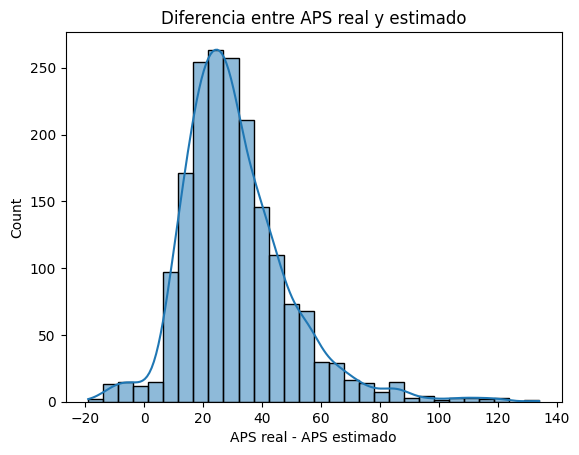

In [67]:
# Calcular el APS estimado
df_apache_var_patient_valid['aps_est'] = df_apache_var_patient_valid.apply(score_aps, axis=1)

# Calcular la diferencia con el APS real
df_apache_var_patient_valid['aps_diff'] = df_apache_var_patient_valid['acutephysiologyscore'] - df_apache_var_patient_valid['aps_est']

# Mostrar algunos resultados
print(df_apache_var_patient_valid[['patientunitstayid', 'acutephysiologyscore', 'aps_est', 'aps_diff']].head())

# Visualizar la diferencia
import seaborn as sns
import matplotlib.pyplot as plt

sns.histplot(df_apache_var_patient_valid['aps_diff'], bins=30, kde=True)
plt.title('Diferencia entre APS real y estimado')
plt.xlabel('APS real - APS estimado')
plt.show()

In [68]:
df_apache_var_patient_sin_faltantes = df_sin_faltantes.merge(df_apache_patient_distinct[['patientunitstayid', 'acutephysiologyscore']], on='patientunitstayid', how='left')
print(df_apache_var_patient_sin_faltantes.shape[0])
df_apache_var_patient_sin_faltantes.head(10)

81


,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore
0,63077,249805,0,0,0,4,6,4,0,2912.2848,9.0,36.8,6,138.0,122,56,7.23,30.1,0.6,2.5,93.0,29.0,20.0,371,0.3,21,57.0
1,2400400,261520,1,1,0,1,1,1,0,2769.2064,21.0,32.9,56,135.0,67,131,7.341,39.3,0.61,4.4,82.8,46.5,24.0,315,0.9,60,119.0
2,50255,272886,1,1,0,1,5,1,0,1918.5984,16.3,35.89,47,129.0,120,135,7.38,34.1,0.6,4.3,115.0,39.0,8.0,146,0.5,40,54.0
3,1830094,297175,0,0,0,4,6,5,0,1498.9536,5.7,36.6,34,140.0,122,71,7.275,38.5,0.36,4.1,66.4,93.1,10.0,121,0.5,40,37.0
4,1838880,301185,0,0,0,4,6,4,0,1361.5776,13.1,36.7,36,137.0,162,148,7.36,31.8,1.2,2.6,67.0,43.0,34.0,92,0.2,25,NaN
5,1415242,316382,0,0,0,1,1,1,0,947.2896,11.8,36.8,13,152.0,104,61,7.455,24.2,0.52,3.4,91.0,43.2,28.0,141,0.3,28,NaN
6,1865469,341780,0,0,0,3,6,4,0,1980.1152,21.3,36.6,27,131.0,110,40,7.28,31.1,3.37,4.0,39.3,59.6,34.0,200,2.9,30,78.0
7,1546969,345142,1,0,0,4,6,1,0,2945.376,7.8,37.0,31,139.0,100,62,7.479,26.6,0.6,2.8,78.8,46.0,10.0,108,0.3,50,NaN
8,1522895,350551,1,1,0,3,6,1,0,1161.216,9.2,36.9,28,149.0,99,138,7.451,30.6,1.16,3.6,69.4,52.2,33.0,145,0.4,40,NaN
9,1497180,369237,0,0,0,4,4,4,0,372.384,11.1,36.4,6,144.0,54,152,7.31,32.7,3.3,3.0,78.6,49.1,22.0,109,0.4,28,69.0


In [69]:
df_apache_var_patient_valid_sin_faltantes = df_apache_var_patient_sin_faltantes[df_apache_var_patient_sin_faltantes['acutephysiologyscore'].notna()].copy()
print(df_apache_var_patient_valid_sin_faltantes.shape[0])
df_apache_var_patient_valid_sin_faltantes.head(10)

65


,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore
0,63077,249805,0,0,0,4,6,4,0,2912.2848,9.0,36.8,6,138.0,122,56,7.23,30.1,0.6,2.5,93.0,29.0,20.0,371,0.3,21,57.0
1,2400400,261520,1,1,0,1,1,1,0,2769.2064,21.0,32.9,56,135.0,67,131,7.341,39.3,0.61,4.4,82.8,46.5,24.0,315,0.9,60,119.0
2,50255,272886,1,1,0,1,5,1,0,1918.5984,16.3,35.89,47,129.0,120,135,7.38,34.1,0.6,4.3,115.0,39.0,8.0,146,0.5,40,54.0
3,1830094,297175,0,0,0,4,6,5,0,1498.9536,5.7,36.6,34,140.0,122,71,7.275,38.5,0.36,4.1,66.4,93.1,10.0,121,0.5,40,37.0
6,1865469,341780,0,0,0,3,6,4,0,1980.1152,21.3,36.6,27,131.0,110,40,7.28,31.1,3.37,4.0,39.3,59.6,34.0,200,2.9,30,78.0
9,1497180,369237,0,0,0,4,4,4,0,372.384,11.1,36.4,6,144.0,54,152,7.31,32.7,3.3,3.0,78.6,49.1,22.0,109,0.4,28,69.0
11,1394277,401177,0,0,0,4,6,5,0,2835.5616,14.8,37.2,18,131.0,123,94,7.26,44.5,1.0,4.0,56.0,34.0,21.0,633,0.7,21,32.0
12,229861,436993,1,0,0,3,5,4,0,857.088,8.9,36.7,12,139.0,98,137,7.386,30.8,1.6,2.2,148.4,39.4,23.0,107,0.5,100,65.0
14,297278,524799,1,1,0,4,6,5,0,2934.144,28.8,35.9,11,145.0,114,48,7.4,32.9,0.63,4.6,194.0,38.0,9.0,227,0.2,50,44.0
15,179055,525046,1,0,0,1,1,1,0,378.0864,38.9,36.3,9,151.0,150,45,7.311,39.9,3.7,2.4,116.1,29.1,19.0,216,1.1,70,148.0


   patientunitstayid  acutephysiologyscore  aps_est  aps_diff
0             249805                  57.0       13      44.0
1             261520                 119.0       23      96.0
2             272886                  54.0       18      36.0
3             297175                  37.0       12      25.0
6             341780                  78.0       21      57.0


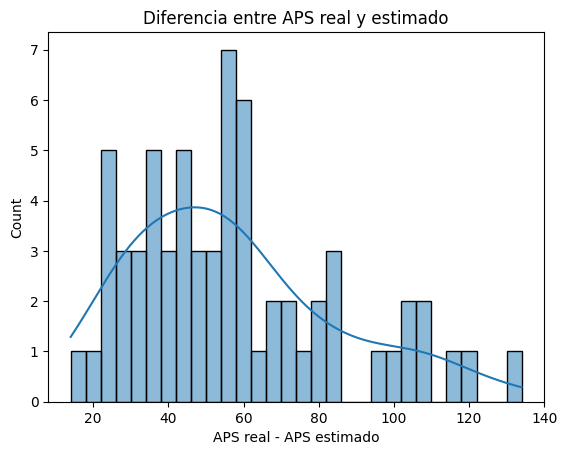

In [70]:
# Calcular el APS estimado
df_apache_var_patient_valid_sin_faltantes['aps_est'] = df_apache_var_patient_valid_sin_faltantes.apply(score_aps, axis=1)

# Calcular la diferencia con el APS real
df_apache_var_patient_valid_sin_faltantes['aps_diff'] = df_apache_var_patient_valid_sin_faltantes['acutephysiologyscore'] - df_apache_var_patient_valid_sin_faltantes['aps_est']

# Mostrar algunos resultados
print(df_apache_var_patient_valid_sin_faltantes[['patientunitstayid', 'acutephysiologyscore', 'aps_est', 'aps_diff']].head())

# Visualizar la diferencia
import seaborn as sns
import matplotlib.pyplot as plt

sns.histplot(df_apache_var_patient_valid_sin_faltantes['aps_diff'], bins=30, kde=True)
plt.title('Diferencia entre APS real y estimado')
plt.xlabel('APS real - APS estimado')
plt.show()

## APACHE Variables Predictoras

In [71]:
# Establecer el número máximo de columnas a mostrar (None significa sin límite)
pd.set_option('display.max_columns', None)

# Cargar el archivo CSV y mostrar las primeras 10 filas con todas las columnas
df_apache_pred_var = pd.read_csv("data/apachePredVar.csv")
print(df_apache_pred_var.shape[1])
print(df_apache_pred_var.head(10))


51
   apachepredvarid  patientunitstayid  sicuday  saps3day1  saps3today  saps3yesterday  gender  teachtype  region  bedcount  admitsource  graftcount  meds  verbal  motor  eyes   age admitdiagnosis  thrombolytics  diedinhospital  aids  hepaticfailure  lymphoma  metastaticcancer  leukemia  immunosuppression  cirrhosis  electivesurgery  activetx  readmit  ima  midur  ventday1  oobventday1  oobintubday1  diabetes  managementsystem  var03hspxlos  pao2  fio2  ejectfx  creatinine  dischargelocation  visitnumber  amilocation  day1meds  day1verbal  day1motor  day1eyes  day1pao2  day1fio2
0             4004             141765        1          0           0               0       1          0       3        12            8           3     0       5      6     4  87.0       RHYTHATR              0               0     0               0         0                 0         0                  0          0              NaN         0        0    0      0         0            0             0         0 

In [72]:
df_apache_pred_var = df_apache_pred_var.copy()
# Suponiendo que tu dataframe se llama 'df'
df_seleccionado_apache_pred_var = df_apache_pred_var[['patientunitstayid', 'gender', 'age', 'diedinhospital', 'aids',  'hepaticfailure',  'lymphoma',  'metastaticcancer',  'leukemia',  'immunosuppression',  'cirrhosis']]
print(len(df_seleccionado_apache_pred_var))
df_seleccionado_apache_pred_var.head(10)


2205


,patientunitstayid,gender,age,diedinhospital,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis
0,141765,1,87.0,0,0,0,0,0,0,0,0
1,143870,0,76.0,0,0,0,0,0,0,0,0
2,144815,1,34.0,0,0,0,0,0,0,0,0
3,145427,0,61.0,0,0,0,0,0,0,0,0
4,147307,1,55.0,0,0,0,0,0,0,0,0
5,147784,1,60.0,0,0,0,0,0,0,0,0
6,148611,0,28.0,0,0,0,0,0,0,0,0
7,149433,1,34.0,0,0,0,0,0,0,0,0
8,149713,1,NaN,0,0,0,0,0,0,0,0
9,151179,1,59.0,1,0,0,0,1,0,0,0


In [73]:
# Filtrar filas donde ninguna columna tiene NaN
df_sin_faltantes_seleccionado_apache_pred_var = df_seleccionado_apache_pred_var.dropna()

# Mostrar las primeras filas del nuevo dataframe
print(df_sin_faltantes_seleccionado_apache_pred_var.head(10))

# Ver cuántas filas cumplen esta condición
print(f"Total de filas sin valores NaN: {len(df_sin_faltantes_seleccionado_apache_pred_var)}")

    patientunitstayid  gender   age  diedinhospital  aids  hepaticfailure  lymphoma  metastaticcancer  leukemia  immunosuppression  cirrhosis
0              141765       1  87.0               0     0               0         0                 0         0                  0          0
1              143870       0  76.0               0     0               0         0                 0         0                  0          0
2              144815       1  34.0               0     0               0         0                 0         0                  0          0
3              145427       0  61.0               0     0               0         0                 0         0                  0          0
4              147307       1  55.0               0     0               0         0                 0         0                  0          0
5              147784       1  60.0               0     0               0         0                 0         0                  0          0
6     

C:\Users\Pedro López\AppData\Local\Temp\ipykernel_8008\3929042534.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=conteo_actualicumortality, x='diedinhospital', y='count', palette='pastel', edgecolor='black')


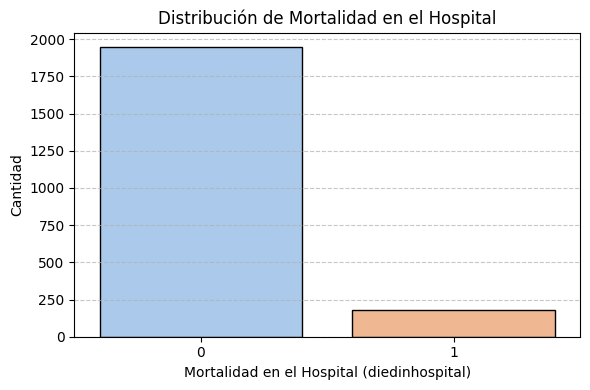

In [74]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calcular el conteo y convertirlo a DataFrame
conteo_actualicumortality = df_sin_faltantes_seleccionado_apache_pred_var['diedinhospital'].value_counts().reset_index()
conteo_actualicumortality.columns = ['diedinhospital', 'count']

# Crear gráfico de barras
plt.figure(figsize=(6, 4))
sns.barplot(data=conteo_actualicumortality, x='diedinhospital', y='count', palette='pastel', edgecolor='black')

plt.title('Distribución de Mortalidad en el Hospital')
plt.xlabel('Mortalidad en el Hospital (diedinhospital)')
plt.ylabel('Cantidad')
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()



## Corrección Valores Faltantes

C:\Users\Pedro López\AppData\Local\Temp\ipykernel_8008\392454829.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=gender_counts, x='gender', y='count', palette='pastel', edgecolor='black')


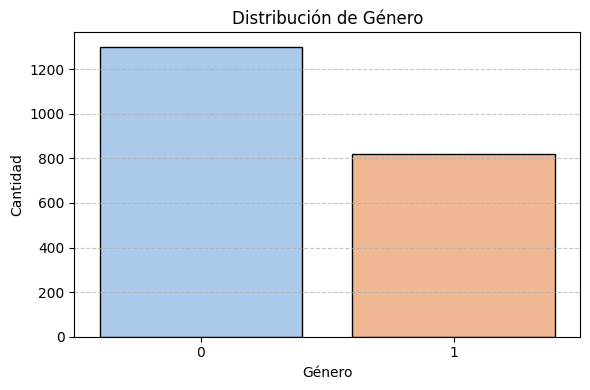

In [75]:
import seaborn as sns
import matplotlib.pyplot as plt

df_sin_faltantes_seleccionado_apache_pred_var_copy = df_sin_faltantes_seleccionado_apache_pred_var.copy()
df_sin_faltantes_seleccionado_apache_pred_var_copy = df_sin_faltantes_seleccionado_apache_pred_var_copy[df_sin_faltantes_seleccionado_apache_pred_var_copy['gender'] != -1]
gender_counts = df_sin_faltantes_seleccionado_apache_pred_var_copy['gender'].value_counts().reset_index()
gender_counts.columns = ['gender', 'count']

# Crear gráfico de barras
plt.figure(figsize=(6,4))
sns.barplot(data=gender_counts, x='gender', y='count', palette='pastel', edgecolor='black')

plt.title('Distribución de Género')
plt.xlabel('Género')
plt.ylabel('Cantidad')
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()



In [76]:
df_apache_var_patient = df_apache_aps_var.merge(df_apache_patient_distinct[['patientunitstayid', 'acutephysiologyscore', 'apachescore', 'predictedicumortality']], on='patientunitstayid', how='left')
print(df_apache_var_patient.shape[0])
df_apache_var_patient.head(10)

2205


,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore,apachescore,predictedicumortality
0,92788,141765,0,0,0,4,6,5,0,-1.0,10.2,36.2,39,139.0,88,108,-1.00,37.8,1.04,-1.0,-1.0,-1.0,28.0,61,-1.0,-1,23.0,47.0,0.008247
1,8893,143870,0,0,0,4,6,5,0,-1.0,11.7,36.4,60,133.0,40,47,-1.00,34.1,1.14,-1.0,-1.0,-1.0,14.0,140,-1.0,-1,43.0,60.0,0.015707
2,79585,144815,0,0,0,4,6,5,0,-1.0,7.9,36.7,6,141.0,131,61,-1.00,36.6,0.63,3.6,-1.0,-1.0,6.0,82,0.5,-1,25.0,25.0,0.001834
3,203242,145427,0,0,0,4,6,5,0,-1.0,21.1,36.2,41,141.0,49,72,-1.00,40.4,1.05,-1.0,-1.0,-1.0,14.0,118,-1.0,-1,26.0,37.0,0.009514
4,154681,147307,0,0,0,4,6,5,0,-1.0,-1.0,36.8,33,-1.0,115,107,-1.00,-1.0,-1.00,-1.0,-1.0,-1.0,-1.0,-1,-1.0,-1,15.0,20.0,0.001609
5,53115,147784,1,0,0,4,6,3,0,-1.0,12.6,36.0,53,142.0,109,130,7.38,40.9,0.54,2.8,76.0,81.0,17.0,151,0.7,60,53.0,64.0,0.058546
6,2143574,148611,0,0,0,4,6,5,0,-1.0,7.3,36.2,45,142.0,105,108,-1.00,47.5,0.82,-1.0,-1.0,-1.0,7.0,112,-1.0,-1,16.0,16.0,0.001274
7,119324,149433,0,0,0,-1,-1,-1,-1,-1.0,-1.0,-1.0,-1,-1.0,98,-1,-1.00,-1.0,-1.00,-1.0,-1.0,-1.0,-1.0,-1,-1.0,-1,NaN,NaN,NaN
8,53149,149713,0,0,0,4,6,4,0,-1.0,9.9,36.3,54,133.0,94,65,-1.00,38.7,0.61,3.8,-1.0,-1.0,11.0,97,0.5,-1,33.0,57.0,0.032460
9,4682,151179,0,0,0,4,6,5,0,-1.0,49.8,22.2,52,139.0,171,40,7.23,37.7,3.02,1.3,91.0,26.0,72.0,58,0.2,28,125.0,141.0,0.667645


In [77]:
df_apache_var_patient_valid = df_apache_var_patient.dropna().copy()
print(df_apache_var_patient_valid.shape[0])
df_apache_var_patient_valid.head(10)

1838


,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore,apachescore,predictedicumortality
0,92788,141765,0,0,0,4,6,5,0,-1.0,10.2,36.2,39,139.0,88,108,-1.00,37.8,1.04,-1.0,-1.0,-1.0,28.0,61,-1.0,-1,23.0,47.0,0.008247
1,8893,143870,0,0,0,4,6,5,0,-1.0,11.7,36.4,60,133.0,40,47,-1.00,34.1,1.14,-1.0,-1.0,-1.0,14.0,140,-1.0,-1,43.0,60.0,0.015707
2,79585,144815,0,0,0,4,6,5,0,-1.0,7.9,36.7,6,141.0,131,61,-1.00,36.6,0.63,3.6,-1.0,-1.0,6.0,82,0.5,-1,25.0,25.0,0.001834
3,203242,145427,0,0,0,4,6,5,0,-1.0,21.1,36.2,41,141.0,49,72,-1.00,40.4,1.05,-1.0,-1.0,-1.0,14.0,118,-1.0,-1,26.0,37.0,0.009514
4,154681,147307,0,0,0,4,6,5,0,-1.0,-1.0,36.8,33,-1.0,115,107,-1.00,-1.0,-1.00,-1.0,-1.0,-1.0,-1.0,-1,-1.0,-1,15.0,20.0,0.001609
5,53115,147784,1,0,0,4,6,3,0,-1.0,12.6,36.0,53,142.0,109,130,7.38,40.9,0.54,2.8,76.0,81.0,17.0,151,0.7,60,53.0,64.0,0.058546
6,2143574,148611,0,0,0,4,6,5,0,-1.0,7.3,36.2,45,142.0,105,108,-1.00,47.5,0.82,-1.0,-1.0,-1.0,7.0,112,-1.0,-1,16.0,16.0,0.001274
8,53149,149713,0,0,0,4,6,4,0,-1.0,9.9,36.3,54,133.0,94,65,-1.00,38.7,0.61,3.8,-1.0,-1.0,11.0,97,0.5,-1,33.0,57.0,0.032460
9,4682,151179,0,0,0,4,6,5,0,-1.0,49.8,22.2,52,139.0,171,40,7.23,37.7,3.02,1.3,91.0,26.0,72.0,58,0.2,28,125.0,141.0,0.667645
10,92929,151867,0,0,0,4,6,5,0,-1.0,12.8,37.1,34,136.0,100,102,-1.00,40.2,1.07,-1.0,-1.0,-1.0,10.0,113,-1.0,-1,14.0,14.0,0.002713


In [78]:

df_apache_new_values = df_apache_var_patient_valid.merge(df_sin_faltantes_seleccionado_apache_pred_var_copy, on='patientunitstayid', how='left')
print(df_apache_new_values.shape[0])
df_apache_new_values.head(10)

1838


,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore,apachescore,predictedicumortality,gender,age,diedinhospital,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis
0,92788,141765,0,0,0,4,6,5,0,-1.0,10.2,36.2,39,139.0,88,108,-1.00,37.8,1.04,-1.0,-1.0,-1.0,28.0,61,-1.0,-1,23.0,47.0,0.008247,1.0,87.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,8893,143870,0,0,0,4,6,5,0,-1.0,11.7,36.4,60,133.0,40,47,-1.00,34.1,1.14,-1.0,-1.0,-1.0,14.0,140,-1.0,-1,43.0,60.0,0.015707,0.0,76.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,79585,144815,0,0,0,4,6,5,0,-1.0,7.9,36.7,6,141.0,131,61,-1.00,36.6,0.63,3.6,-1.0,-1.0,6.0,82,0.5,-1,25.0,25.0,0.001834,1.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,203242,145427,0,0,0,4,6,5,0,-1.0,21.1,36.2,41,141.0,49,72,-1.00,40.4,1.05,-1.0,-1.0,-1.0,14.0,118,-1.0,-1,26.0,37.0,0.009514,0.0,61.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,154681,147307,0,0,0,4,6,5,0,-1.0,-1.0,36.8,33,-1.0,115,107,-1.00,-1.0,-1.00,-1.0,-1.0,-1.0,-1.0,-1,-1.0,-1,15.0,20.0,0.001609,1.0,55.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,53115,147784,1,0,0,4,6,3,0,-1.0,12.6,36.0,53,142.0,109,130,7.38,40.9,0.54,2.8,76.0,81.0,17.0,151,0.7,60,53.0,64.0,0.058546,1.0,60.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,2143574,148611,0,0,0,4,6,5,0,-1.0,7.3,36.2,45,142.0,105,108,-1.00,47.5,0.82,-1.0,-1.0,-1.0,7.0,112,-1.0,-1,16.0,16.0,0.001274,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,53149,149713,0,0,0,4,6,4,0,-1.0,9.9,36.3,54,133.0,94,65,-1.00,38.7,0.61,3.8,-1.0,-1.0,11.0,97,0.5,-1,33.0,57.0,0.032460,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,4682,151179,0,0,0,4,6,5,0,-1.0,49.8,22.2,52,139.0,171,40,7.23,37.7,3.02,1.3,91.0,26.0,72.0,58,0.2,28,125.0,141.0,0.667645,1.0,59.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
9,92929,151867,0,0,0,4,6,5,0,-1.0,12.8,37.1,34,136.0,100,102,-1.00,40.2,1.07,-1.0,-1.0,-1.0,10.0,113,-1.0,-1,14.0,14.0,0.002713,0.0,44.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [79]:
df_apache_new_values = df_apache_new_values.dropna().copy()
print(df_apache_new_values.shape[0])
df_apache_new_values.head(10)

1763


,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore,apachescore,predictedicumortality,gender,age,diedinhospital,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis
0,92788,141765,0,0,0,4,6,5,0,-1.0,10.2,36.2,39,139.0,88,108,-1.00,37.8,1.04,-1.0,-1.0,-1.0,28.0,61,-1.0,-1,23.0,47.0,0.008247,1.0,87.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,8893,143870,0,0,0,4,6,5,0,-1.0,11.7,36.4,60,133.0,40,47,-1.00,34.1,1.14,-1.0,-1.0,-1.0,14.0,140,-1.0,-1,43.0,60.0,0.015707,0.0,76.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,79585,144815,0,0,0,4,6,5,0,-1.0,7.9,36.7,6,141.0,131,61,-1.00,36.6,0.63,3.6,-1.0,-1.0,6.0,82,0.5,-1,25.0,25.0,0.001834,1.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,203242,145427,0,0,0,4,6,5,0,-1.0,21.1,36.2,41,141.0,49,72,-1.00,40.4,1.05,-1.0,-1.0,-1.0,14.0,118,-1.0,-1,26.0,37.0,0.009514,0.0,61.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,154681,147307,0,0,0,4,6,5,0,-1.0,-1.0,36.8,33,-1.0,115,107,-1.00,-1.0,-1.00,-1.0,-1.0,-1.0,-1.0,-1,-1.0,-1,15.0,20.0,0.001609,1.0,55.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,53115,147784,1,0,0,4,6,3,0,-1.0,12.6,36.0,53,142.0,109,130,7.38,40.9,0.54,2.8,76.0,81.0,17.0,151,0.7,60,53.0,64.0,0.058546,1.0,60.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,2143574,148611,0,0,0,4,6,5,0,-1.0,7.3,36.2,45,142.0,105,108,-1.00,47.5,0.82,-1.0,-1.0,-1.0,7.0,112,-1.0,-1,16.0,16.0,0.001274,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,4682,151179,0,0,0,4,6,5,0,-1.0,49.8,22.2,52,139.0,171,40,7.23,37.7,3.02,1.3,91.0,26.0,72.0,58,0.2,28,125.0,141.0,0.667645,1.0,59.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
9,92929,151867,0,0,0,4,6,5,0,-1.0,12.8,37.1,34,136.0,100,102,-1.00,40.2,1.07,-1.0,-1.0,-1.0,10.0,113,-1.0,-1,14.0,14.0,0.002713,0.0,44.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10,2395298,151900,0,0,0,4,6,1,0,-1.0,7.3,36.5,10,135.0,120,174,7.42,22.4,0.84,-1.0,120.0,35.0,19.0,90,-1.0,40,45.0,68.0,0.066750,1.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [80]:

# Filtrar por género
df_masculino = df_apache_new_values[df_apache_new_values['gender'] == 0.0]
df_femenino = df_apache_new_values[df_apache_new_values['gender'] == 1.0]

# Rango de edad para masculinos
edad_min_m = df_masculino['age'].min()
edad_max_m = df_masculino['age'].max()
edad_prom_m = df_masculino['age'].mean()
edad_mediana_m = df_masculino['age'].median()

# Rango de edad para femeninas
edad_min_f = df_femenino['age'].min()
edad_max_f = df_femenino['age'].max()
edad_prom_f = df_femenino['age'].mean()
edad_mediana_f = df_femenino['age'].median()

# Mostrar resultados
print("🔵 Pacientes Masculinos:")
print(f"Edad mínima: {edad_min_m}")
print(f"Edad máxima: {edad_max_m}")
print(f"Edad promedio: {edad_prom_m:.2f}")
print(f"Edad mediana: {edad_mediana_m}")

print("\n🟣 Pacientes Femeninos:")
print(f"Edad mínima: {edad_min_f}")
print(f"Edad máxima: {edad_max_f}")
print(f"Edad promedio: {edad_prom_f:.2f}")
print(f"Edad mediana: {edad_mediana_f}")


🔵 Pacientes Masculinos:
Edad mínima: 0.0
Edad máxima: 89.0
Edad promedio: 61.43
Edad mediana: 65.0

🟣 Pacientes Femeninos:
Edad mínima: 0.0
Edad máxima: 89.0
Edad promedio: 62.42
Edad mediana: 65.0


In [81]:
# Categorizar a los pacientes por edad
def categorizar_edad(edad):
    if edad == 0:
        return 'Neonatal'
    elif edad < 18:
        return 'Pediátrico'
    elif 18 <= edad <= 65:
        return 'Adulto'
    else:
        return 'Mayor'

# Aplicar la categorización a cada DataFrame con .loc
df_masculino.loc[:, 'categoria_edad'] = df_masculino['age'].apply(categorizar_edad)
df_femenino.loc[:, 'categoria_edad'] = df_femenino['age'].apply(categorizar_edad)

# Mostrar las distribuciones por género y categorías de edad
print("🔵 Pacientes Masculinos por categoría de edad:")
print(df_masculino['categoria_edad'].value_counts())

print("\n🟣 Pacientes Femeninos por categoría de edad:")
print(df_femenino['categoria_edad'].value_counts())




🔵 Pacientes Masculinos por categoría de edad:
categoria_edad
Adulto        564
Mayor         529
Pediátrico      1
Neonatal        1
Name: count, dtype: int64

🟣 Pacientes Femeninos por categoría de edad:
categoria_edad
Adulto        343
Mayor         322
Pediátrico      2
Neonatal        1
Name: count, dtype: int64


C:\Users\Pedro López\AppData\Local\Temp\ipykernel_8008\4107671094.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_masculino.loc[:, 'categoria_edad'] = df_masculino['age'].apply(categorizar_edad)
C:\Users\Pedro López\AppData\Local\Temp\ipykernel_8008\4107671094.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_femenino.loc[:, 'categoria_edad'] = df_femenino['age'].apply(categorizar_edad)


In [82]:
# Función para categorizar los pacientes en más rangos, incluyendo subgrupos de mayores de 65
def categorizar_edad_detallada(edad):
    if edad >= 86:
        return 'Mayor avanzado (86+)'
    elif edad >= 76:
        return 'Mayor intermedio (76-85)'
    elif edad >= 65:
        return 'Mayor joven (65-75)'
    elif edad >= 51:
        return 'Adulto Mayor (51-65)'
    elif edad >= 36:
        return 'Adulto Medio (36-50)'
    elif edad >= 18:
        return 'Adulto Joven (18-35)'
    elif edad >= 2:
        return 'Pediátrico (2-12)'
    else:  # Para edad 0-1
        return 'Neonatal (0-1)'

# Aplicar la categorización detallada a cada DataFrame
df_masculino.loc[:, 'categoria_edad'] = df_masculino['age'].apply(categorizar_edad_detallada)
df_femenino.loc[:, 'categoria_edad'] = df_femenino['age'].apply(categorizar_edad_detallada)

# Mostrar las distribuciones por género y categorías de edad
print("🔵 Pacientes Masculinos por categoría de edad:")
print(df_masculino['categoria_edad'].value_counts())

print("\n🟣 Pacientes Femeninos por categoría de edad:")
print(df_femenino['categoria_edad'].value_counts())




🔵 Pacientes Masculinos por categoría de edad:
categoria_edad
Mayor joven (65-75)         288
Adulto Mayor (51-65)        280
Mayor intermedio (76-85)    219
Adulto Medio (36-50)        146
Adulto Joven (18-35)        115
Mayor avanzado (86+)         45
Pediátrico (2-12)             1
Neonatal (0-1)                1
Name: count, dtype: int64

🟣 Pacientes Femeninos por categoría de edad:
categoria_edad
Adulto Mayor (51-65)        188
Mayor joven (65-75)         162
Mayor intermedio (76-85)    132
Adulto Medio (36-50)         74
Adulto Joven (18-35)         64
Mayor avanzado (86+)         45
Pediátrico (2-12)             2
Neonatal (0-1)                1
Name: count, dtype: int64


In [83]:
df_masculino.head(10)

,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore,apachescore,predictedicumortality,gender,age,diedinhospital,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,categoria_edad
1,8893,143870,0,0,0,4,6,5,0,-1.0,11.7,36.4,60,133.0,40,47,-1.00,34.1,1.14,-1.0,-1.0,-1.0,14.0,140,-1.0,-1,43.0,60.0,0.015707,0.0,76.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mayor intermedio (76-85)
3,203242,145427,0,0,0,4,6,5,0,-1.0,21.1,36.2,41,141.0,49,72,-1.00,40.4,1.05,-1.0,-1.0,-1.0,14.0,118,-1.0,-1,26.0,37.0,0.009514,0.0,61.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65)
6,2143574,148611,0,0,0,4,6,5,0,-1.0,7.3,36.2,45,142.0,105,108,-1.00,47.5,0.82,-1.0,-1.0,-1.0,7.0,112,-1.0,-1,16.0,16.0,0.001274,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Joven (18-35)
9,92929,151867,0,0,0,4,6,5,0,-1.0,12.8,37.1,34,136.0,100,102,-1.00,40.2,1.07,-1.0,-1.0,-1.0,10.0,113,-1.0,-1,14.0,14.0,0.002713,0.0,44.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Medio (36-50)
11,128205,153972,0,0,0,4,6,5,0,-1.0,8.1,36.3,10,138.0,90,71,-1.00,26.1,0.93,-1.0,-1.0,-1.0,20.0,109,-1.0,-1,24.0,35.0,0.009329,0.0,63.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65)
13,2382037,156308,0,1,0,4,6,5,0,-1.0,6.1,35.8,45,147.0,98,61,-1.00,27.0,1.30,2.3,-1.0,-1.0,36.0,446,0.3,-1,41.0,75.0,0.093746,0.0,87.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,Mayor avanzado (86+)
16,1767315,157427,0,0,0,4,6,5,0,-1.0,-1.0,36.2,17,138.0,108,52,-1.00,-1.0,1.32,-1.0,-1.0,-1.0,18.0,76,-1.0,-1,18.0,34.0,0.008058,0.0,73.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mayor joven (65-75)
17,1776370,158056,0,0,0,4,6,5,0,-1.0,17.7,36.3,24,-1.0,104,55,-1.00,39.5,-1.00,-1.0,-1.0,-1.0,-1.0,-1,-1.0,-1,19.0,19.0,0.005533,0.0,39.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Medio (36-50)
19,154804,160762,0,0,0,4,6,5,0,-1.0,10.8,36.4,16,-1.0,88,71,-1.00,32.5,1.70,-1.0,-1.0,-1.0,-1.0,160,-1.0,-1,13.0,29.0,0.001187,0.0,71.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mayor joven (65-75)
21,9272,162502,0,0,0,4,6,5,0,-1.0,12.2,36.1,45,140.0,109,59,7.45,37.8,1.71,-1.0,68.0,35.0,43.0,116,-1.0,100,52.0,79.0,0.102839,0.0,83.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,Mayor intermedio (76-85)


In [84]:
# Seleccionar las columnas numéricas relevantes (de 'urine' a 'fio2')
columnas_numericas = ['urine', 'wbc', 'temperature', 'respiratoryrate', 'sodium', 
                      'heartrate', 'meanbp', 'ph', 'hematocrit', 'creatinine', 
                      'albumin', 'pao2', 'pco2', 'bun', 'glucose', 'bilirubin', 
                      'fio2']
# Función para reemplazar -1 por la media de cada columna dentro de la categoría de edad,
# ignorando los valores -1 al calcular la media
def reemplazar_valores_por_media(df, categorias, columnas_numericas):
    for categoria in categorias:
        # Filtrar el dataframe por categoría de edad
        df_categoria = df[df['categoria_edad'] == categoria]
        
        # Calcular la media por categoría de edad para cada columna, 
        # excluyendo los valores -1
        medias_categoria = df_categoria[columnas_numericas].replace(-1, pd.NA).mean()
        
        # Redondear las medias a 1 decimal
        medias_categoria = medias_categoria.round(1)
        
        # Restablecer el índice para evitar problemas con índices duplicados
        df = df.reset_index(drop=True)
        
        # Convertir las columnas numéricas a tipo float64 para evitar problemas con tipos de datos
        df[columnas_numericas] = df[columnas_numericas].astype('float64')
        
        # Reemplazar los valores -1 por la media en cada columna numérica
        for columna in columnas_numericas:
            df.loc[(df['categoria_edad'] == categoria) & (df[columna] == -1), columna] = medias_categoria[columna]
    
    return df




In [85]:
# Aplicar la función de reemplazo en el dataframe
df_actualizado_masculino = reemplazar_valores_por_media(df_masculino, df_masculino['categoria_edad'].unique(), columnas_numericas)

# Verificar los primeros registros del dataframe actualizado
print(len(df_actualizado_masculino))
df_actualizado_masculino.head()


1095


,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore,apachescore,predictedicumortality,gender,age,diedinhospital,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,categoria_edad
0,8893,143870,0,0,0,4,6,5,0,1635.279454,11.7,36.4,60.0,133.0,40.0,47.0,7.385113,34.1,1.14,2.974699,119.603774,40.566038,14.0,140.0,0.998667,58.867925,43.0,60.0,0.015707,0.0,76.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mayor intermedio (76-85)
1,203242,145427,0,0,0,4,6,5,0,1979.625997,21.1,36.2,41.0,141.0,49.0,72.0,7.374362,40.4,1.05,3.018103,137.858621,43.118966,14.0,118.0,1.158163,58.379310,26.0,37.0,0.009514,0.0,61.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65)
2,2143574,148611,0,0,0,4,6,5,0,2435.257504,7.3,36.2,45.0,142.0,105.0,108.0,7.395923,47.5,0.82,3.224000,136.361538,38.192308,7.0,112.0,0.741304,60.846154,16.0,16.0,0.001274,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Joven (18-35)
3,92929,151867,0,0,0,4,6,5,0,2208.741333,12.8,37.1,34.0,136.0,100.0,102.0,7.350955,40.2,1.07,2.918333,112.390909,41.440909,10.0,113.0,2.542593,50.545455,14.0,14.0,0.002713,0.0,44.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Medio (36-50)
4,128205,153972,0,0,0,4,6,5,0,1979.625997,8.1,36.3,10.0,138.0,90.0,71.0,7.374362,26.1,0.93,3.018103,137.858621,43.118966,20.0,109.0,1.158163,58.379310,24.0,35.0,0.009329,0.0,63.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65)


In [86]:
# Aplicar la función de reemplazo en el dataframe
df_actualizado_femenino = reemplazar_valores_por_media(df_femenino, df_femenino['categoria_edad'].unique(), columnas_numericas)

# Verificar los primeros registros del dataframe actualizado
print(len(df_actualizado_femenino))
df_actualizado_femenino.head()

668


,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore,apachescore,predictedicumortality,gender,age,diedinhospital,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,categoria_edad
0,92788,141765,0,0,0,4,6,5,0,1365.800400,10.200000,36.2,39.0,139.000000,88.0,108.0,7.365000,37.800000,1.040000,2.886667,160.520000,39.080000,28.000000,61.000000,1.020000,70.000000,23.0,47.0,0.008247,1.0,87.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mayor avanzado (86+)
1,79585,144815,0,0,0,4,6,5,0,2239.153548,7.900000,36.7,6.0,141.000000,131.0,61.0,7.282222,36.600000,0.630000,3.600000,123.111111,31.222222,6.000000,82.000000,0.500000,31.000000,25.0,25.0,0.001834,1.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Joven (18-35)
2,154681,147307,0,0,0,4,6,5,0,1663.654102,12.928788,36.8,33.0,138.077027,115.0,107.0,7.347929,32.884672,1.275208,2.762025,109.504762,44.040476,22.133172,161.458333,1.932432,56.095238,15.0,20.0,0.001609,1.0,55.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65)
3,53115,147784,1,0,0,4,6,3,0,1663.654102,12.600000,36.0,53.0,142.000000,109.0,130.0,7.380000,40.900000,0.540000,2.800000,76.000000,81.000000,17.000000,151.000000,0.700000,60.000000,53.0,64.0,0.058546,1.0,60.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65)
4,4682,151179,0,0,0,4,6,5,0,1663.654102,49.800000,22.2,52.0,139.000000,171.0,40.0,7.230000,37.700000,3.020000,1.300000,91.000000,26.000000,72.000000,58.000000,0.200000,28.000000,125.0,141.0,0.667645,1.0,59.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Adulto Mayor (51-65)


In [87]:
# Unir los dataframes de pacientes masculinos y femeninos
df_unido_cambios_valores = pd.concat([df_actualizado_masculino, df_actualizado_femenino], ignore_index=True)

# Verificar los primeros registros del dataframe unido
print(len(df_unido_cambios_valores))
df_unido_cambios_valores.head()

1763


,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore,apachescore,predictedicumortality,gender,age,diedinhospital,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,categoria_edad
0,8893,143870,0,0,0,4,6,5,0,1635.279454,11.7,36.4,60.0,133.0,40.0,47.0,7.385113,34.1,1.14,2.974699,119.603774,40.566038,14.0,140.0,0.998667,58.867925,43.0,60.0,0.015707,0.0,76.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mayor intermedio (76-85)
1,203242,145427,0,0,0,4,6,5,0,1979.625997,21.1,36.2,41.0,141.0,49.0,72.0,7.374362,40.4,1.05,3.018103,137.858621,43.118966,14.0,118.0,1.158163,58.379310,26.0,37.0,0.009514,0.0,61.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65)
2,2143574,148611,0,0,0,4,6,5,0,2435.257504,7.3,36.2,45.0,142.0,105.0,108.0,7.395923,47.5,0.82,3.224000,136.361538,38.192308,7.0,112.0,0.741304,60.846154,16.0,16.0,0.001274,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Joven (18-35)
3,92929,151867,0,0,0,4,6,5,0,2208.741333,12.8,37.1,34.0,136.0,100.0,102.0,7.350955,40.2,1.07,2.918333,112.390909,41.440909,10.0,113.0,2.542593,50.545455,14.0,14.0,0.002713,0.0,44.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Medio (36-50)
4,128205,153972,0,0,0,4,6,5,0,1979.625997,8.1,36.3,10.0,138.0,90.0,71.0,7.374362,26.1,0.93,3.018103,137.858621,43.118966,20.0,109.0,1.158163,58.379310,24.0,35.0,0.009329,0.0,63.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65)


In [88]:

# Reemplaza -1 por NaN
df_unido_cambios_valores.replace(-1, np.nan, inplace=True)
df_unido_cambios_valores = df_unido_cambios_valores.dropna()
print(len(df_unido_cambios_valores))


1660


## Cálculo métricas SOFA Y SAPS

In [89]:
def calcular_sofa_fila(row):
    # Inicializamos el score en 0
    score = 0

    # RESPIRATORIO: PaO2 / FiO2
    if row['fio2'] > 0:
        pafi = row['pao2'] / row['fio2']
        if pafi <= 100:
            score += 4
        elif pafi <= 200:
            score += 3
        elif pafi <= 300:
            score += 2
        elif pafi <= 400:
            score += 1
        else:
            score += 0
    else:
        score += 0  # evitamos división por cero

    # HÍGADO: Bilirrubina
    bil = row['bilirubin']
    if bil < 1.2:
        score += 0
    elif bil <= 1.9:
        score += 1
    elif bil <= 5.9:
        score += 2
    elif bil <= 11.9:
        score += 3
    else:
        score += 4

    # CARDIOVASCULAR: Presión media
    if row['meanbp'] < 70:
        score += 1
    else:
        score += 0

    # NEUROLÓGICO: GCS
    gcs = row['eyes'] + row['motor'] + row['verbal']
    if gcs == 15:
        score += 0
    elif gcs >= 13:
        score += 1
    elif gcs >= 10:
        score += 2
    elif gcs >= 6:
        score += 3
    else:
        score += 4

    # RENAL: Creatinina
    crea = row['creatinine']
    if crea < 1.2:
        score += 0
    elif crea <= 1.9:
        score += 1
    elif crea <= 3.4:
        score += 2
    elif crea <= 4.9:
        score += 3
    else:
        score += 4

    return score

# Aplicamos la función al DataFrame
df_unido_cambios_valores['sofa_score_modificado'] = df_unido_cambios_valores.apply(calcular_sofa_fila, axis=1)

In [90]:
df_unido_cambios_valores.head()

,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore,apachescore,predictedicumortality,gender,age,diedinhospital,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,categoria_edad,sofa_score_modificado
0,8893,143870,0,0,0,4.0,6.0,5.0,0.0,1635.279454,11.7,36.4,60.0,133.0,40.0,47.0,7.385113,34.1,1.14,2.974699,119.603774,40.566038,14.0,140.0,0.998667,58.867925,43.0,60.0,0.015707,0.0,76.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mayor intermedio (76-85),5
1,203242,145427,0,0,0,4.0,6.0,5.0,0.0,1979.625997,21.1,36.2,41.0,141.0,49.0,72.0,7.374362,40.4,1.05,3.018103,137.858621,43.118966,14.0,118.0,1.158163,58.379310,26.0,37.0,0.009514,0.0,61.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65),4
2,2143574,148611,0,0,0,4.0,6.0,5.0,0.0,2435.257504,7.3,36.2,45.0,142.0,105.0,108.0,7.395923,47.5,0.82,3.224000,136.361538,38.192308,7.0,112.0,0.741304,60.846154,16.0,16.0,0.001274,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Joven (18-35),4
3,92929,151867,0,0,0,4.0,6.0,5.0,0.0,2208.741333,12.8,37.1,34.0,136.0,100.0,102.0,7.350955,40.2,1.07,2.918333,112.390909,41.440909,10.0,113.0,2.542593,50.545455,14.0,14.0,0.002713,0.0,44.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Medio (36-50),6
4,128205,153972,0,0,0,4.0,6.0,5.0,0.0,1979.625997,8.1,36.3,10.0,138.0,90.0,71.0,7.374362,26.1,0.93,3.018103,137.858621,43.118966,20.0,109.0,1.158163,58.379310,24.0,35.0,0.009329,0.0,63.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65),4


In [91]:
def calcular_saps2_fila(row):
    score = 0

    # EDAD
    edad = row['age']
    if edad < 40:
        score += 0
    elif edad <= 59:
        score += 7
    elif edad <= 69:
        score += 12
    elif edad <= 74:
        score += 15
    elif edad <= 79:
        score += 16
    else:
        score += 18

    # FC
    hr = row['heartrate']
    if hr < 40:
        score += 11
    elif hr <= 69:
        score += 2
    elif hr <= 119:
        score += 0
    elif hr <= 139:
        score += 4
    else:
        score += 7

    # TEMPERATURA
    temp = row['temperature']
    if temp < 39:
        score += 0
    else:
        score += 3

    # MAP (mean arterial pressure)
    map = row['meanbp']
    if map < 70:
        score += 13
    elif map <= 99:
        score += 0
    else:
        score += 6

    # GCS
    gcs = row['eyes'] + row['motor'] + row['verbal']
    score += (15 - gcs)  # SAPS II añade (15 - GCS)

    # PaO2/FiO2
    if row['fio2'] > 0:
        pafi = row['pao2'] / row['fio2']
        if pafi < 100:
            score += 11
        elif pafi < 200:
            score += 9
        else:
            score += 0

    # pH
    ph = row['ph']
    if ph < 7.2:
        score += 12
    elif ph < 7.33:
        score += 5
    elif ph > 7.5:
        score += 6
    else:
        score += 0

    # Sodio
    na = row['sodium']
    if na < 125:
        score += 5
    elif na > 145:
        score += 1

    # BUN
    bun = row['bun']
    if bun < 10:
        score += 0
    elif bun <= 29:
        score += 6
    elif bun <= 84:
        score += 10
    else:
        score += 11

    # WBC
    wbc = row['wbc']
    if wbc < 1:
        score += 12
    elif wbc < 20:
        score += 0
    else:
        score += 3

    # Bilirrubina
    bil = row['bilirubin']
    if bil >= 4.0:
        score += 4

    # Diuresis
    urine = row['urine']
    if urine < 500:
        score += 11
    elif urine < 1000:
        score += 4

    # Enfermedades crónicas
    if row['aids'] == 1:
        score += 17
    if row['cirrhosis'] == 1:
        score += 16
    if row['metastaticcancer'] == 1:
        score += 9

    return score
df_unido_cambios_valores['saps2_score_modificado'] = df_unido_cambios_valores.apply(calcular_saps2_fila, axis=1)

In [92]:
df_unido_cambios_valores.head()

,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore,apachescore,predictedicumortality,gender,age,diedinhospital,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,categoria_edad,sofa_score_modificado,saps2_score_modificado
0,8893,143870,0,0,0,4.0,6.0,5.0,0.0,1635.279454,11.7,36.4,60.0,133.0,40.0,47.0,7.385113,34.1,1.14,2.974699,119.603774,40.566038,14.0,140.0,0.998667,58.867925,43.0,60.0,0.015707,0.0,76.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mayor intermedio (76-85),5,48.0
1,203242,145427,0,0,0,4.0,6.0,5.0,0.0,1979.625997,21.1,36.2,41.0,141.0,49.0,72.0,7.374362,40.4,1.05,3.018103,137.858621,43.118966,14.0,118.0,1.158163,58.379310,26.0,37.0,0.009514,0.0,61.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65),4,34.0
2,2143574,148611,0,0,0,4.0,6.0,5.0,0.0,2435.257504,7.3,36.2,45.0,142.0,105.0,108.0,7.395923,47.5,0.82,3.224000,136.361538,38.192308,7.0,112.0,0.741304,60.846154,16.0,16.0,0.001274,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Joven (18-35),4,17.0
3,92929,151867,0,0,0,4.0,6.0,5.0,0.0,2208.741333,12.8,37.1,34.0,136.0,100.0,102.0,7.350955,40.2,1.07,2.918333,112.390909,41.440909,10.0,113.0,2.542593,50.545455,14.0,14.0,0.002713,0.0,44.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Medio (36-50),6,30.0
4,128205,153972,0,0,0,4.0,6.0,5.0,0.0,1979.625997,8.1,36.3,10.0,138.0,90.0,71.0,7.374362,26.1,0.93,3.018103,137.858621,43.118966,20.0,109.0,1.158163,58.379310,24.0,35.0,0.009329,0.0,63.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65),4,29.0


In [93]:
def calcular_prob_saps2(saps_score):
    logit = -7.7631 + (0.0737 * saps_score)
    prob = np.exp(logit) / (1 + np.exp(logit))
    return prob

df_unido_cambios_valores['saps2_probabilidad'] = df_unido_cambios_valores['saps2_score_modificado'].apply(calcular_prob_saps2)
df_unido_cambios_valores.head()

,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore,apachescore,predictedicumortality,gender,age,diedinhospital,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,categoria_edad,sofa_score_modificado,saps2_score_modificado,saps2_probabilidad
0,8893,143870,0,0,0,4.0,6.0,5.0,0.0,1635.279454,11.7,36.4,60.0,133.0,40.0,47.0,7.385113,34.1,1.14,2.974699,119.603774,40.566038,14.0,140.0,0.998667,58.867925,43.0,60.0,0.015707,0.0,76.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mayor intermedio (76-85),5,48.0,0.014407
1,203242,145427,0,0,0,4.0,6.0,5.0,0.0,1979.625997,21.1,36.2,41.0,141.0,49.0,72.0,7.374362,40.4,1.05,3.018103,137.858621,43.118966,14.0,118.0,1.158163,58.379310,26.0,37.0,0.009514,0.0,61.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65),4,34.0,0.005182
2,2143574,148611,0,0,0,4.0,6.0,5.0,0.0,2435.257504,7.3,36.2,45.0,142.0,105.0,108.0,7.395923,47.5,0.82,3.224000,136.361538,38.192308,7.0,112.0,0.741304,60.846154,16.0,16.0,0.001274,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Joven (18-35),4,17.0,0.001486
3,92929,151867,0,0,0,4.0,6.0,5.0,0.0,2208.741333,12.8,37.1,34.0,136.0,100.0,102.0,7.350955,40.2,1.07,2.918333,112.390909,41.440909,10.0,113.0,2.542593,50.545455,14.0,14.0,0.002713,0.0,44.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Medio (36-50),6,30.0,0.003864
4,128205,153972,0,0,0,4.0,6.0,5.0,0.0,1979.625997,8.1,36.3,10.0,138.0,90.0,71.0,7.374362,26.1,0.93,3.018103,137.858621,43.118966,20.0,109.0,1.158163,58.379310,24.0,35.0,0.009329,0.0,63.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65),4,29.0,0.003591


In [94]:
def calcular_prob_sofa(sofa_score):
    logit = -4.5 + 0.45 * sofa_score  # Ajustado a mano para curva "realista"
    prob = np.exp(logit) / (1 + np.exp(logit))
    return prob

df_unido_cambios_valores['sofa_probabilidad'] = df_unido_cambios_valores['sofa_score_modificado'].apply(calcular_prob_sofa)
df_unido_cambios_valores.head()

,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore,apachescore,predictedicumortality,gender,age,diedinhospital,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,categoria_edad,sofa_score_modificado,saps2_score_modificado,saps2_probabilidad,sofa_probabilidad
0,8893,143870,0,0,0,4.0,6.0,5.0,0.0,1635.279454,11.7,36.4,60.0,133.0,40.0,47.0,7.385113,34.1,1.14,2.974699,119.603774,40.566038,14.0,140.0,0.998667,58.867925,43.0,60.0,0.015707,0.0,76.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mayor intermedio (76-85),5,48.0,0.014407,0.095349
1,203242,145427,0,0,0,4.0,6.0,5.0,0.0,1979.625997,21.1,36.2,41.0,141.0,49.0,72.0,7.374362,40.4,1.05,3.018103,137.858621,43.118966,14.0,118.0,1.158163,58.379310,26.0,37.0,0.009514,0.0,61.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65),4,34.0,0.005182,0.062973
2,2143574,148611,0,0,0,4.0,6.0,5.0,0.0,2435.257504,7.3,36.2,45.0,142.0,105.0,108.0,7.395923,47.5,0.82,3.224000,136.361538,38.192308,7.0,112.0,0.741304,60.846154,16.0,16.0,0.001274,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Joven (18-35),4,17.0,0.001486,0.062973
3,92929,151867,0,0,0,4.0,6.0,5.0,0.0,2208.741333,12.8,37.1,34.0,136.0,100.0,102.0,7.350955,40.2,1.07,2.918333,112.390909,41.440909,10.0,113.0,2.542593,50.545455,14.0,14.0,0.002713,0.0,44.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Medio (36-50),6,30.0,0.003864,0.141851
4,128205,153972,0,0,0,4.0,6.0,5.0,0.0,1979.625997,8.1,36.3,10.0,138.0,90.0,71.0,7.374362,26.1,0.93,3.018103,137.858621,43.118966,20.0,109.0,1.158163,58.379310,24.0,35.0,0.009329,0.0,63.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65),4,29.0,0.003591,0.062973


In [95]:
conteo_actualicumortality = df_unido_cambios_valores['diedinhospital'].value_counts()

# Mostrar los resultados
print(conteo_actualicumortality)

diedinhospital
0.0    1530
1.0     130
Name: count, dtype: int64


# Entrenamiento de Modelos

# Primer Acercamiento

In [96]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, learning_curve
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns


In [97]:
df_final = df_unido_cambios_valores.copy()


🔍 Modelo: Logistic Regression

📋 Logistic Regression - Train Balanceado
              precision    recall  f1-score   support

         0.0       0.75      0.76      0.76      1224
         1.0       0.76      0.75      0.75      1224

    accuracy                           0.76      2448
   macro avg       0.76      0.76      0.76      2448
weighted avg       0.76      0.76      0.76      2448



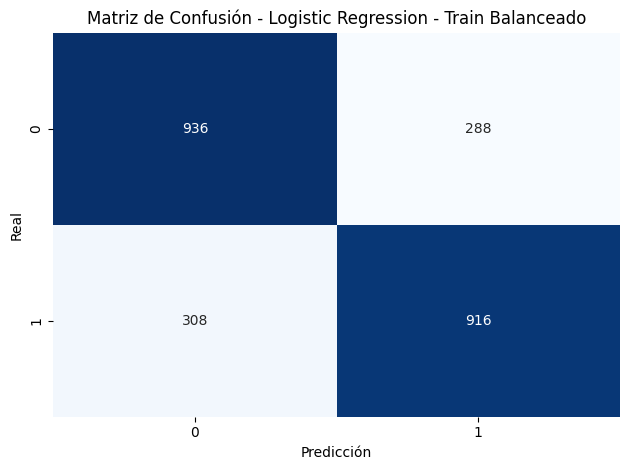


📋 Logistic Regression - Test Balanceado
              precision    recall  f1-score   support

         0.0       0.83      0.77      0.80       306
         1.0       0.79      0.84      0.81       306

    accuracy                           0.81       612
   macro avg       0.81      0.81      0.81       612
weighted avg       0.81      0.81      0.81       612



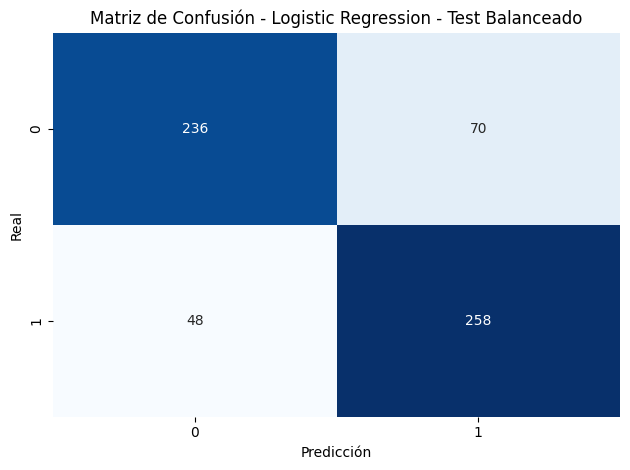


🔍 Modelo: Random Forest

📋 Random Forest - Train Balanceado
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1224
         1.0       1.00      1.00      1.00      1224

    accuracy                           1.00      2448
   macro avg       1.00      1.00      1.00      2448
weighted avg       1.00      1.00      1.00      2448



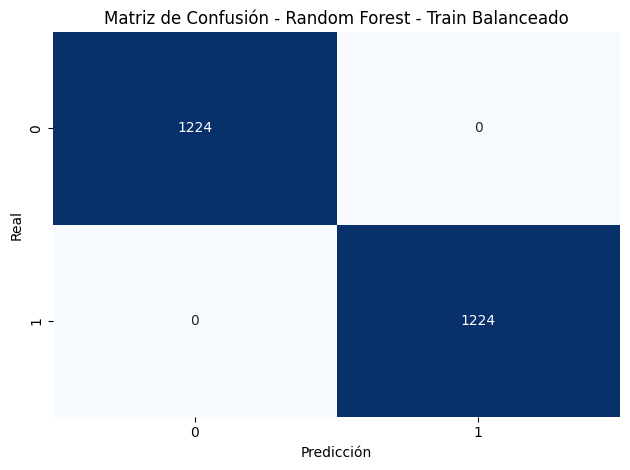


📋 Random Forest - Test Balanceado
              precision    recall  f1-score   support

         0.0       0.85      0.95      0.89       306
         1.0       0.94      0.83      0.88       306

    accuracy                           0.89       612
   macro avg       0.89      0.89      0.89       612
weighted avg       0.89      0.89      0.89       612



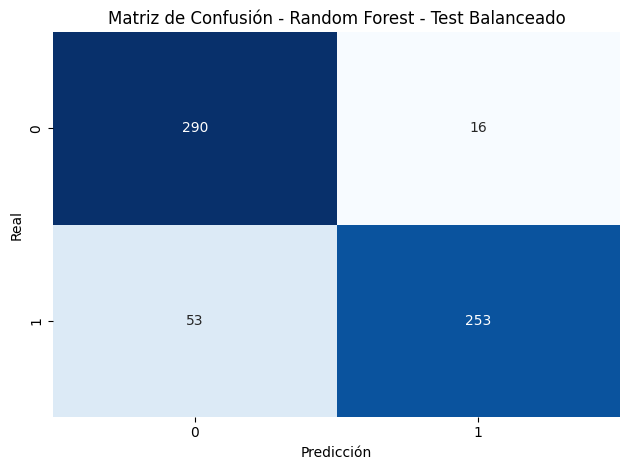

⚙️ Calculando curva de aprendizaje con la métrica 'roc_auc'... esto puede tardar un poco.


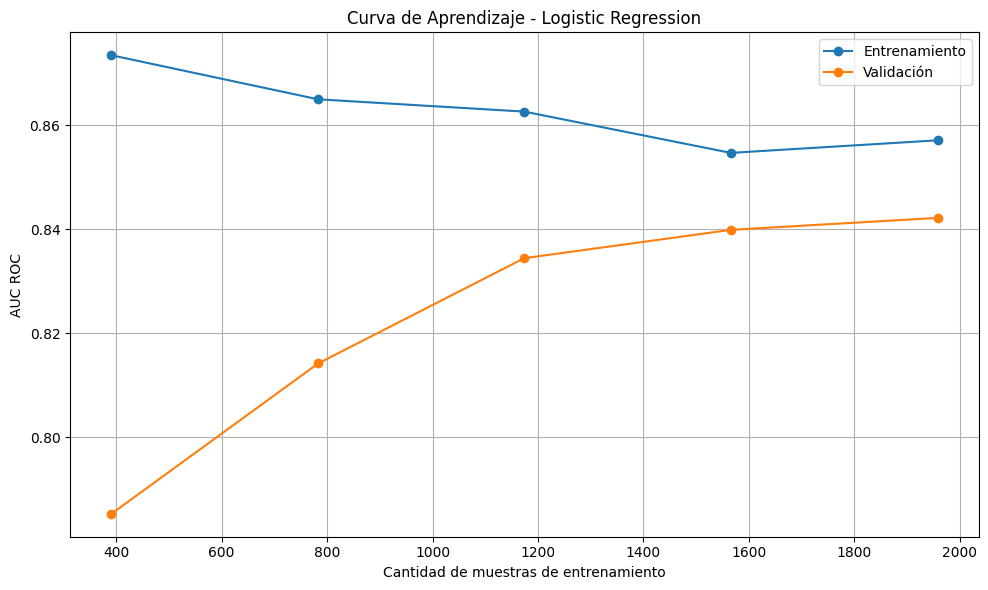

⚙️ Calculando curva de aprendizaje con la métrica 'f1'... esto puede tardar un poco.


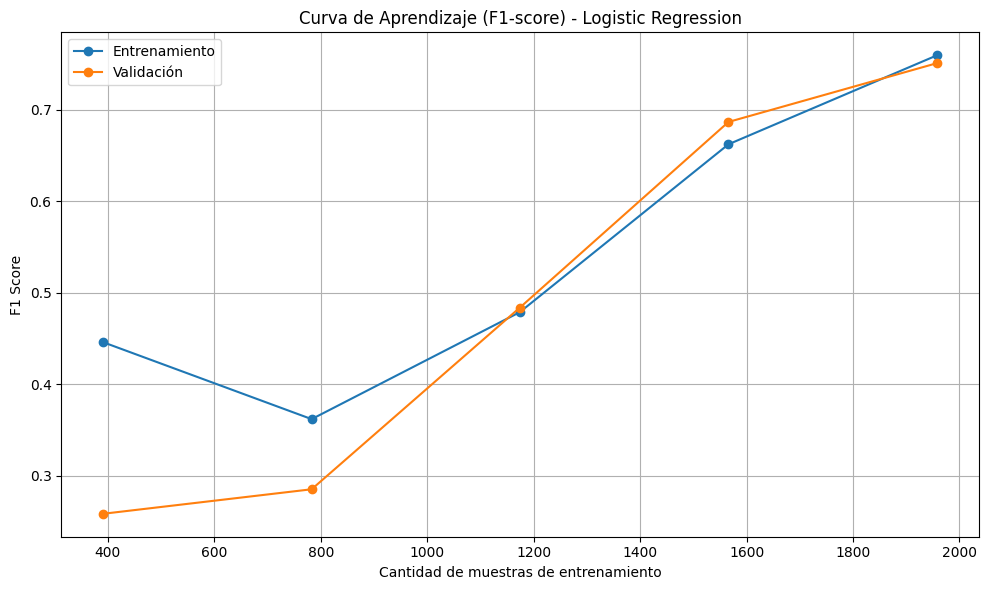

⚙️ Calculando curva de aprendizaje con la métrica 'roc_auc'... esto puede tardar un poco.


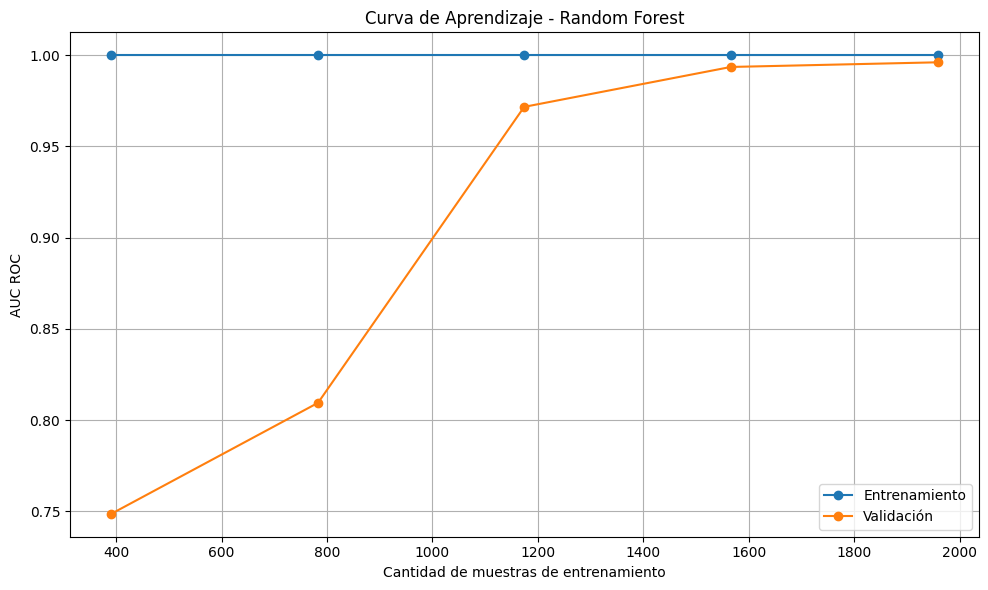

⚙️ Calculando curva de aprendizaje con la métrica 'f1'... esto puede tardar un poco.


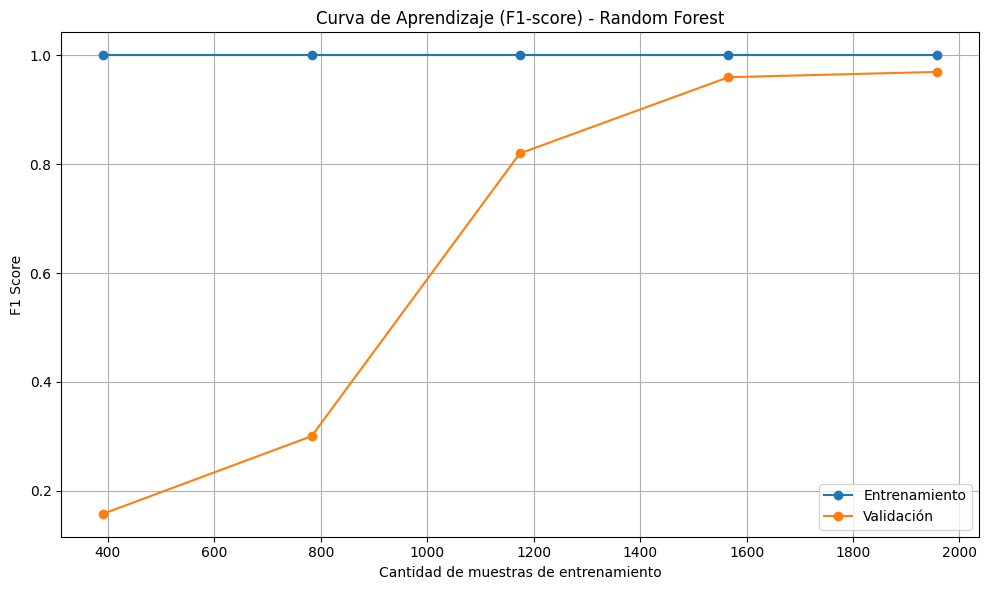

In [98]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.compose import ColumnTransformer 
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split, learning_curve
from sklearn.pipeline import Pipeline

from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline

# === 1. Variables e ingeniería ===
features = [
    'intubated', 'vent', 'dialysis', 'eyes', 'motor', 'verbal', 'meds', 'urine', 'wbc', 'temperature',
    'respiratoryrate', 'sodium', 'heartrate', 'meanbp', 'ph', 'hematocrit', 'creatinine', 'albumin', 'pao2',
    'pco2', 'bun', 'glucose', 'bilirubin', 'fio2', 'gender', 'age', 'hepaticfailure', 'lymphoma',
    'metastaticcancer', 'leukemia', 'immunosuppression', 'cirrhosis', 'categoria_edad'
]
X = df_final[features]
y = df_final['diedinhospital']

categorical = ['gender', 'categoria_edad']
numerical = list(set(features) - set(categorical))

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical),
        ('cat', OneHotEncoder(drop='first'), categorical)
    ]
)

# === 2. Split y balanceo ===
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

smote = SMOTE(random_state=42)

# Preprocesamiento + balanceo
balance_pipe = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', smote)
])
X_train_bal_np, y_train_bal = balance_pipe.fit_resample(X_train, y_train)
X_test_bal_np, y_test_bal = balance_pipe.fit_resample(X_test, y_test)

# Reconstruir como DataFrame con nombres de columnas originales (importante para ColumnTransformer)
X_train_bal = X_train_bal_np
X_test_bal = X_test_bal_np

# === 3. Modelos ===
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42)
}

# === 4. Función de matriz de confusión ===
def plot_conf_matrix(y_true, y_pred, model_name=""):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(f'Matriz de Confusión - {model_name}')
    plt.xlabel('Predicción')
    plt.ylabel('Real')
    plt.tight_layout()
    plt.show()

# === 5. Entrenamiento y evaluación ===
for name, model in models.items():
    print(f"\n🔍 Modelo: {name}")

    # Entrenamiento sobre el train balanceado
    model.fit(X_train_bal, y_train_bal)

    # === Predicción en TRAIN BALANCEADO ===
    y_pred_train_bal = model.predict(X_train_bal)
    print(f"\n📋 {name} - Train Balanceado")
    print(classification_report(y_train_bal, y_pred_train_bal))
    plot_conf_matrix(y_train_bal, y_pred_train_bal, model_name=f"{name} - Train Balanceado")

    # === Predicción en TEST BALANCEADO ===
    y_pred_test_bal = model.predict(X_test_bal)
    print(f"\n📋 {name} - Test Balanceado")
    print(classification_report(y_test_bal, y_pred_test_bal))
    plot_conf_matrix(y_test_bal, y_pred_test_bal, model_name=f"{name} - Test Balanceado")

def generar_curva_aprendizaje(X, y, modelo, metric='roc_auc',
                               train_sizes=np.linspace(0.2, 1.0, 5), titulo="Curva de Aprendizaje - Modelo"):
    from sklearn.pipeline import Pipeline
    from sklearn.model_selection import learning_curve, StratifiedKFold

    pipeline = Pipeline(steps=[
        ('classifier', modelo)
    ])

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    print(f"⚙️ Calculando curva de aprendizaje con la métrica '{metric}'... esto puede tardar un poco.")

    train_sizes, train_scores, test_scores = learning_curve(
        pipeline, X, y, cv=cv, scoring=metric, train_sizes=train_sizes, n_jobs=-1)

    train_scores_mean = train_scores.mean(axis=1)
    test_scores_mean = test_scores.mean(axis=1)

    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_scores_mean, 'o-', label="Entrenamiento")
    plt.plot(train_sizes, test_scores_mean, 'o-', label="Validación")
    plt.title(titulo)
    plt.xlabel("Cantidad de muestras de entrenamiento")

    if metric == 'roc_auc':
        ylabel = "AUC ROC"
    elif metric.startswith('f1'):
        ylabel = "F1 Score"
    else:
        ylabel = f"Puntaje {metric.upper()}"

    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# === 7. Ejecutar curvas de aprendizaje ===
generar_curva_aprendizaje(
    X=X_train_bal,
    y=y_train_bal,
    modelo=LogisticRegression(max_iter=1000, random_state=42),
    metric='roc_auc',
    titulo="Curva de Aprendizaje - Logistic Regression"
)

generar_curva_aprendizaje(
    X=X_train_bal,
    y=y_train_bal,
    modelo=LogisticRegression(max_iter=1000, random_state=42),
    metric='f1',
    titulo="Curva de Aprendizaje (F1-score) - Logistic Regression"
)

generar_curva_aprendizaje(
    X=X_train_bal,
    y=y_train_bal,
    modelo=RandomForestClassifier(n_estimators=100, random_state=42),
    metric='roc_auc',
    titulo="Curva de Aprendizaje - Random Forest"
)

generar_curva_aprendizaje(
    X=X_train_bal,
    y=y_train_bal,
    modelo=RandomForestClassifier(n_estimators=100, random_state=42),
    metric='f1',
    titulo="Curva de Aprendizaje (F1-score) - Random Forest"
)

## Balanceo Más fuerte


🏋️ Entrenando: Logistic Regression

📋 Logistic Regression - Train Balanceado
              precision    recall  f1-score   support

         0.0      0.894     0.553     0.683      1224
         1.0      0.677     0.935     0.785      1224

    accuracy                          0.744      2448
   macro avg      0.785     0.744     0.734      2448
weighted avg      0.785     0.744     0.734      2448



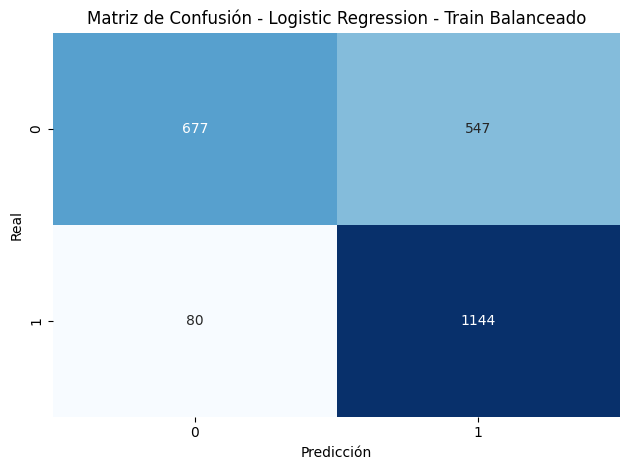


📋 Logistic Regression - Test Balanceado
              precision    recall  f1-score   support

         0.0      0.919     0.559     0.695       306
         1.0      0.683     0.951     0.795       306

    accuracy                          0.755       612
   macro avg      0.801     0.755     0.745       612
weighted avg      0.801     0.755     0.745       612



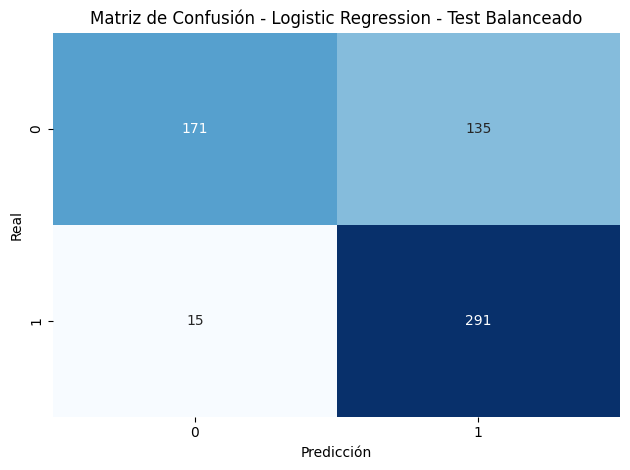


📈 Curvas de Aprendizaje: Logistic Regression


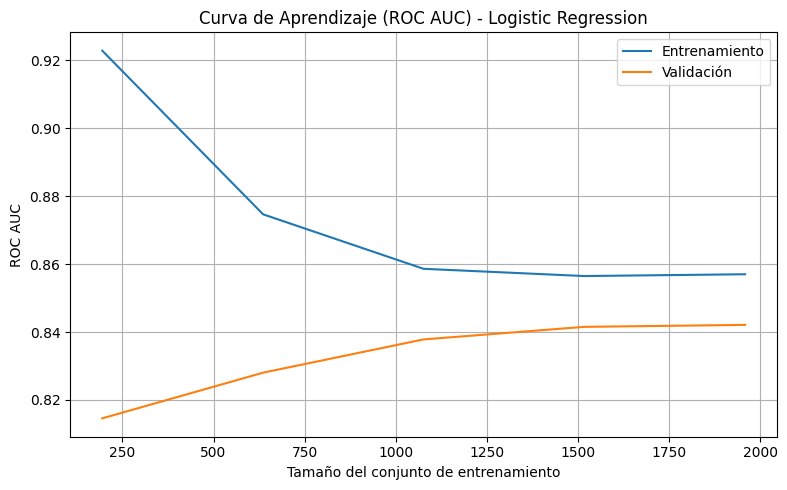

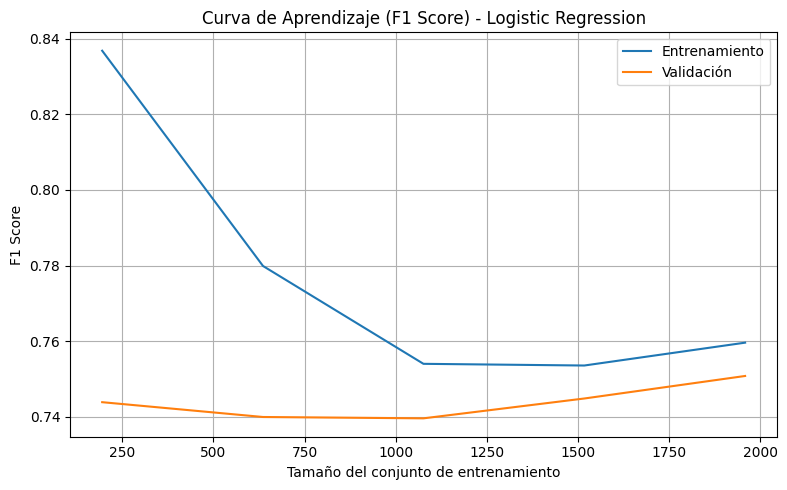


🏋️ Entrenando: Random Forest

📋 Random Forest - Train Balanceado
              precision    recall  f1-score   support

         0.0      1.000     0.995     0.998      1224
         1.0      0.995     1.000     0.998      1224

    accuracy                          0.998      2448
   macro avg      0.998     0.998     0.998      2448
weighted avg      0.998     0.998     0.998      2448



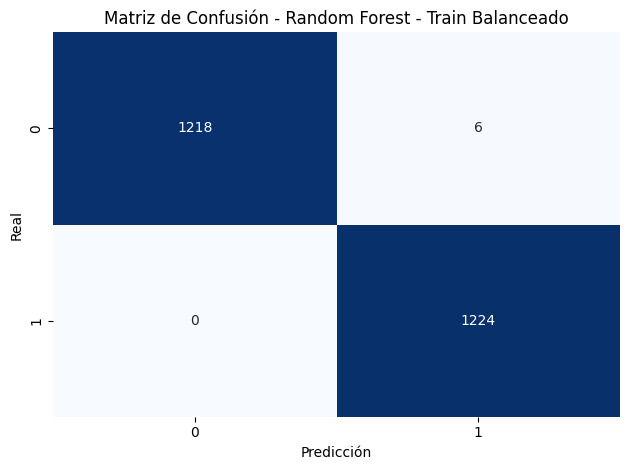


📋 Random Forest - Test Balanceado
              precision    recall  f1-score   support

         0.0      0.933     0.905     0.919       306
         1.0      0.908     0.935     0.921       306

    accuracy                          0.920       612
   macro avg      0.920     0.920     0.920       612
weighted avg      0.920     0.920     0.920       612



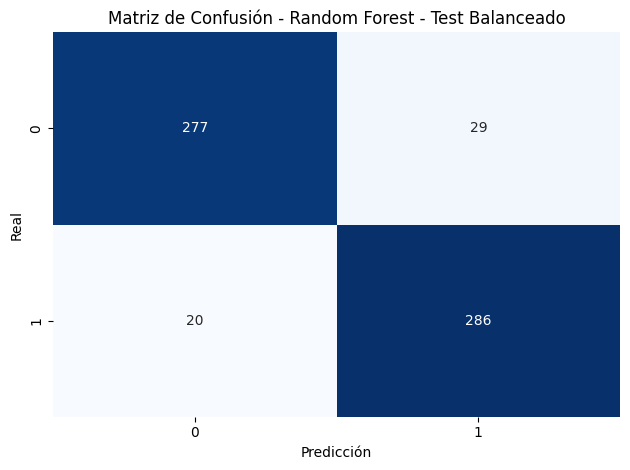


📈 Curvas de Aprendizaje: Random Forest


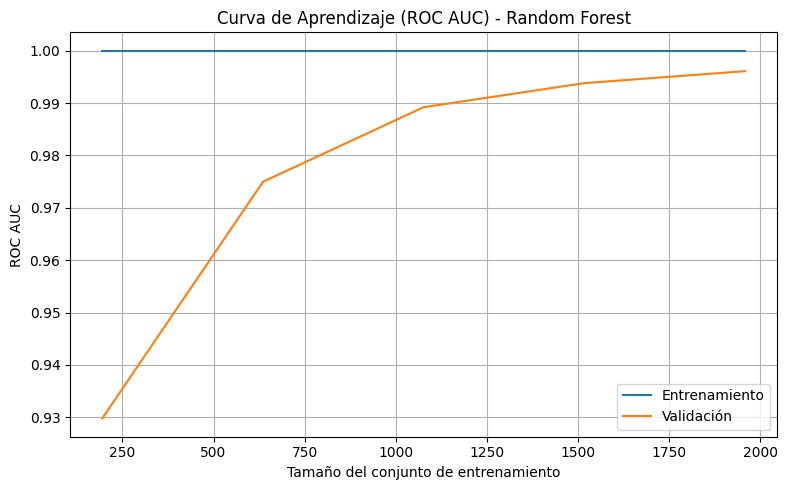

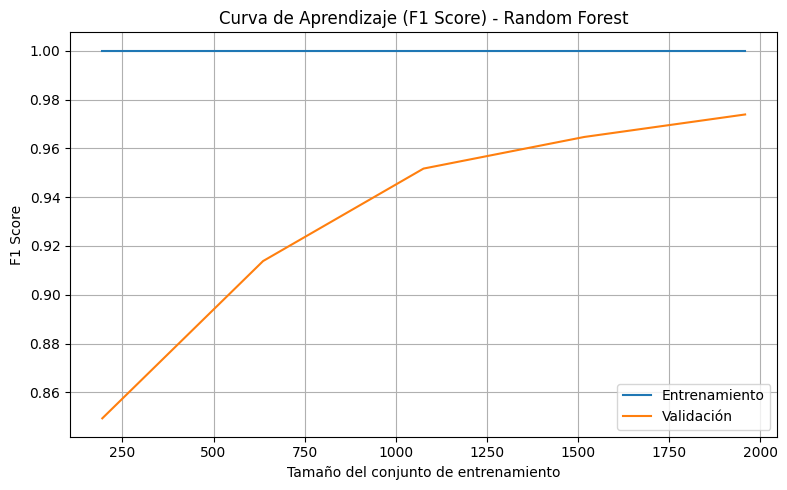


🏋️ Entrenando: XGBoost

📋 XGBoost - Train Balanceado
              precision    recall  f1-score   support

         0.0      1.000     1.000     1.000      1224
         1.0      1.000     1.000     1.000      1224

    accuracy                          1.000      2448
   macro avg      1.000     1.000     1.000      2448
weighted avg      1.000     1.000     1.000      2448



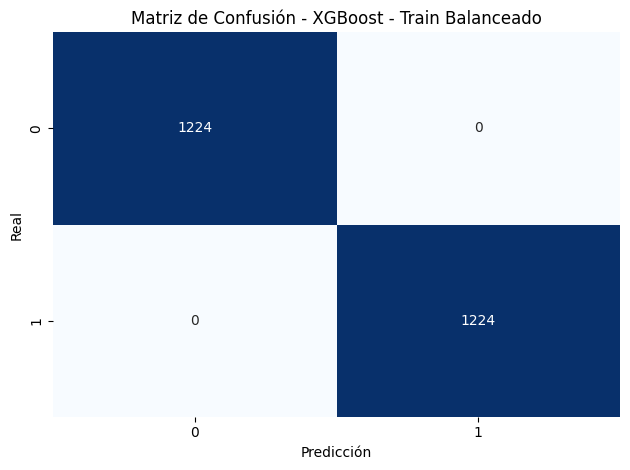


📋 XGBoost - Test Balanceado
              precision    recall  f1-score   support

         0.0      0.927     0.948     0.937       306
         1.0      0.946     0.925     0.936       306

    accuracy                          0.936       612
   macro avg      0.937     0.936     0.936       612
weighted avg      0.937     0.936     0.936       612



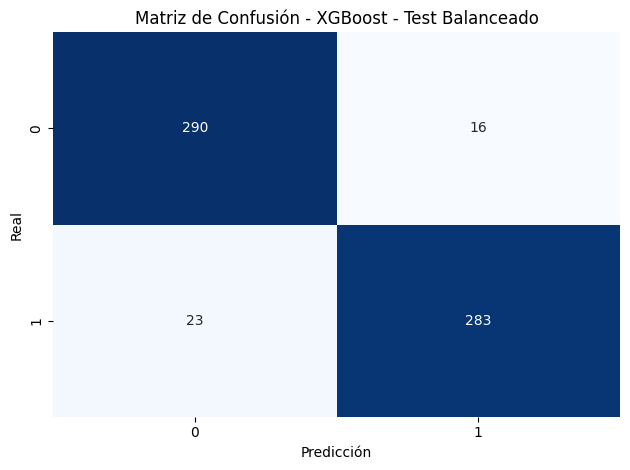


📈 Curvas de Aprendizaje: XGBoost


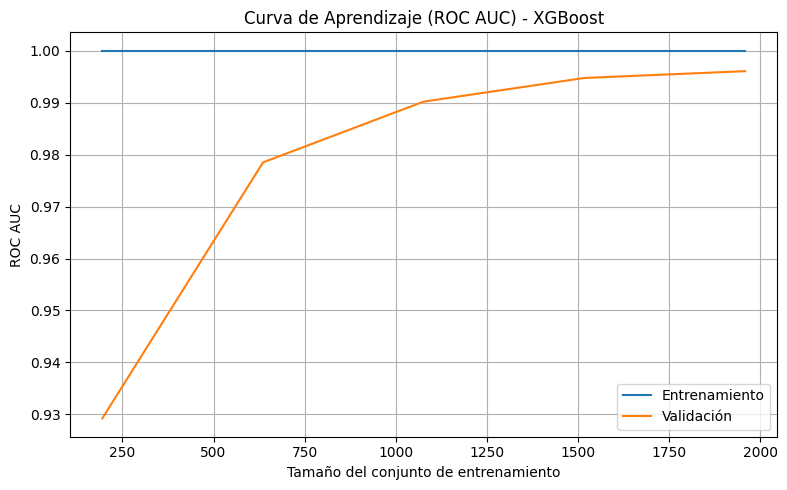

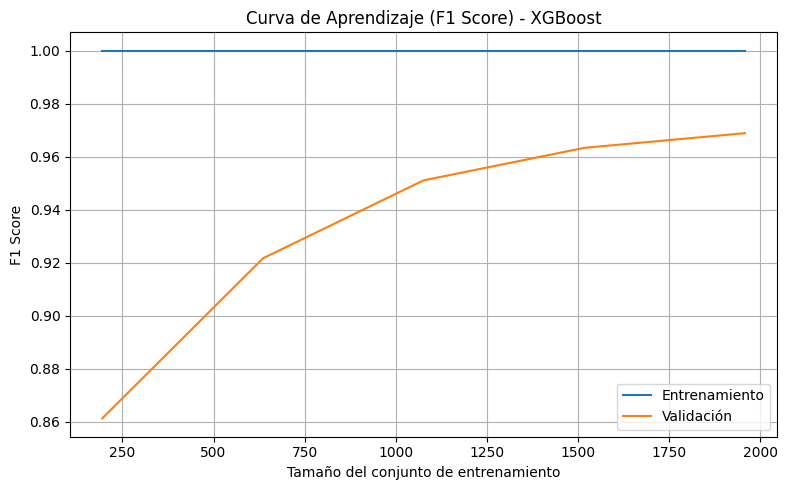


🏋️ Entrenando: LightGBM
[LightGBM] [Info] Number of positive: 1224, number of negative: 1224
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6364
[LightGBM] [Info] Number of data points in the train set: 2448, number of used features: 35
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000

📋 LightGBM - Train Balanceado
              precision    recall  f1-score   support

         0.0      1.000     1.000     1.000      1224
         1.0      1.000     1.000     1.000      1224

    accuracy                          1.000      2448
   macro avg      1.000     1.000     1.000      2448
weighted avg      1.000     1.000     1.000      2448



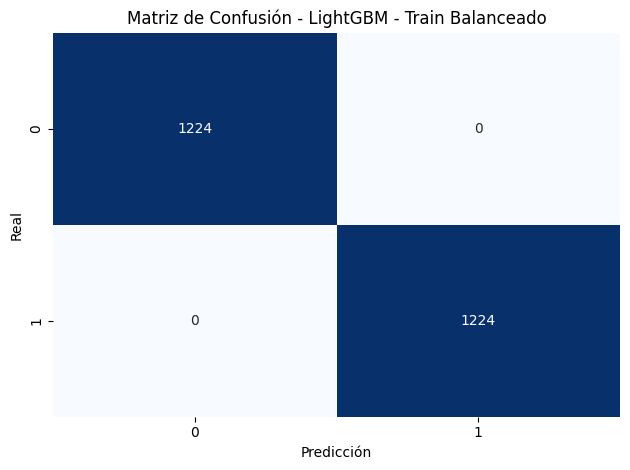


📋 LightGBM - Test Balanceado
              precision    recall  f1-score   support

         0.0      0.895     0.971     0.931       306
         1.0      0.968     0.886     0.925       306

    accuracy                          0.928       612
   macro avg      0.931     0.928     0.928       612
weighted avg      0.931     0.928     0.928       612



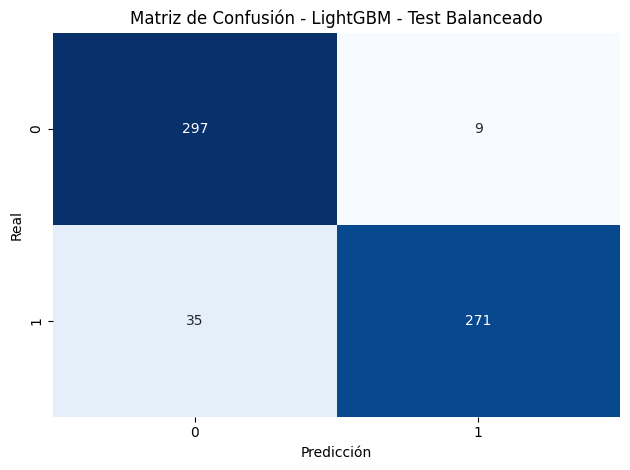


📈 Curvas de Aprendizaje: LightGBM


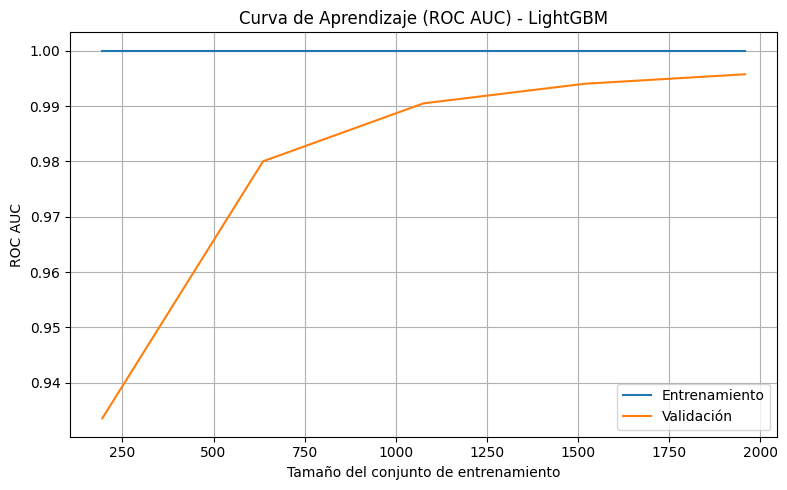

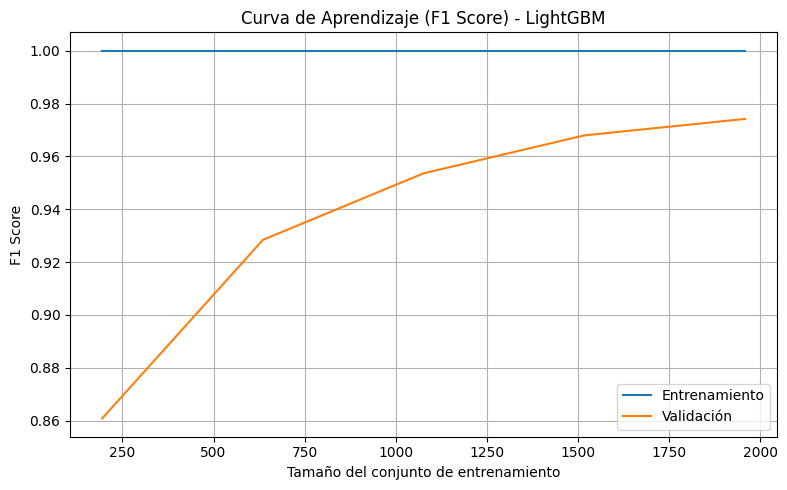

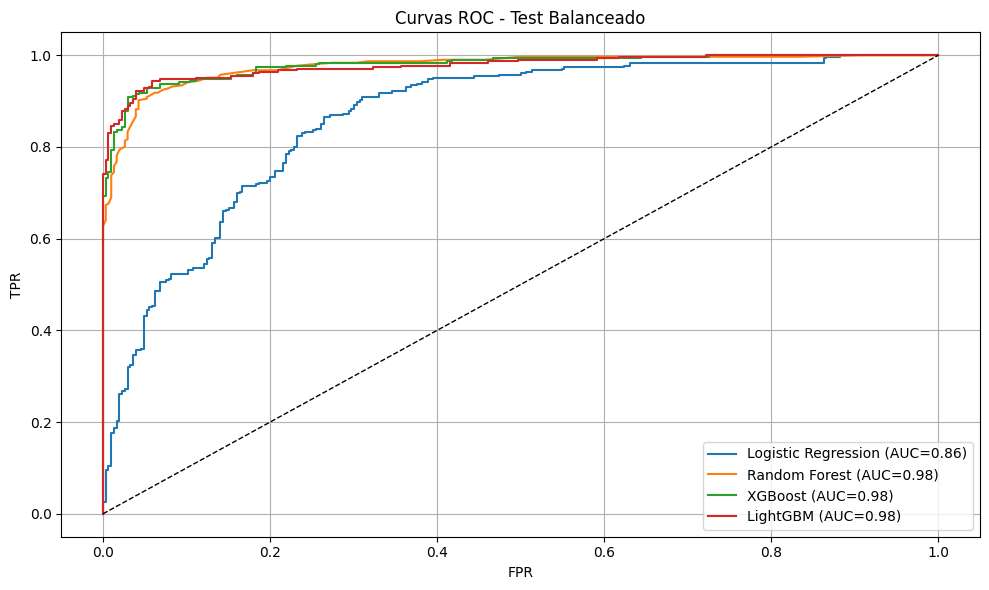

In [99]:
# ===========================================
# 1. Imports
# ===========================================

import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, learning_curve, StratifiedKFold
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_curve,
    roc_auc_score
)

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
import lightgbm as lgb
from imblearn.combine import SMOTETomek

# ===========================================
# 2. Configuración y Preprocesamiento
# ===========================================

seed = 42
random.seed(seed)
np.random.seed(seed)

# Debes definir estas variables antes:
# X, y, categorical, numerical

preprocessor = ColumnTransformer([
    ('num', StandardScaler(), numerical),
    ('cat', OneHotEncoder(drop='first'), categorical)
])

X_train, X_test, y_train, y_test = train_test_split(
    X, y, stratify=y, test_size=0.2, random_state=seed
)

X_train_enc = preprocessor.fit_transform(X_train)
X_test_enc = preprocessor.transform(X_test)

# ===========================================
# 3. Balanceo
# ===========================================

smote_tomek = SMOTETomek(random_state=seed)
X_train_bal, y_train_bal = smote_tomek.fit_resample(X_train_enc, y_train)
X_test_bal, y_test_bal = smote_tomek.fit_resample(X_test_enc, y_test)

# ===========================================
# 4. Función de métricas
# ===========================================

def show_detailed_metrics(model, X, y, title=""):
    y_proba = model.predict_proba(X)[:, 1]
    y_pred = (y_proba >= 0.3).astype(int)

    print(f"\n📋 {title}")
    print(classification_report(y, y_pred, digits=3))

    cm = confusion_matrix(y, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(f'Matriz de Confusión - {title}')
    plt.xlabel('Predicción')
    plt.ylabel('Real')
    plt.tight_layout()
    plt.show()
    
    return y_proba  # Para curvas ROC

# ===========================================
# 5. Curvas de Aprendizaje
# ===========================================

from sklearn.base import clone

def plot_learning_dual(model, X, y, name):
    metrics = {
        'ROC AUC': 'roc_auc',
        'F1 Score': 'f1'
    }

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)

    for metric_name, scoring in metrics.items():
        train_sizes, train_scores, val_scores = learning_curve(
            clone(model),   # Clonar modelo para que esté sin entrenar en cada fold
            X, y,
            cv=cv,
            scoring=scoring,
            n_jobs=-1,
            train_sizes=np.linspace(0.1, 1.0, 5),
            shuffle=True,
            random_state=seed
        )
        train_scores_mean = np.mean(train_scores, axis=1)
        val_scores_mean = np.mean(val_scores, axis=1)

        plt.figure(figsize=(8, 5))
        plt.plot(train_sizes, train_scores_mean, label="Entrenamiento")
        plt.plot(train_sizes, val_scores_mean, label="Validación")
        plt.title(f"Curva de Aprendizaje ({metric_name}) - {name}")
        plt.xlabel("Tamaño del conjunto de entrenamiento")
        plt.ylabel(metric_name)
        plt.legend()
        plt.grid()
        plt.tight_layout()
        plt.show()


# ===========================================
# 6. Entrenamiento y Evaluación
# ===========================================

models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, class_weight='balanced', random_state=seed),
    "Random Forest": RandomForestClassifier(n_estimators=100, class_weight='balanced', random_state=seed),
    "XGBoost": xgb.XGBClassifier(scale_pos_weight=5, eval_metric='logloss', random_state=seed),
    "LightGBM": lgb.LGBMClassifier(class_weight='balanced', random_state=seed)
}

roc_data = {}

for name, model in models.items():
    print(f"\n==============================")
    print(f"🏋️ Entrenando: {name}")
    model.fit(X_train_bal, y_train_bal)

    # Evaluación en train balanceado
    y_proba_train = show_detailed_metrics(model, X_train_bal, y_train_bal, title=f"{name} - Train Balanceado")

    # Evaluación en test balanceado
    y_proba_test = show_detailed_metrics(model, X_test_bal, y_test_bal, title=f"{name} - Test Balanceado")

    # Guardar datos para curvas ROC (solo test balanceado)
    roc_data[name] = (y_test_bal, y_proba_test)

    # Curvas de aprendizaje
    print(f"\n📈 Curvas de Aprendizaje: {name}")
    plot_learning_dual(model, X_train_bal, y_train_bal, name)

# ===========================================
# 7. Curvas ROC (solo sobre test balanceado)
# ===========================================

plt.figure(figsize=(10, 6))
for name, (y_true, y_score) in roc_data.items():
    fpr, tpr, _ = roc_curve(y_true, y_score)
    auc = roc_auc_score(y_true, y_score)
    plt.plot(fpr, tpr, label=f"{name} (AUC={auc:.2f})")

plt.plot([0,1], [0,1], 'k--', lw=1)
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("Curvas ROC - Test Balanceado")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()


## Optimización de Parámetros


🔍 Buscando hiperparámetros para LOGREG
Mejores hiperparámetros: {'classifier__C': 0.01}

📋 LOGREG - Train Balanceado
              precision    recall  f1-score   support

         0.0      0.907     0.505     0.649      1224
         1.0      0.657     0.949     0.776      1224

    accuracy                          0.727      2448
   macro avg      0.782     0.727     0.713      2448
weighted avg      0.782     0.727     0.713      2448



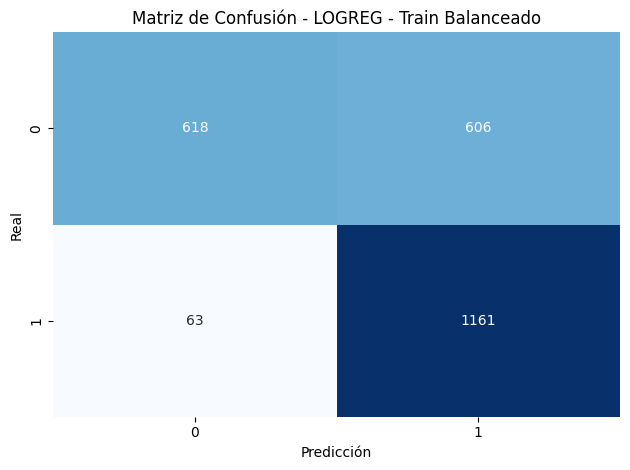


📋 LOGREG - Test Balanceado
              precision    recall  f1-score   support

         0.0      0.981     0.510     0.671       306
         1.0      0.669     0.990     0.798       306

    accuracy                          0.750       612
   macro avg      0.825     0.750     0.735       612
weighted avg      0.825     0.750     0.735       612



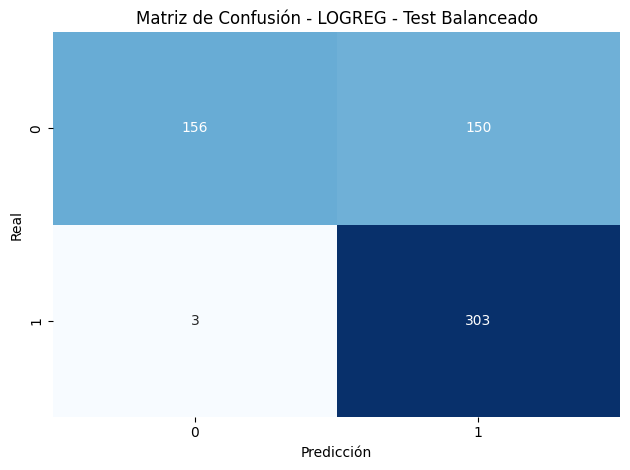


🔍 Buscando hiperparámetros para RF
Mejores hiperparámetros: {'classifier__max_depth': 10, 'classifier__n_estimators': 100}

📋 RF - Train Balanceado
              precision    recall  f1-score   support

         0.0      1.000     0.962     0.981      1224
         1.0      0.964     1.000     0.982      1224

    accuracy                          0.981      2448
   macro avg      0.982     0.981     0.981      2448
weighted avg      0.982     0.981     0.981      2448



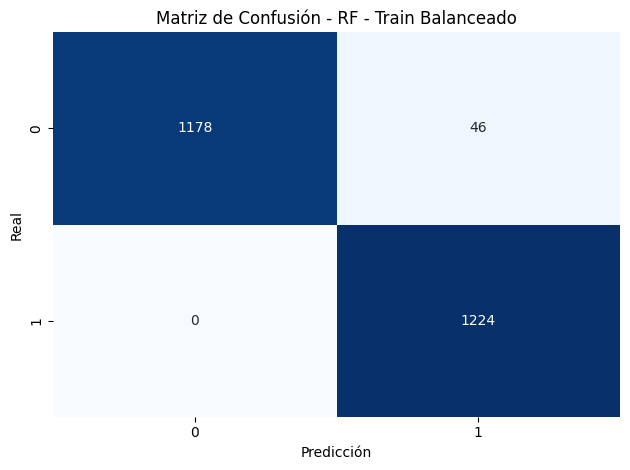


📋 RF - Test Balanceado
              precision    recall  f1-score   support

         0.0      0.951     0.889     0.919       306
         1.0      0.896     0.954     0.924       306

    accuracy                          0.922       612
   macro avg      0.923     0.922     0.921       612
weighted avg      0.923     0.922     0.921       612



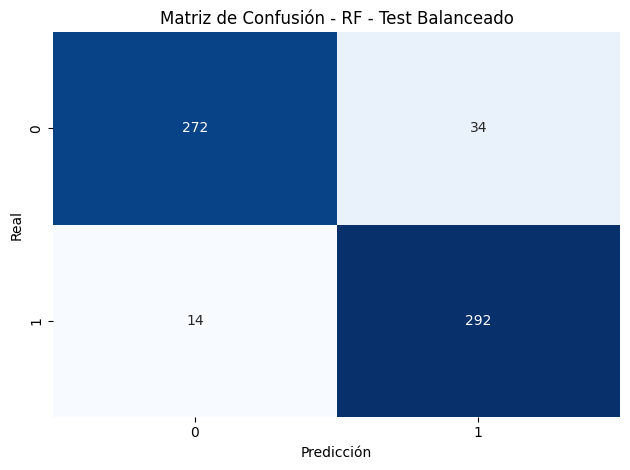


🔍 Buscando hiperparámetros para XGB


C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\xgboost\training.py:183: UserWarning: [13:45:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\xgboost\training.py:183: UserWarning: [13:45:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Mejores hiperparámetros: {'classifier__learning_rate': 0.05, 'classifier__max_depth': 3, 'classifier__n_estimators': 100}

📋 XGB - Train Balanceado
              precision    recall  f1-score   support

         0.0      0.982     0.833     0.901      1224
         1.0      0.855     0.984     0.915      1224

    accuracy                          0.908      2448
   macro avg      0.918     0.908     0.908      2448
weighted avg      0.918     0.908     0.908      2448



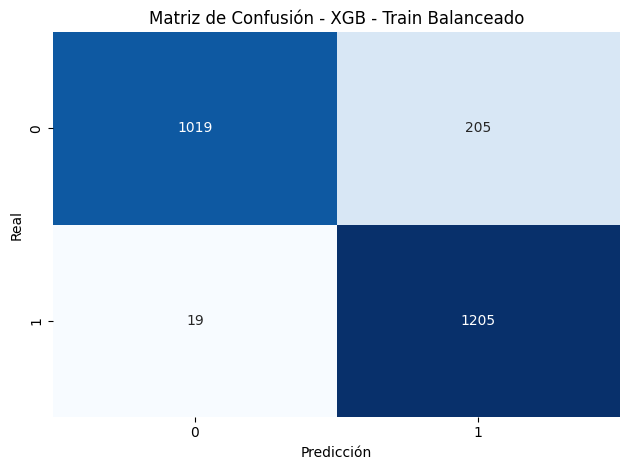


📋 XGB - Test Balanceado
              precision    recall  f1-score   support

         0.0      0.953     0.853     0.900       306
         1.0      0.867     0.958     0.910       306

    accuracy                          0.905       612
   macro avg      0.910     0.905     0.905       612
weighted avg      0.910     0.905     0.905       612



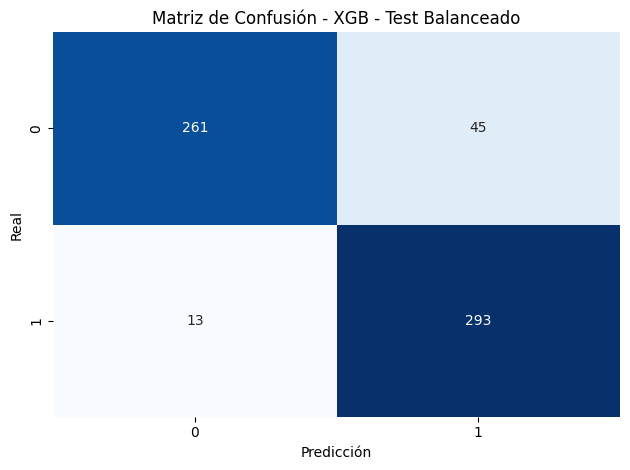


🔍 Buscando hiperparámetros para LGB
[LightGBM] [Info] Number of positive: 1224, number of negative: 1224
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000632 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6319
[LightGBM] [Info] Number of data points in the train set: 2448, number of used features: 35
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Mejores hiperparámetros: {'classifier__learning_rate': 0.1, 'classifier__max_depth': -1, 'classifier__n_estimators': 100}
[LightGBM] [Info] Number of positive: 1224, number of negative: 1224
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6319
[LightGBM] [Info] Number of data points in the train set: 2448, number of used features: 35
[LightGBM] [Info] [binary:BoostFromScore]: pavg=

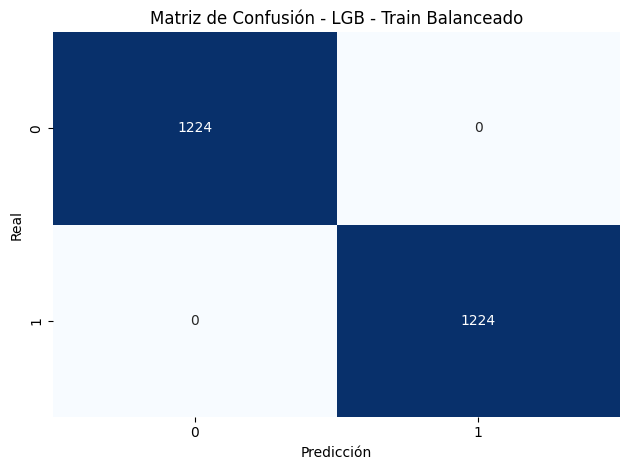


📋 LGB - Test Balanceado
              precision    recall  f1-score   support

         0.0      0.855     0.961     0.905       306
         1.0      0.955     0.837     0.892       306

    accuracy                          0.899       612
   macro avg      0.905     0.899     0.898       612
weighted avg      0.905     0.899     0.898       612



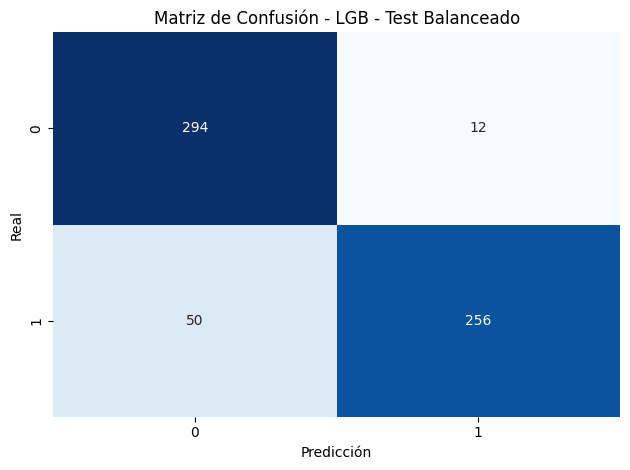


📈 Curvas de Aprendizaje: Logistic Regression


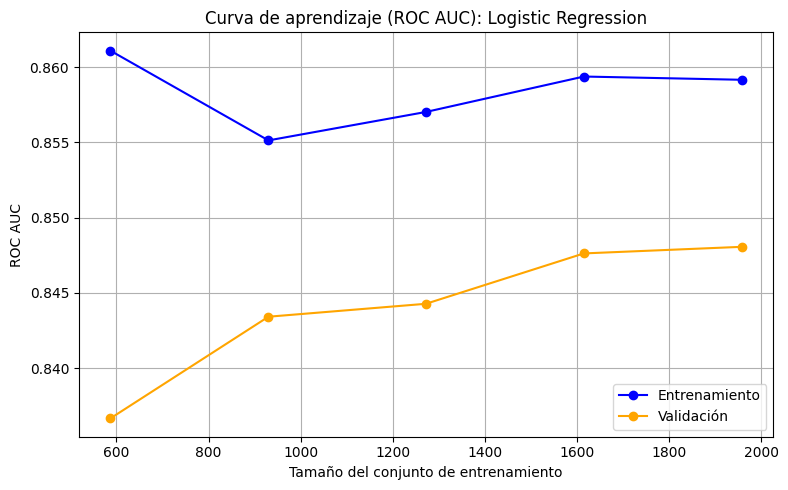

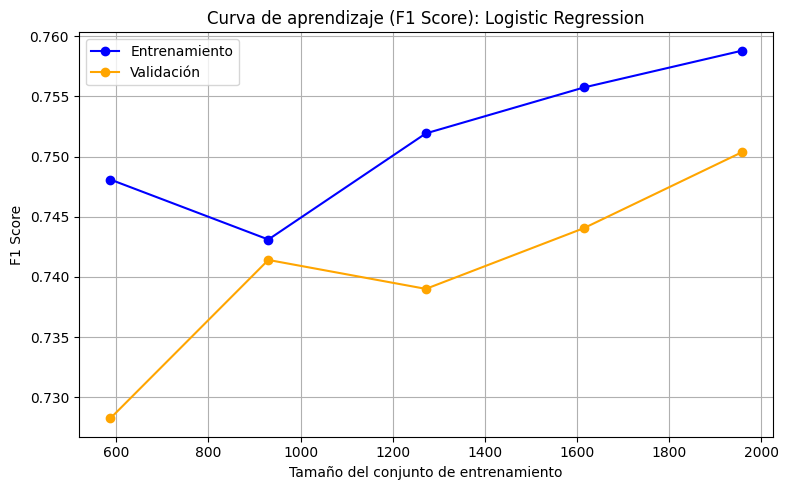


📈 Curvas de Aprendizaje: Random Forest


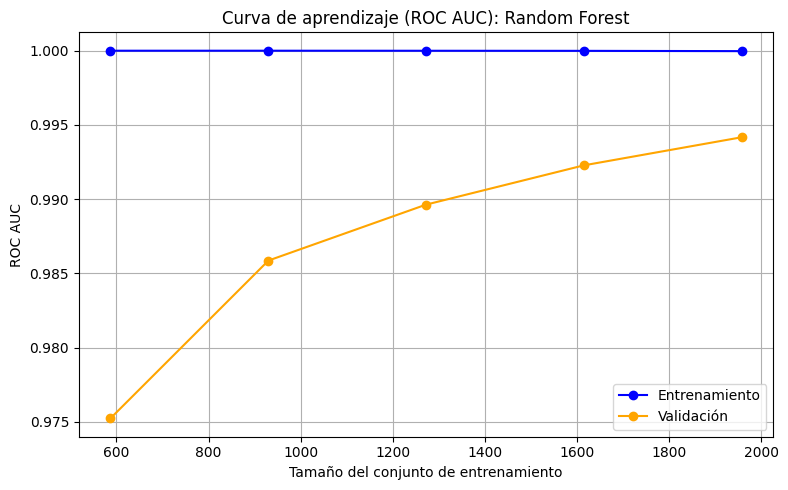

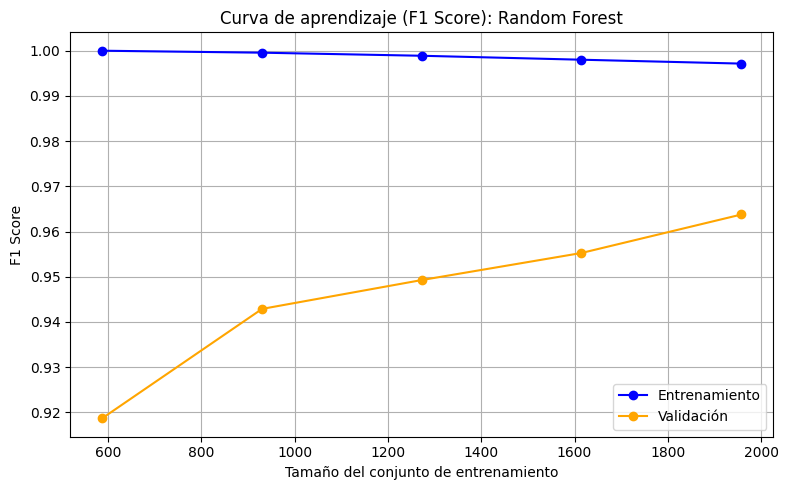


📈 Curvas de Aprendizaje: XGBoost


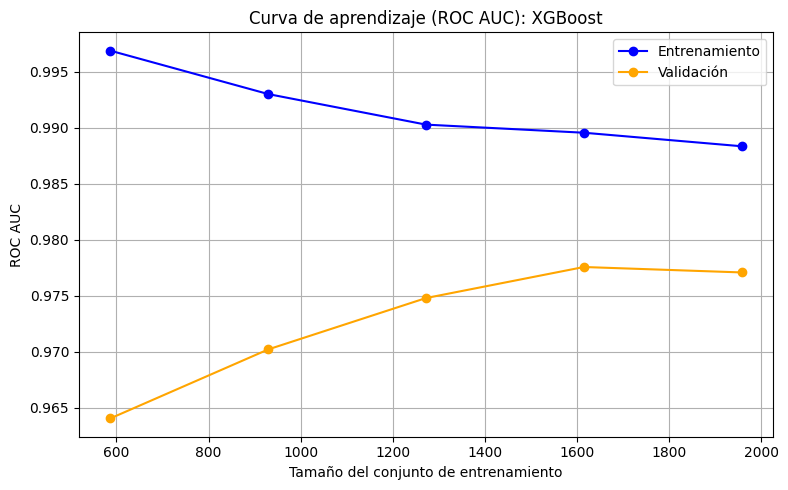

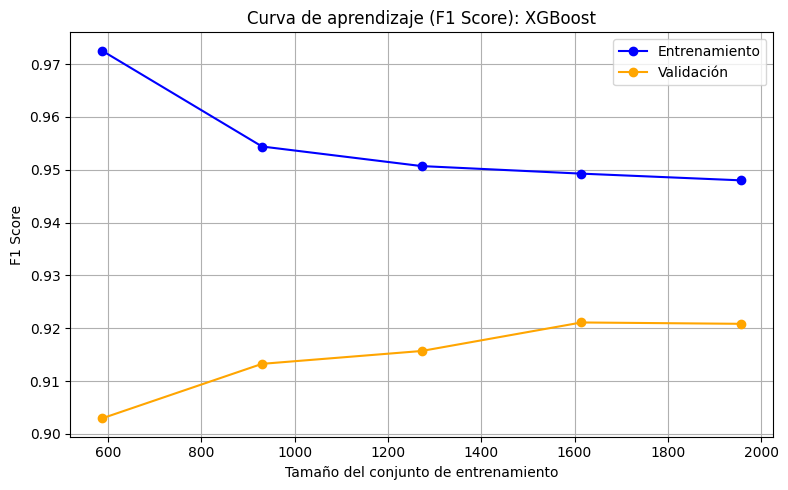


📈 Curvas de Aprendizaje: LightGBM


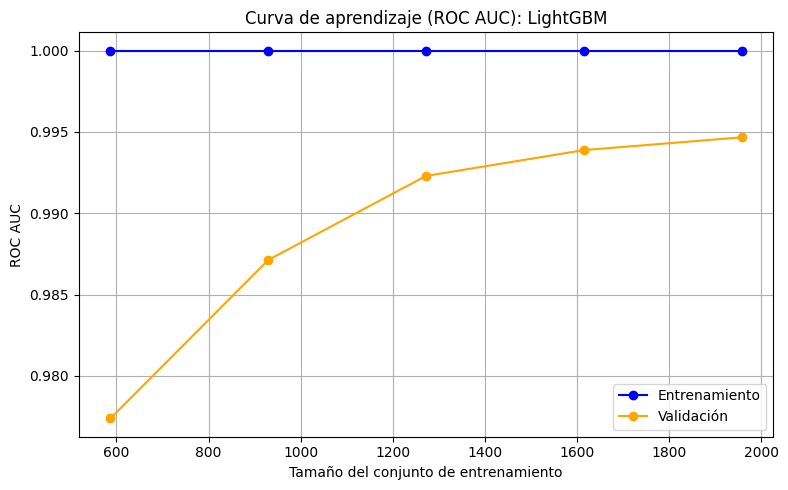

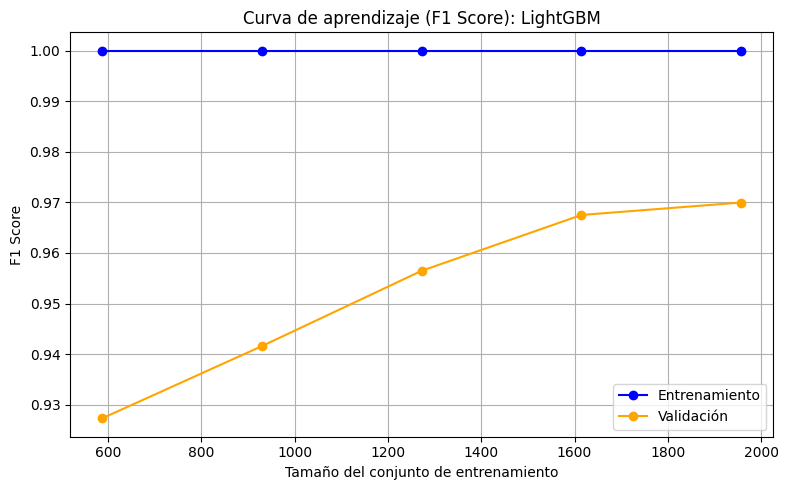

In [100]:
# ===========================================
# 1. Imports
# ===========================================
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, learning_curve
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, confusion_matrix

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.combine import SMOTETomek
from imblearn.over_sampling import SMOTE
from sklearn.base import clone

# ===========================================
# 2. Configuración y datos (definir `X`, `y`, `numerical`, `categorical`)
# ===========================================
random.seed(42)

# Split inicial
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

# Preprocesador
preprocessor = ColumnTransformer([
    ("num", StandardScaler(), numerical),
    ("cat", OneHotEncoder(drop='first'), categorical)
])

# Balanceador
custom_smote = SMOTE(k_neighbors=3, random_state=42)
balancer = SMOTETomek(random_state=42, smote=custom_smote)

# ===========================================
# 3. Pipelines
# ===========================================
pipelines = {
    'logreg': ImbPipeline(steps=[
        ('preprocessing', preprocessor),
        ('balancing', balancer),
        ('classifier', LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42))
    ]),
    'rf': ImbPipeline(steps=[
        ('preprocessing', preprocessor),
        ('balancing', balancer),
        ('classifier', RandomForestClassifier(class_weight='balanced', random_state=42))
    ]),
    'xgb': ImbPipeline(steps=[
        ('preprocessing', preprocessor),
        ('balancing', balancer),
        ('classifier', XGBClassifier(eval_metric='logloss', use_label_encoder=False, random_state=42))
    ]),
    'lgb': ImbPipeline(steps=[
        ('preprocessing', preprocessor),
        ('balancing', balancer),
        ('classifier', LGBMClassifier(class_weight='balanced', random_state=42))
    ])
}

# Parámetros para búsqueda
param_grids = {
    'logreg': {'classifier__C': [0.01, 0.1, 1, 10]},
    'rf': {'classifier__n_estimators': [100, 200], 'classifier__max_depth': [None, 10, 20]},
    'xgb': {'classifier__n_estimators': [100, 200], 'classifier__max_depth': [3, 6], 'classifier__learning_rate': [0.05, 0.1]},
    'lgb': {'classifier__n_estimators': [100, 200], 'classifier__max_depth': [-1, 10], 'classifier__learning_rate': [0.05, 0.1]}
}

# ===========================================
# 4. Funciones auxiliares
# ===========================================
def plot_conf_matrix(y_true, y_pred, model_name=""):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(f'Matriz de Confusión - {model_name}')
    plt.xlabel('Predicción')
    plt.ylabel('Real')
    plt.tight_layout()
    plt.show()

def show_detailed_metrics(model, X, y, title=""):
    y_proba = model.predict_proba(X)[:, 1]
    y_pred = (y_proba >= 0.3).astype(int)
    print(f"\n📋 {title}")
    print(classification_report(y, y_pred, digits=3))
    plot_conf_matrix(y, y_pred, model_name=title)

# ===========================================
# 5. Entrenamiento, métricas (train_bal / test_bal)
# ===========================================
best_models = {}
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for name, pipeline in pipelines.items():
    print(f"\n🔍 Buscando hiperparámetros para {name.upper()}")
    grid = GridSearchCV(pipeline, param_grids[name], cv=cv, scoring='f1', n_jobs=-1)
    grid.fit(X_train, y_train)

    print("Mejores hiperparámetros:", grid.best_params_)
    best_models[name] = grid.best_estimator_

    # Obtener preprocesador y clasificador del pipeline entrenado
    preprocessor_fitted = grid.best_estimator_.named_steps['preprocessing']
    classifier = grid.best_estimator_.named_steps['classifier']

    # Re-preprocesar y rebalancear manualmente (IMPORTANTE para coherencia)
    X_train_enc = preprocessor_fitted.transform(X_train)
    X_test_enc = preprocessor_fitted.transform(X_test)

    smote_tomek = SMOTETomek(random_state=42, smote=SMOTE(k_neighbors=3, random_state=42))
    X_train_bal, y_train_bal = smote_tomek.fit_resample(X_train_enc, y_train)
    X_test_bal, y_test_bal = smote_tomek.fit_resample(X_test_enc, y_test)

    # Entrenar con conjunto de entrenamiento balanceado
    classifier.fit(X_train_bal, y_train_bal)

    # Métricas en train balanceado
    show_detailed_metrics(classifier, X_train_bal, y_train_bal, title=f"{name.upper()} - Train Balanceado")

    # Métricas en test balanceado
    show_detailed_metrics(classifier, X_test_bal, y_test_bal, title=f"{name.upper()} - Test Balanceado")

# ===========================================
# 6. Curvas de Aprendizaje (sobre datos balanceados y preprocesados)
# ===========================================
def plot_learning_curves_dual(estimator, X, y, title="", cv=5, train_sizes=np.linspace(0.3, 1.0, 5)):
    metrics = {
        'ROC AUC': 'roc_auc',
        'F1 Score': 'f1'
    }

    cv_strategy = StratifiedKFold(n_splits=cv, shuffle=True, random_state=42)

    for metric_name, scoring in metrics.items():
        plt.figure(figsize=(8, 5))
        try:
            train_sizes_out, train_scores, val_scores = learning_curve(
                clone(estimator),
                X, y,
                cv=cv_strategy,
                scoring=scoring,
                n_jobs=-1,
                train_sizes=train_sizes,
                shuffle=True,
                random_state=42
            )

            train_scores_mean = np.mean(train_scores, axis=1)
            val_scores_mean = np.mean(val_scores, axis=1)

            plt.plot(train_sizes_out, train_scores_mean, 'o-', color='blue', label='Entrenamiento')
            plt.plot(train_sizes_out, val_scores_mean, 'o-', color='orange', label='Validación')

            plt.title(f'Curva de aprendizaje ({metric_name}): {title}')
            plt.xlabel('Tamaño del conjunto de entrenamiento')
            plt.ylabel(metric_name)
            plt.legend(loc='best')
            plt.grid(True)
            plt.tight_layout()
            plt.show()

        except ValueError as e:
            print(f"⚠️ Error al generar la curva de aprendizaje ({metric_name}) para {title}: {e}")

print("\n📈 Curvas de Aprendizaje: Logistic Regression")
# Usar clasificador + datos balanceados y preprocesados
X_train_enc = best_models['logreg'].named_steps['preprocessing'].transform(X_train)
smote_tomek = SMOTETomek(random_state=42, smote=SMOTE(k_neighbors=3, random_state=42))
X_train_bal, y_train_bal = smote_tomek.fit_resample(X_train_enc, y_train)
plot_learning_curves_dual(best_models['logreg'].named_steps['classifier'], X_train_bal, y_train_bal, "Logistic Regression")

print("\n📈 Curvas de Aprendizaje: Random Forest")
X_train_enc = best_models['rf'].named_steps['preprocessing'].transform(X_train)
X_train_bal, y_train_bal = smote_tomek.fit_resample(X_train_enc, y_train)
plot_learning_curves_dual(best_models['rf'].named_steps['classifier'], X_train_bal, y_train_bal, "Random Forest")

print("\n📈 Curvas de Aprendizaje: XGBoost")
X_train_enc = best_models['xgb'].named_steps['preprocessing'].transform(X_train)
X_train_bal, y_train_bal = smote_tomek.fit_resample(X_train_enc, y_train)
plot_learning_curves_dual(best_models['xgb'].named_steps['classifier'], X_train_bal, y_train_bal, "XGBoost")

print("\n📈 Curvas de Aprendizaje: LightGBM")
X_train_enc = best_models['lgb'].named_steps['preprocessing'].transform(X_train)
X_train_bal, y_train_bal = smote_tomek.fit_resample(X_train_enc, y_train)
plot_learning_curves_dual(best_models['lgb'].named_steps['classifier'], X_train_bal, y_train_bal, "LightGBM")





## Optimización con técnicas de balanceo especializadas


🔄 Evaluando técnica de balanceo: SMOTEENN

⚙️ LOGREG con SMOTEENN
Mejores hiperparámetros: {'classifier__C': 0.01}

📋 LOGREG - SMOTEENN - Train Balanceado
              precision    recall  f1-score   support

         0.0      0.887     0.584     0.705       902
         1.0      0.755     0.945     0.839      1222

    accuracy                          0.792      2124
   macro avg      0.821     0.765     0.772      2124
weighted avg      0.811     0.792     0.782      2124



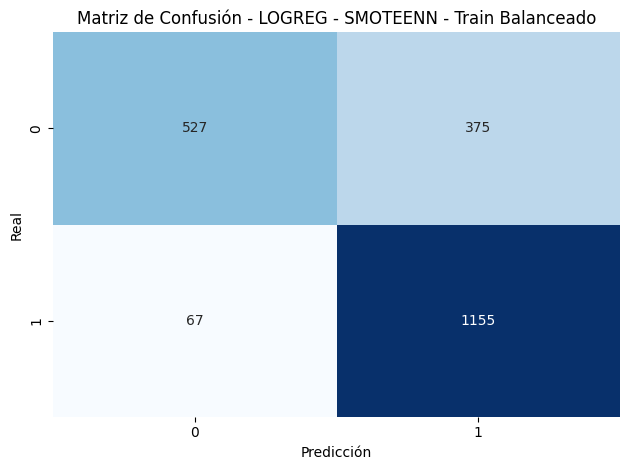


📋 LOGREG - SMOTEENN - Test Balanceado
              precision    recall  f1-score   support

         0.0      0.917     0.571     0.704       231
         1.0      0.747     0.961     0.841       305

    accuracy                          0.793       536
   macro avg      0.832     0.766     0.772       536
weighted avg      0.820     0.793     0.782       536



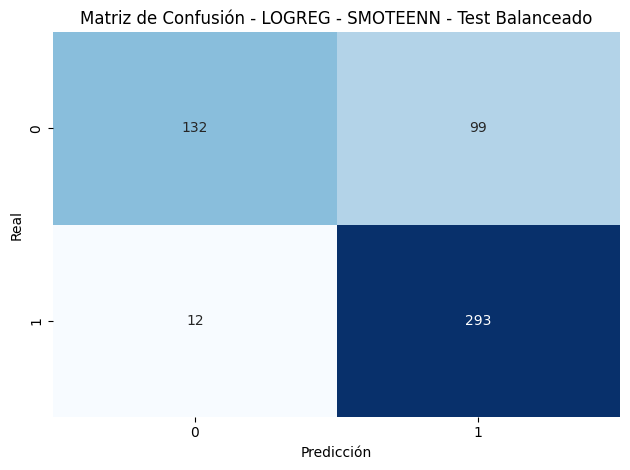


📈 Curvas de Aprendizaje: LOGREG - SMOTEENN


C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py:547: FitFailedWarning: 
5 fits failed out of a total of 25.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py", line 1474, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\Pedro López\AppData\Roaming\P

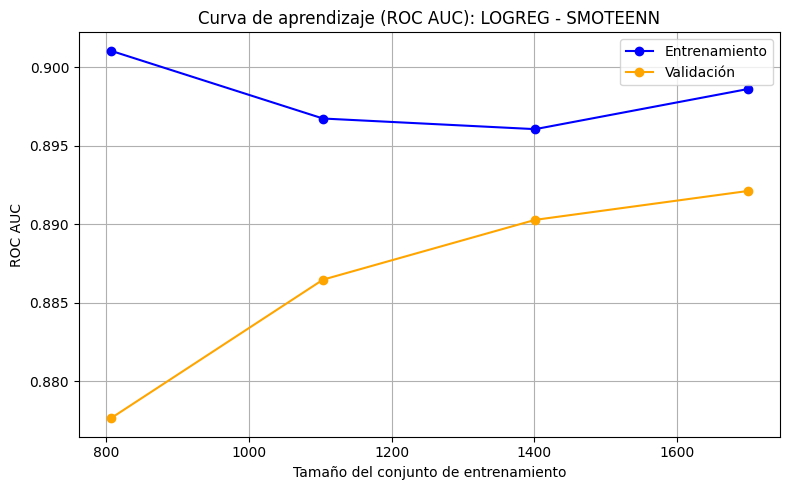

C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py:547: FitFailedWarning: 
5 fits failed out of a total of 25.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py", line 1474, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\Pedro López\AppData\Roaming\P

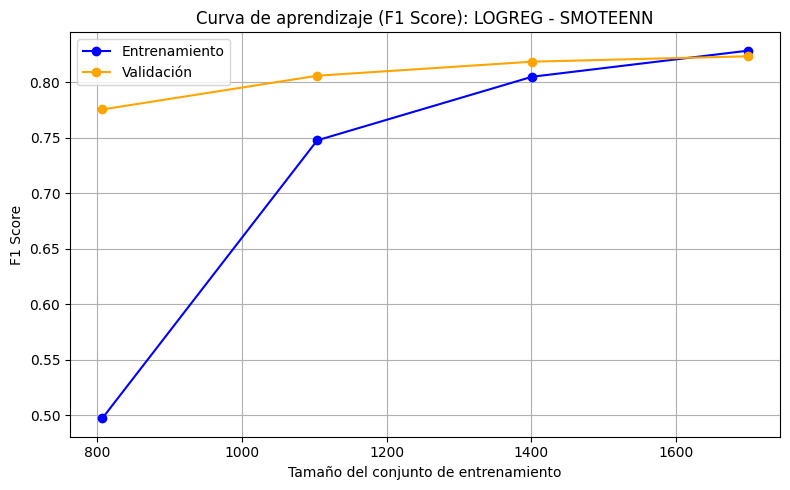


⚙️ RF con SMOTEENN
Mejores hiperparámetros: {'classifier__max_depth': 10, 'classifier__n_estimators': 200}

📋 RF - SMOTEENN - Train Balanceado
              precision    recall  f1-score   support

         0.0      1.000     0.978     0.989       908
         1.0      0.984     1.000     0.992      1221

    accuracy                          0.991      2129
   macro avg      0.992     0.989     0.990      2129
weighted avg      0.991     0.991     0.991      2129



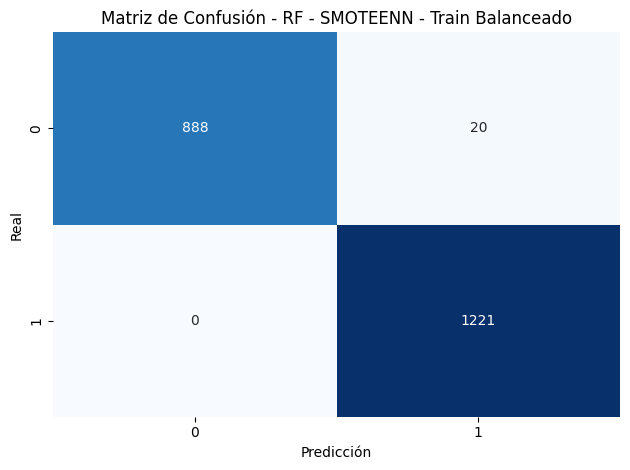


📋 RF - SMOTEENN - Test Balanceado
              precision    recall  f1-score   support

         0.0      0.958     0.899     0.927       227
         1.0      0.928     0.971     0.949       306

    accuracy                          0.940       533
   macro avg      0.943     0.935     0.938       533
weighted avg      0.941     0.940     0.940       533



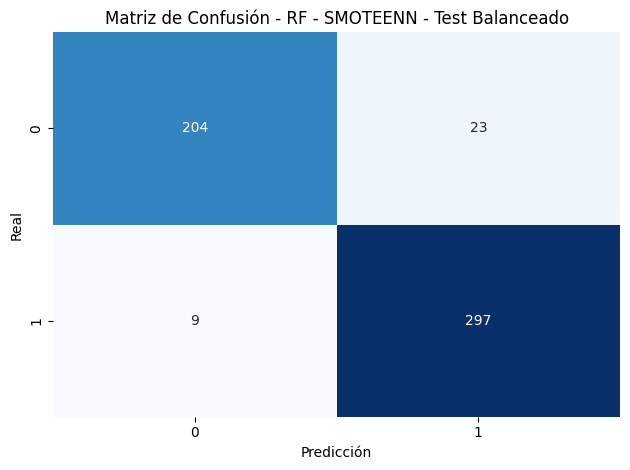


📈 Curvas de Aprendizaje: RF - SMOTEENN


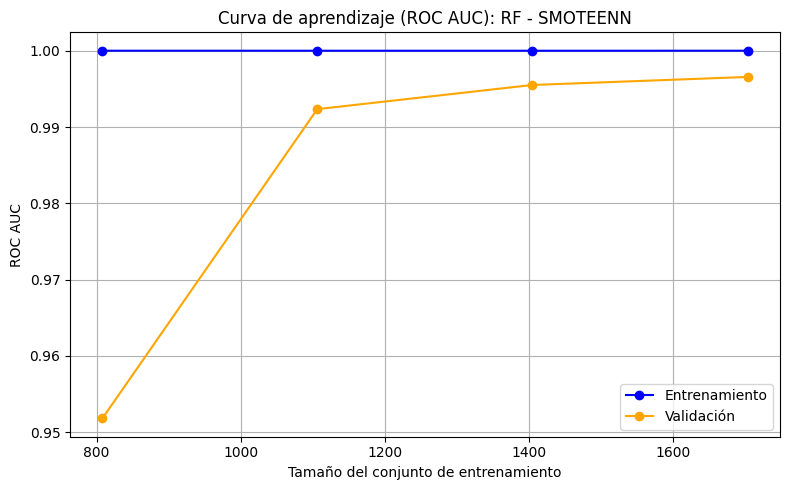

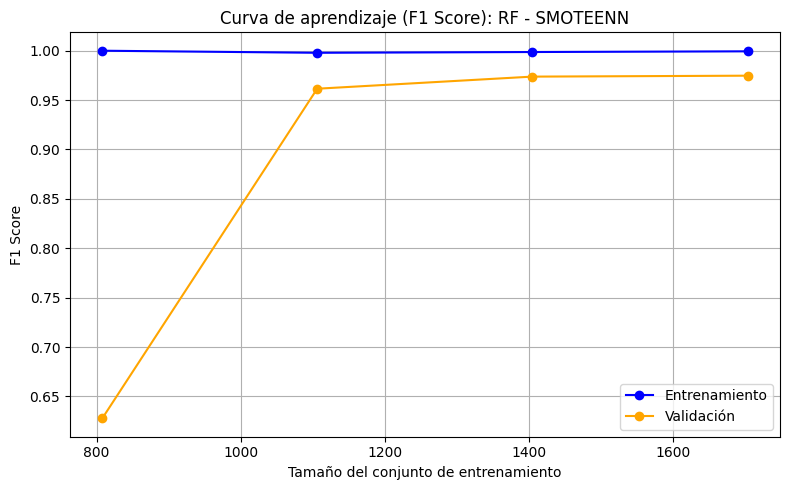


⚙️ XGB con SMOTEENN
Mejores hiperparámetros: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 6, 'classifier__n_estimators': 200}

📋 XGB - SMOTEENN - Train Balanceado
              precision    recall  f1-score   support

         0.0      1.000     1.000     1.000       904
         1.0      1.000     1.000     1.000      1221

    accuracy                          1.000      2125
   macro avg      1.000     1.000     1.000      2125
weighted avg      1.000     1.000     1.000      2125



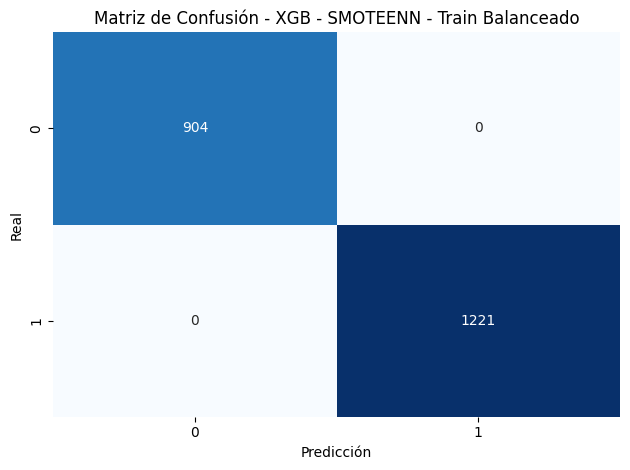


📋 XGB - SMOTEENN - Test Balanceado
              precision    recall  f1-score   support

         0.0      0.934     0.930     0.932       228
         1.0      0.948     0.951     0.949       305

    accuracy                          0.942       533
   macro avg      0.941     0.940     0.941       533
weighted avg      0.942     0.942     0.942       533



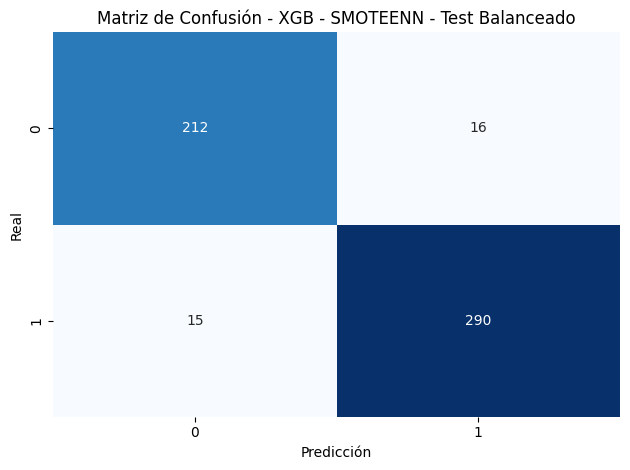


📈 Curvas de Aprendizaje: XGB - SMOTEENN


C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py:547: FitFailedWarning: 
5 fits failed out of a total of 25.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\xgboost\core.py", line 729, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\xgboost\sklearn.py"

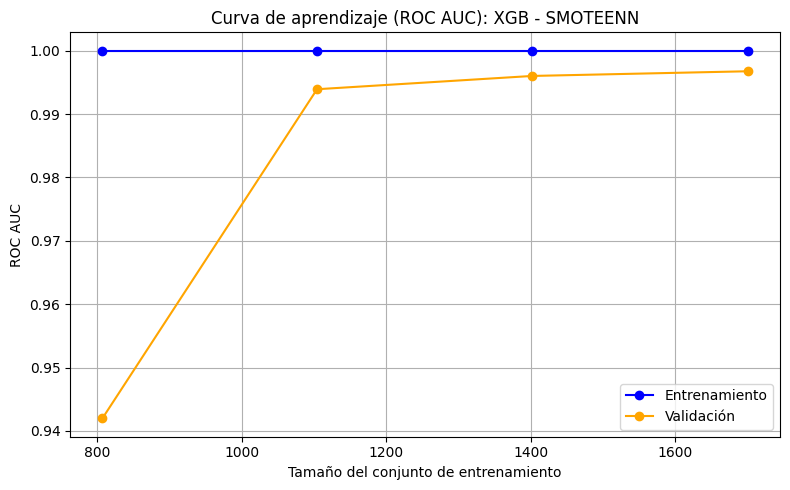

C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py:547: FitFailedWarning: 
5 fits failed out of a total of 25.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\xgboost\core.py", line 729, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\xgboost\sklearn.py"

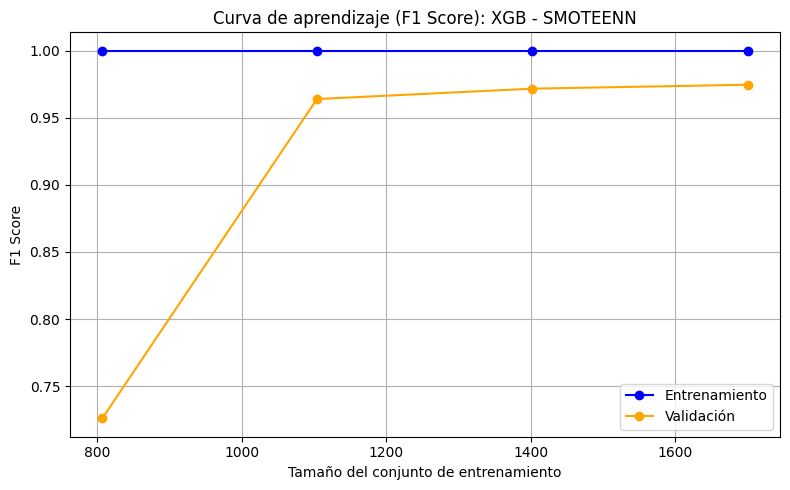


⚙️ LGB con SMOTEENN
[LightGBM] [Info] Number of positive: 1223, number of negative: 901
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6278
[LightGBM] [Info] Number of data points in the train set: 2124, number of used features: 35
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
Mejores hiperparámetros: {'classifier__learning_rate': 0.05, 'classifier__max_depth': 10, 'classifier__n_estimators': 200}
[LightGBM] [Info] Number of positive: 1222, number of negative: 905
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6259
[LightGBM] [Info] Number of data points in the train set: 2127, number of used features: 35
[LightGBM] [

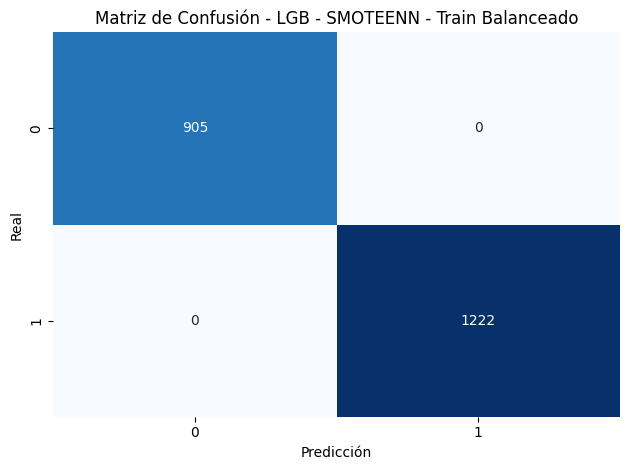


📋 LGB - SMOTEENN - Test Balanceado
              precision    recall  f1-score   support

         0.0      0.905     0.965     0.934       228
         1.0      0.972     0.924     0.948       304

    accuracy                          0.942       532
   macro avg      0.939     0.945     0.941       532
weighted avg      0.944     0.942     0.942       532



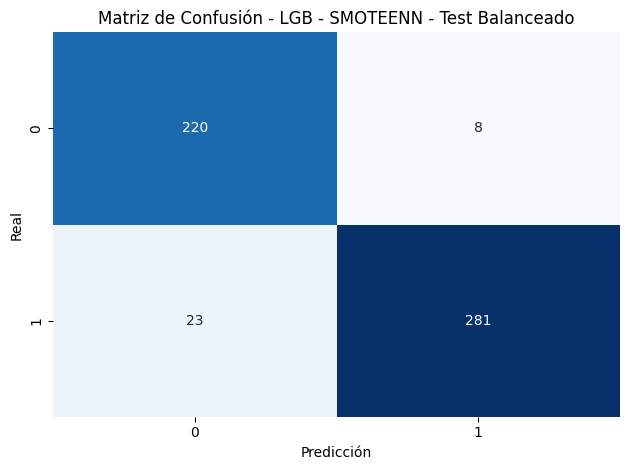


📈 Curvas de Aprendizaje: LGB - SMOTEENN


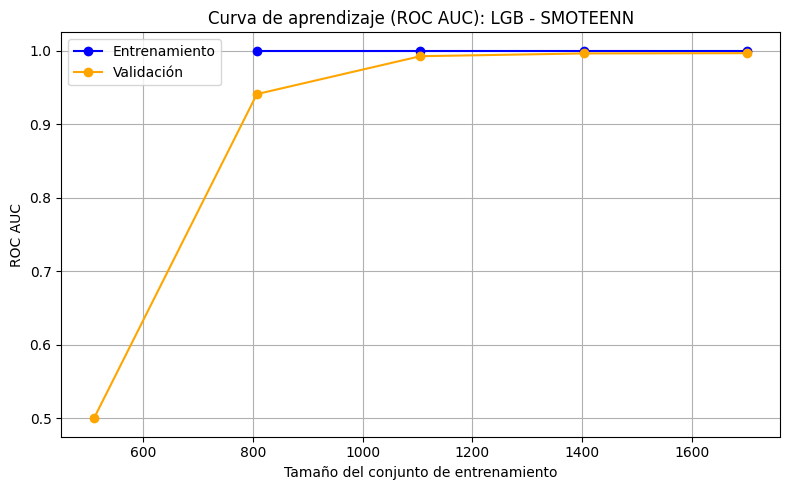

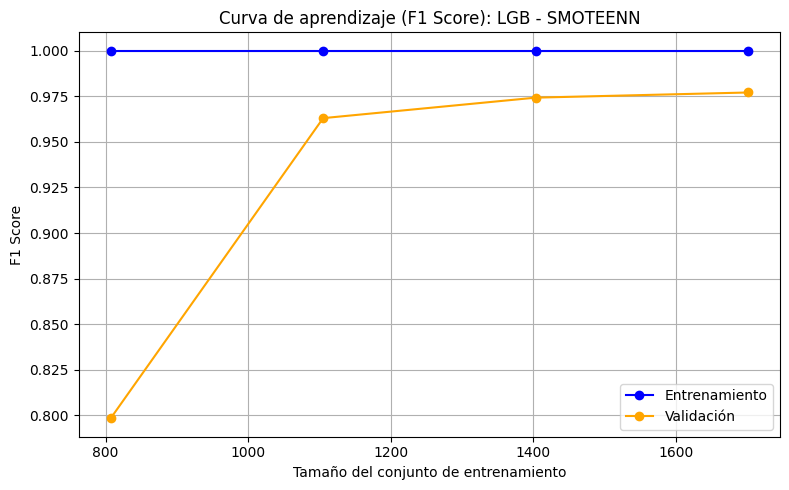


🔄 Evaluando técnica de balanceo: ADASYN

⚙️ LOGREG con ADASYN
Mejores hiperparámetros: {'classifier__C': 0.01}

📋 LOGREG - ADASYN - Train Balanceado
              precision    recall  f1-score   support

         0.0      0.923     0.448     0.603      1224
         1.0      0.640     0.963     0.769      1248

    accuracy                          0.708      2472
   macro avg      0.781     0.705     0.686      2472
weighted avg      0.780     0.708     0.687      2472



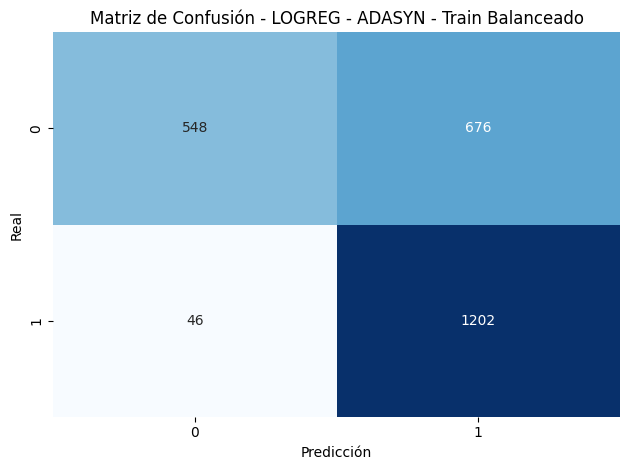


📋 LOGREG - ADASYN - Test Balanceado
              precision    recall  f1-score   support

         0.0      0.986     0.467     0.634       306
         1.0      0.653     0.994     0.788       309

    accuracy                          0.732       615
   macro avg      0.820     0.730     0.711       615
weighted avg      0.819     0.732     0.712       615



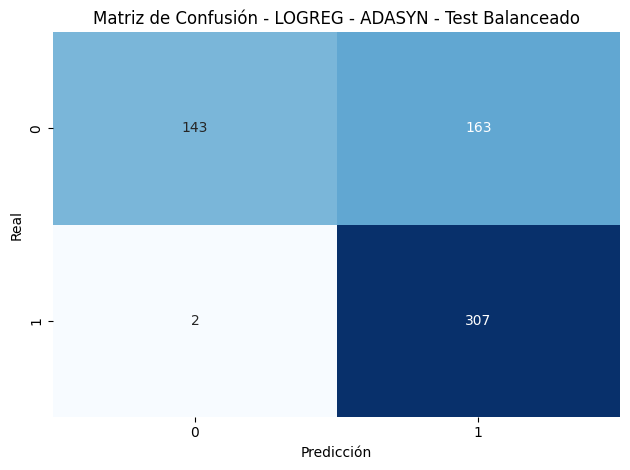


📈 Curvas de Aprendizaje: LOGREG - ADASYN


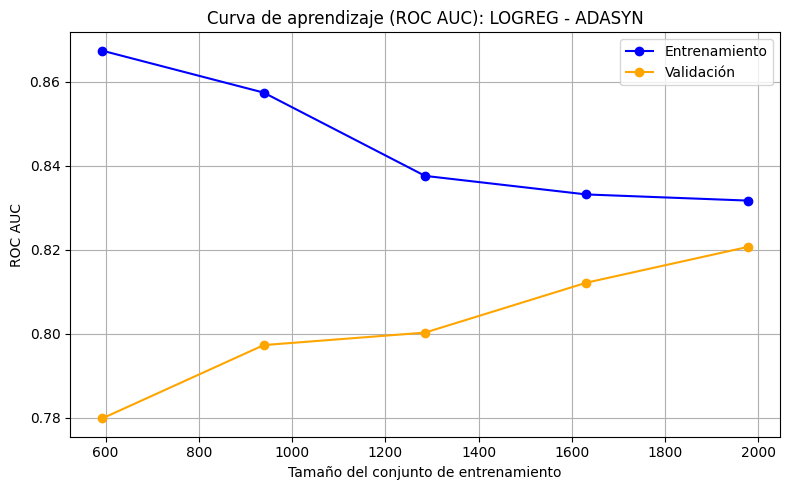

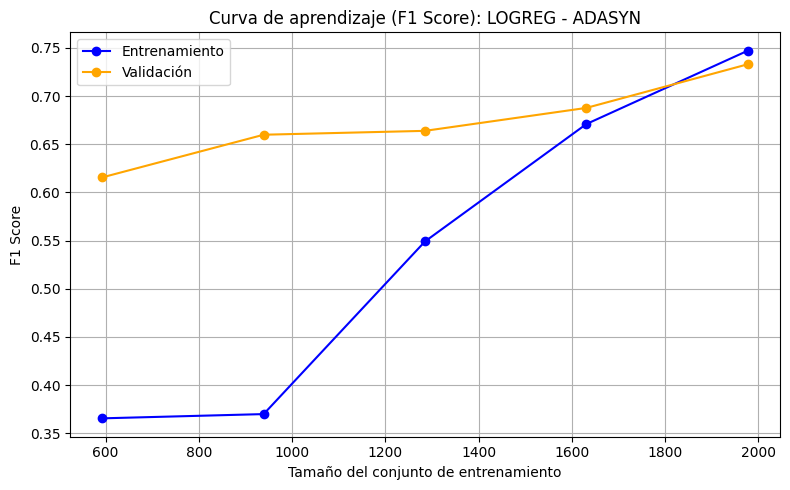


⚙️ RF con ADASYN
Mejores hiperparámetros: {'classifier__max_depth': 10, 'classifier__n_estimators': 200}

📋 RF - ADASYN - Train Balanceado
              precision    recall  f1-score   support

         0.0      1.000     0.963     0.981      1224
         1.0      0.965     1.000     0.982      1248

    accuracy                          0.982      2472
   macro avg      0.983     0.982     0.982      2472
weighted avg      0.982     0.982     0.982      2472



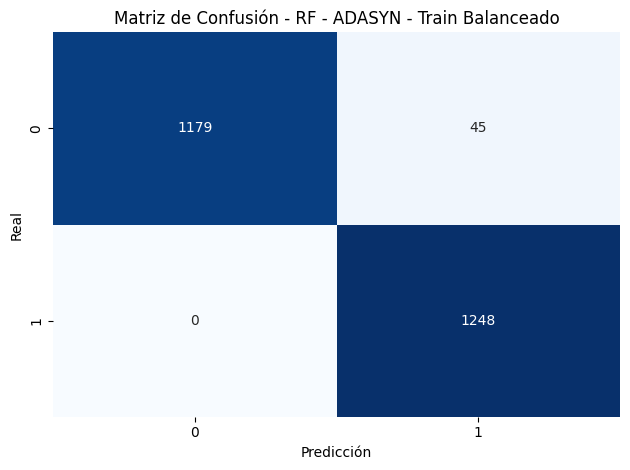


📋 RF - ADASYN - Test Balanceado
              precision    recall  f1-score   support

         0.0      0.944     0.889     0.916       306
         1.0      0.896     0.948     0.921       309

    accuracy                          0.919       615
   macro avg      0.920     0.919     0.919       615
weighted avg      0.920     0.919     0.919       615



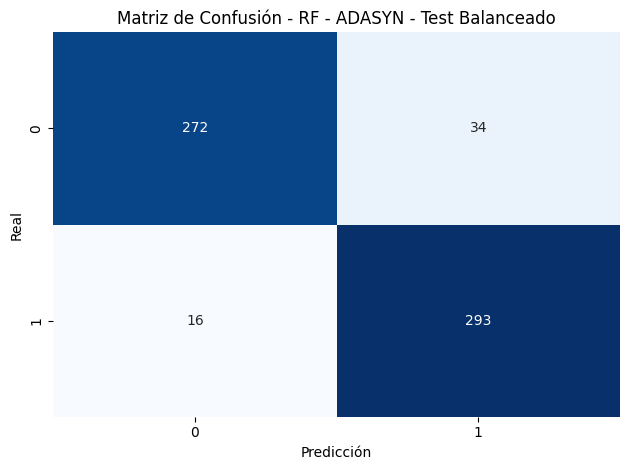


📈 Curvas de Aprendizaje: RF - ADASYN


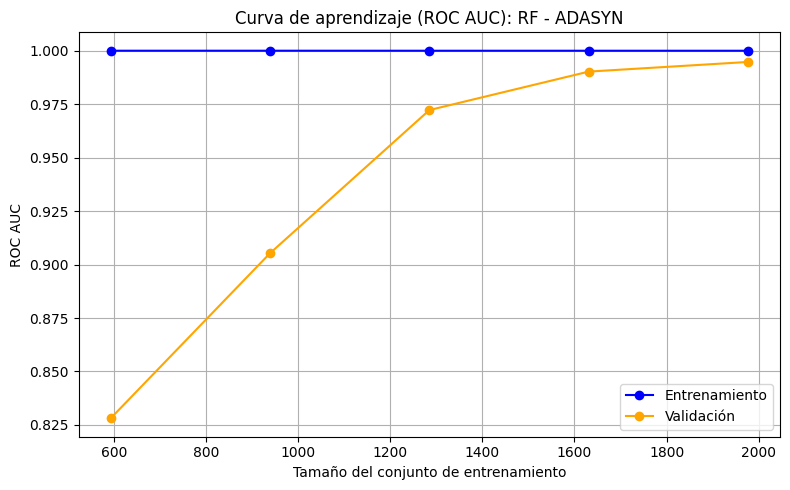

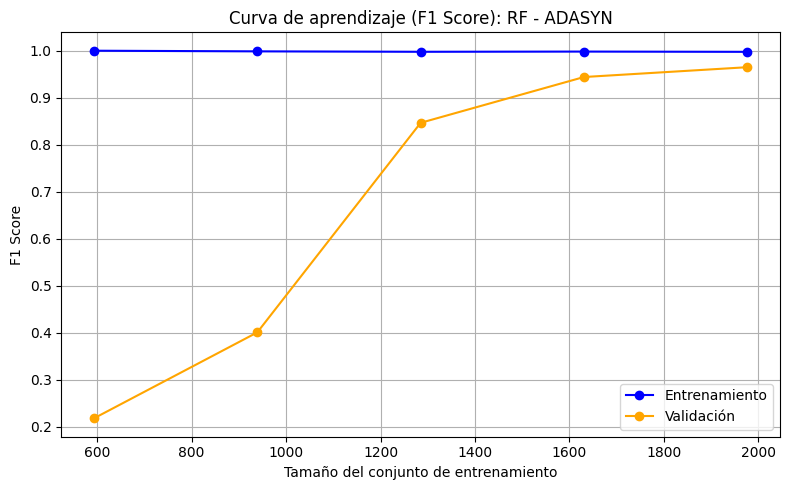


⚙️ XGB con ADASYN
Mejores hiperparámetros: {'classifier__learning_rate': 0.05, 'classifier__max_depth': 3, 'classifier__n_estimators': 100}

📋 XGB - ADASYN - Train Balanceado
              precision    recall  f1-score   support

         0.0      0.984     0.798     0.881      1224
         1.0      0.833     0.987     0.904      1248

    accuracy                          0.894      2472
   macro avg      0.908     0.893     0.892      2472
weighted avg      0.908     0.894     0.893      2472



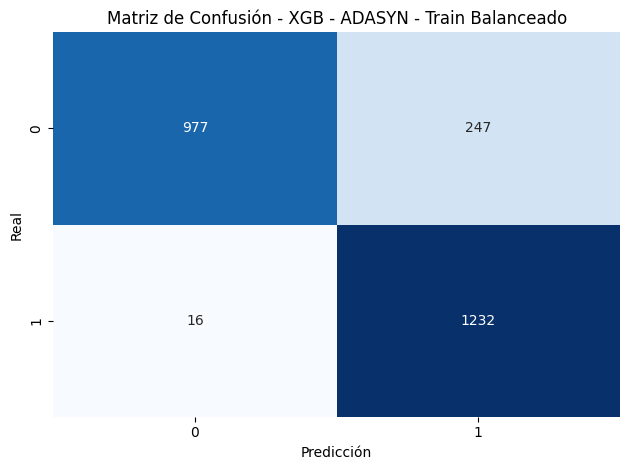


📋 XGB - ADASYN - Test Balanceado
              precision    recall  f1-score   support

         0.0      0.944     0.830     0.883       306
         1.0      0.850     0.951     0.898       309

    accuracy                          0.891       615
   macro avg      0.897     0.891     0.891       615
weighted avg      0.897     0.891     0.891       615



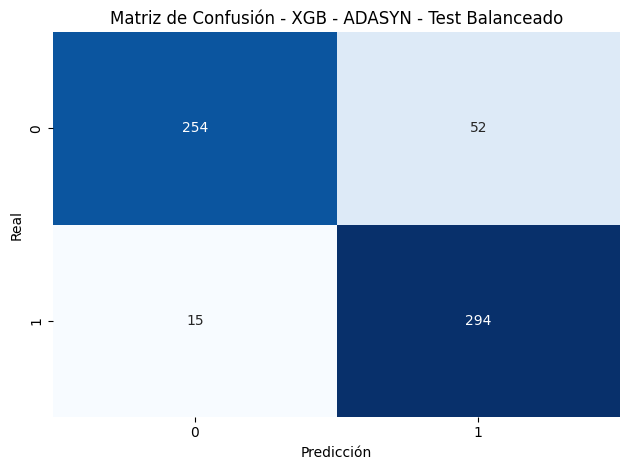


📈 Curvas de Aprendizaje: XGB - ADASYN


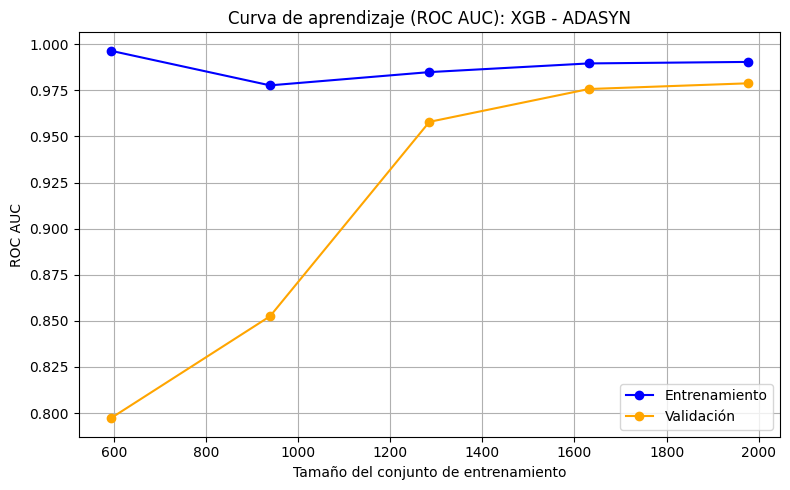

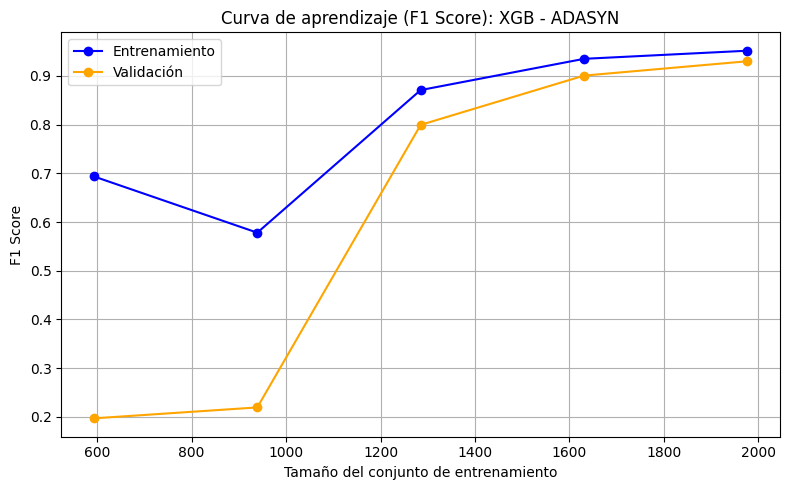


⚙️ LGB con ADASYN
[LightGBM] [Info] Number of positive: 1248, number of negative: 1224
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6350
[LightGBM] [Info] Number of data points in the train set: 2472, number of used features: 35
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
Mejores hiperparámetros: {'classifier__learning_rate': 0.05, 'classifier__max_depth': 10, 'classifier__n_estimators': 100}
[LightGBM] [Info] Number of positive: 1248, number of negative: 1224
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6350
[LightGBM] [Info] Number of data points in the train set: 2472, number of used features: 35
[LightGBM] [

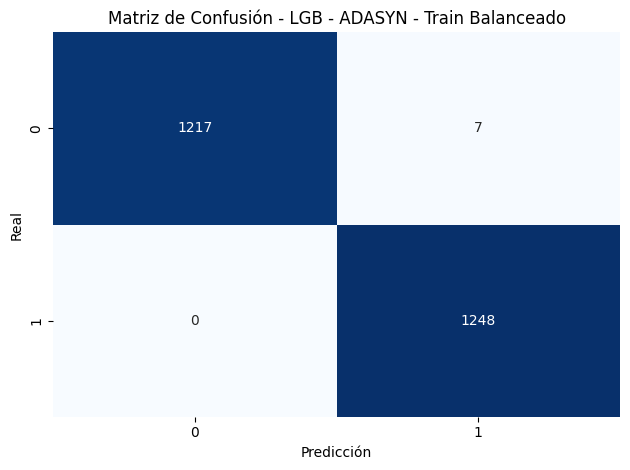


📋 LGB - ADASYN - Test Balanceado
              precision    recall  f1-score   support

         0.0      0.922     0.961     0.941       306
         1.0      0.959     0.919     0.939       309

    accuracy                          0.940       615
   macro avg      0.941     0.940     0.940       615
weighted avg      0.941     0.940     0.940       615



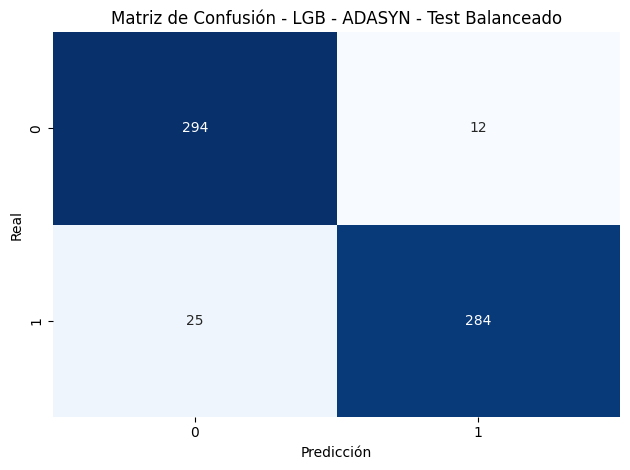


📈 Curvas de Aprendizaje: LGB - ADASYN


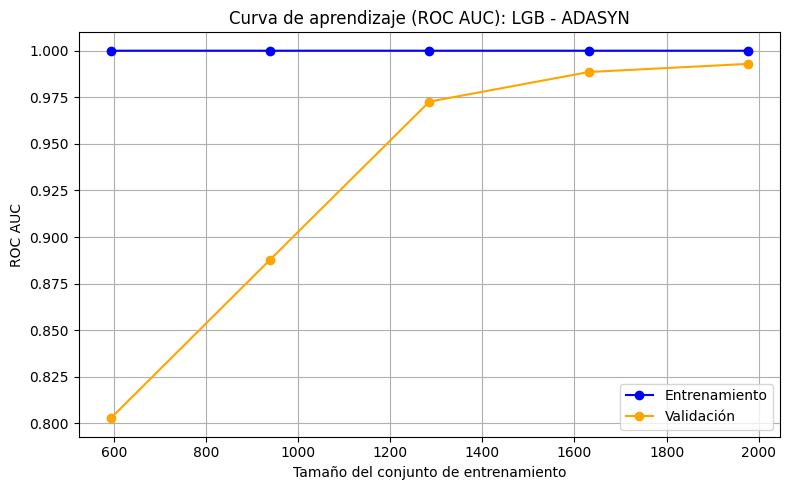

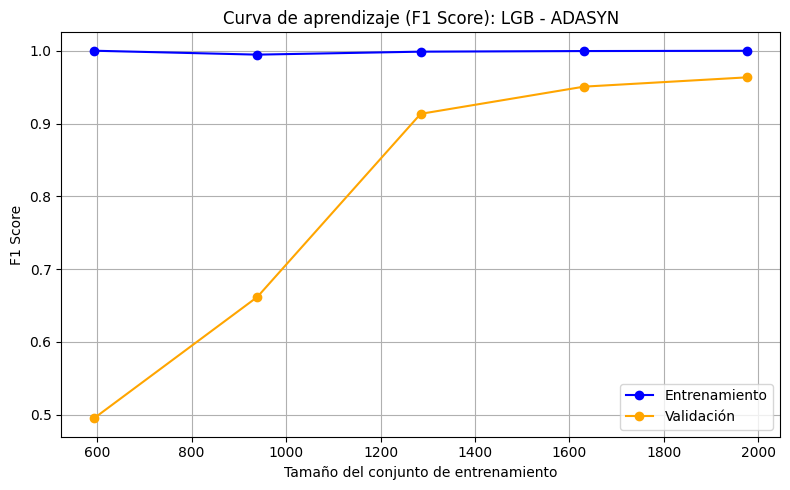


🔄 Evaluando técnica de balanceo: BorderlineSMOTE

⚙️ LOGREG con BorderlineSMOTE
Mejores hiperparámetros: {'classifier__C': 0.01}

📋 LOGREG - BorderlineSMOTE - Train Balanceado
              precision    recall  f1-score   support

         0.0      0.935     0.595     0.727      1224
         1.0      0.703     0.958     0.811      1224

    accuracy                          0.777      2448
   macro avg      0.819     0.777     0.769      2448
weighted avg      0.819     0.777     0.769      2448



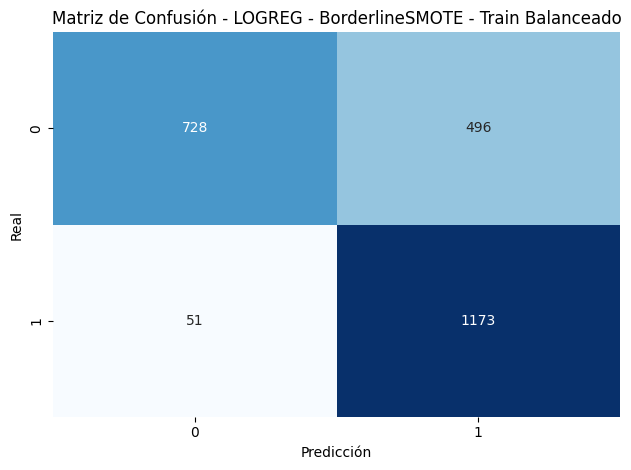


📋 LOGREG - BorderlineSMOTE - Test Balanceado
              precision    recall  f1-score   support

         0.0      0.974     0.601     0.743       306
         1.0      0.712     0.984     0.826       306

    accuracy                          0.792       612
   macro avg      0.843     0.792     0.785       612
weighted avg      0.843     0.792     0.785       612



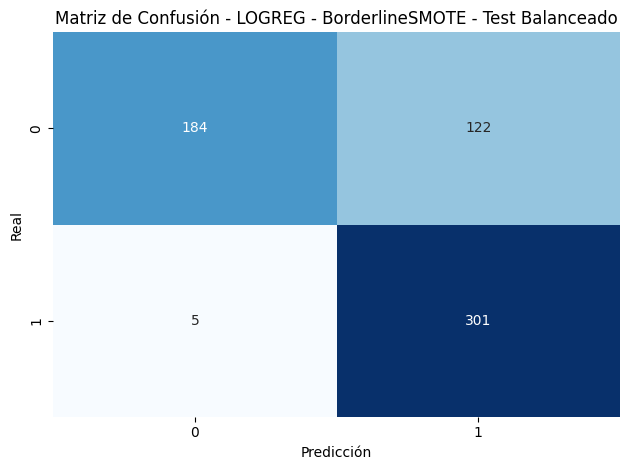


📈 Curvas de Aprendizaje: LOGREG - BorderlineSMOTE


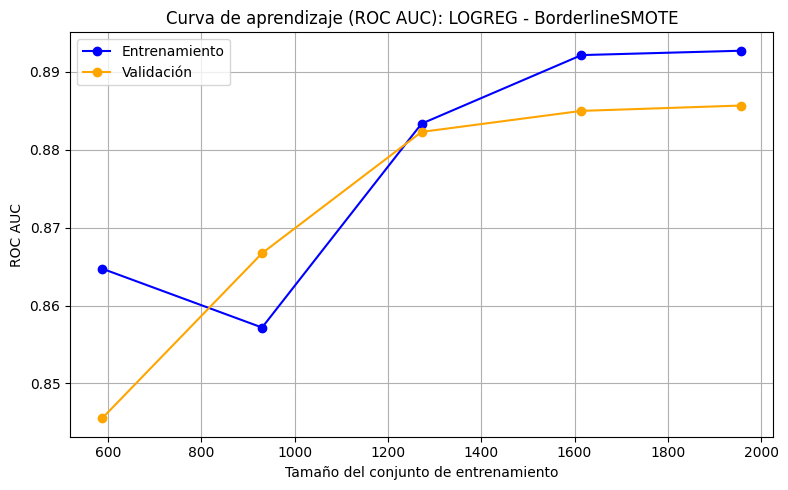

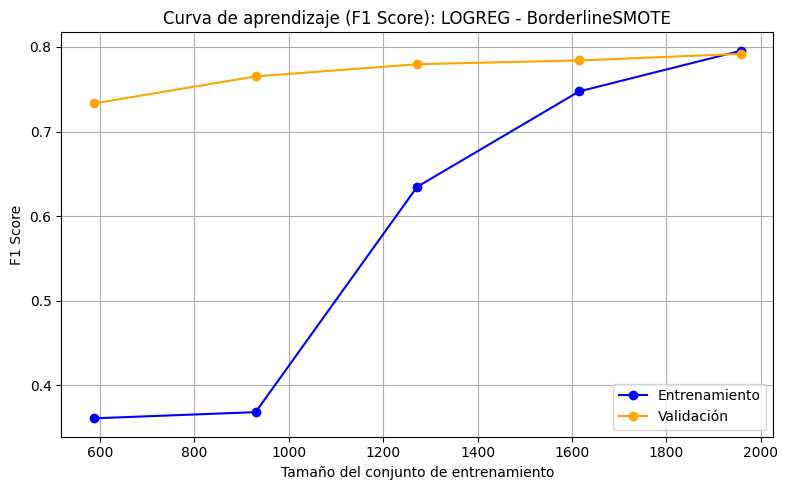


⚙️ RF con BorderlineSMOTE
Mejores hiperparámetros: {'classifier__max_depth': 10, 'classifier__n_estimators': 100}

📋 RF - BorderlineSMOTE - Train Balanceado
              precision    recall  f1-score   support

         0.0      1.000     0.971     0.985      1224
         1.0      0.972     1.000     0.986      1224

    accuracy                          0.986      2448
   macro avg      0.986     0.986     0.986      2448
weighted avg      0.986     0.986     0.986      2448



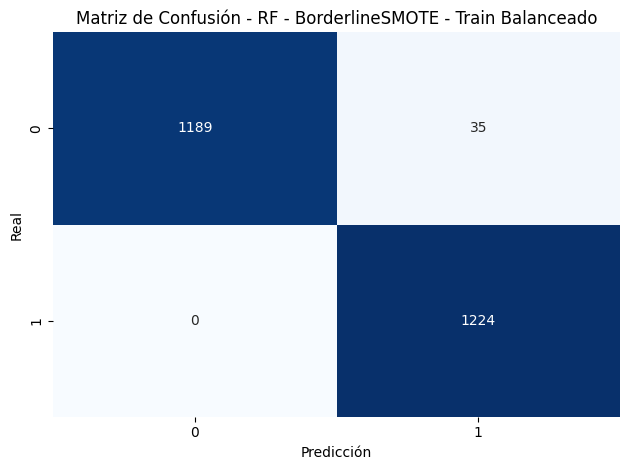


📋 RF - BorderlineSMOTE - Test Balanceado
              precision    recall  f1-score   support

         0.0      0.949     0.905     0.926       306
         1.0      0.909     0.951     0.930       306

    accuracy                          0.928       612
   macro avg      0.929     0.928     0.928       612
weighted avg      0.929     0.928     0.928       612



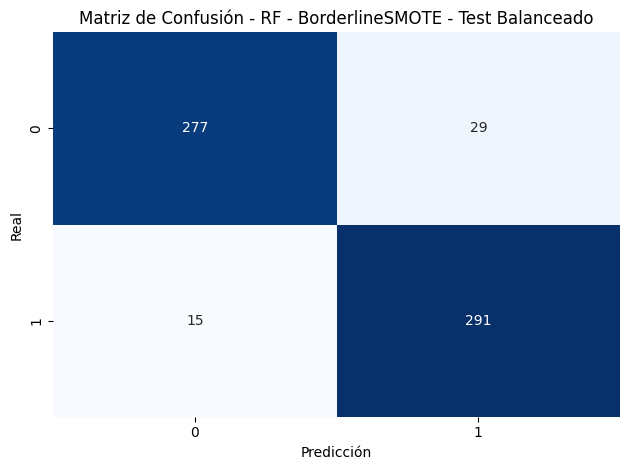


📈 Curvas de Aprendizaje: RF - BorderlineSMOTE


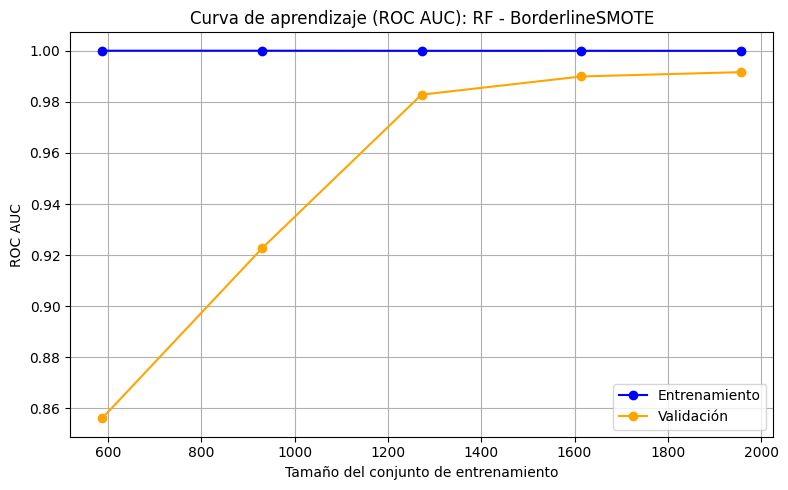

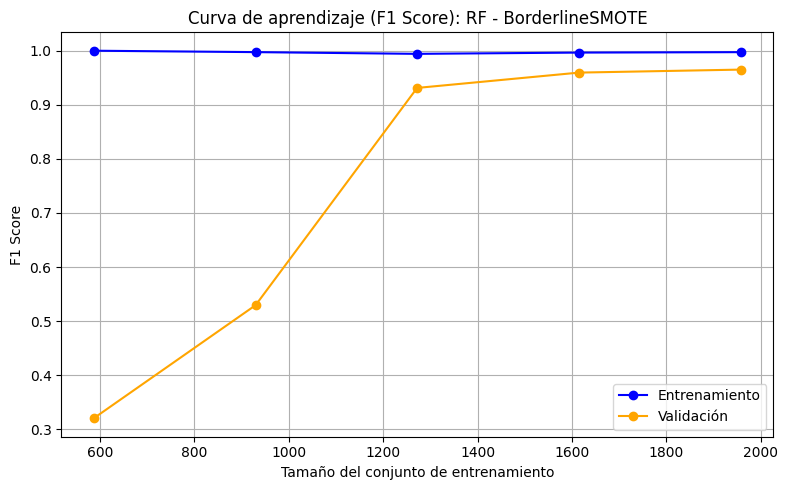


⚙️ XGB con BorderlineSMOTE
Mejores hiperparámetros: {'classifier__learning_rate': 0.05, 'classifier__max_depth': 3, 'classifier__n_estimators': 200}

📋 XGB - BorderlineSMOTE - Train Balanceado
              precision    recall  f1-score   support

         0.0      0.979     0.943     0.960      1224
         1.0      0.945     0.980     0.962      1224

    accuracy                          0.961      2448
   macro avg      0.962     0.961     0.961      2448
weighted avg      0.962     0.961     0.961      2448



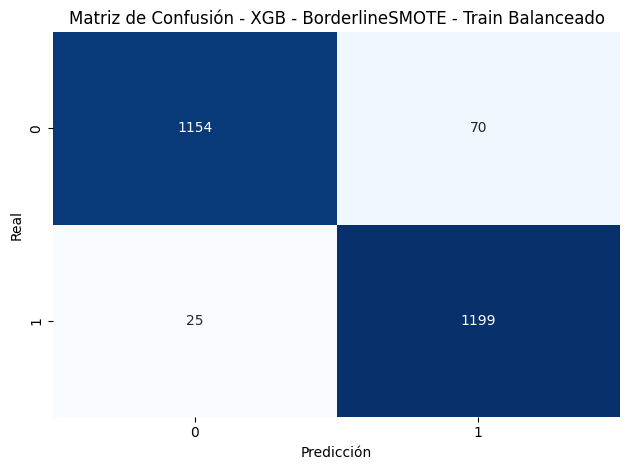


📋 XGB - BorderlineSMOTE - Test Balanceado
              precision    recall  f1-score   support

         0.0      0.934     0.886     0.909       306
         1.0      0.891     0.938     0.914       306

    accuracy                          0.912       612
   macro avg      0.913     0.912     0.912       612
weighted avg      0.913     0.912     0.912       612



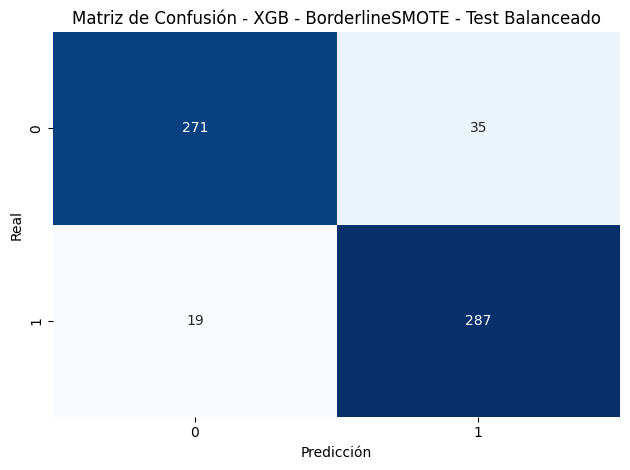


📈 Curvas de Aprendizaje: XGB - BorderlineSMOTE


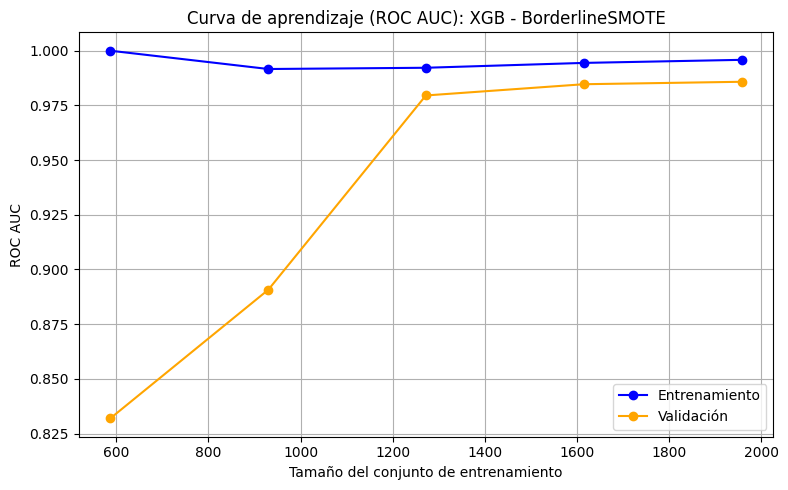

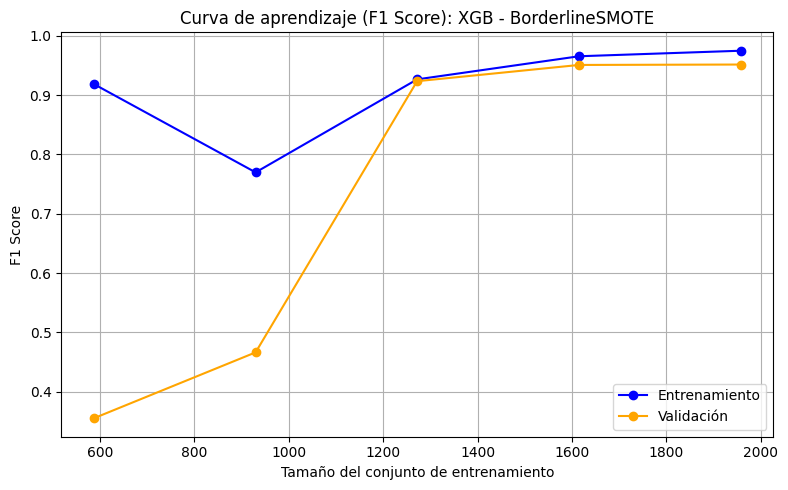


⚙️ LGB con BorderlineSMOTE
[LightGBM] [Info] Number of positive: 1224, number of negative: 1224
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000650 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6207
[LightGBM] [Info] Number of data points in the train set: 2448, number of used features: 35
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Mejores hiperparámetros: {'classifier__learning_rate': 0.05, 'classifier__max_depth': -1, 'classifier__n_estimators': 100}
[LightGBM] [Info] Number of positive: 1224, number of negative: 1224
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6207
[LightGBM] [Info] Number of data points in the train set: 2448, number of used features: 35
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000

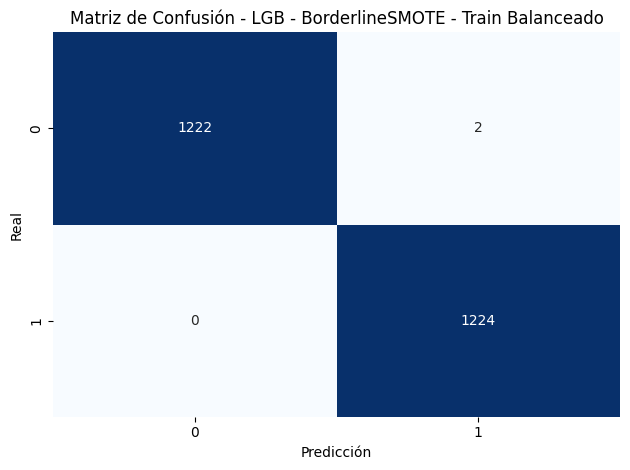


📋 LGB - BorderlineSMOTE - Test Balanceado
              precision    recall  f1-score   support

         0.0      0.901     0.948     0.924       306
         1.0      0.945     0.895     0.919       306

    accuracy                          0.922       612
   macro avg      0.923     0.922     0.922       612
weighted avg      0.923     0.922     0.922       612



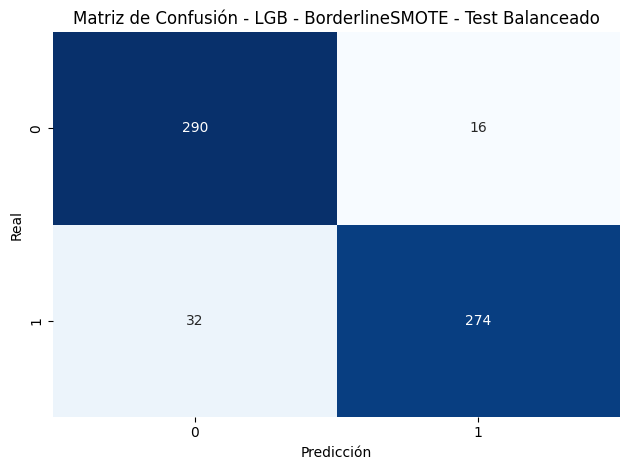


📈 Curvas de Aprendizaje: LGB - BorderlineSMOTE


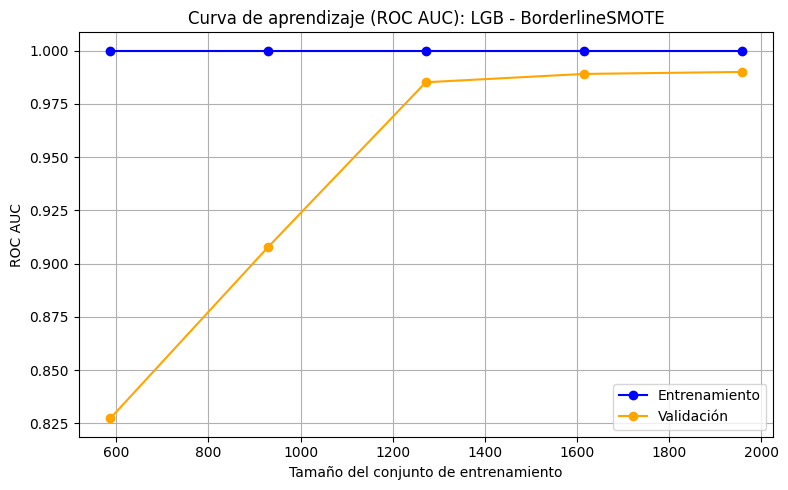

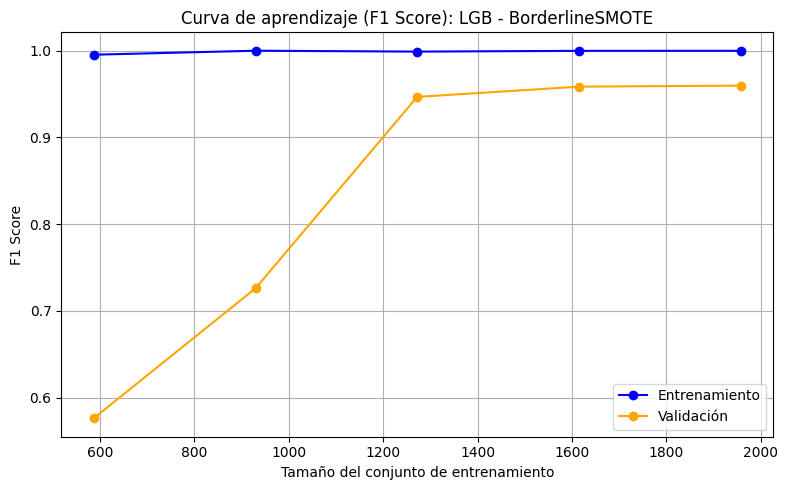

In [101]:
# ===========================================
# 1. Imports
# ===========================================
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import GridSearchCV, StratifiedKFold, train_test_split, learning_curve
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE, ADASYN, BorderlineSMOTE
from imblearn.combine import SMOTEENN

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

# ===========================================
# 2. Configuración y Datos (debes definir: X, y, numerical, categorical)
# ===========================================
random.seed(42)

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

preprocessor = ColumnTransformer([
    ("num", StandardScaler(), numerical),
    ("cat", OneHotEncoder(drop='first'), categorical)
])

# Técnicas de rebalanceo
balancing_strategies = {
    'SMOTEENN': SMOTEENN(random_state=42, smote=SMOTE(k_neighbors=3)),
    'ADASYN': ADASYN(random_state=42),
    'BorderlineSMOTE': BorderlineSMOTE(k_neighbors=3, random_state=42)
}

# Parámetros para cada modelo
param_grids = {
    'logreg': {'classifier__C': [0.01, 0.1, 1, 10]},
    'rf': {'classifier__n_estimators': [100, 200], 'classifier__max_depth': [None, 10, 20]},
    'xgb': {'classifier__n_estimators': [100, 200], 'classifier__max_depth': [3, 6], 'classifier__learning_rate': [0.05, 0.1]},
    'lgb': {'classifier__n_estimators': [100, 200], 'classifier__max_depth': [-1, 10], 'classifier__learning_rate': [0.05, 0.1]}
}

# ===========================================
# 3. Funciones auxiliares
# ===========================================
def plot_conf_matrix(y_true, y_pred, model_name=""):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(f'Matriz de Confusión - {model_name}')
    plt.xlabel('Predicción')
    plt.ylabel('Real')
    plt.tight_layout()
    plt.show()

def show_detailed_metrics(model, X, y, title=""):
    y_proba = model.predict_proba(X)[:, 1]
    y_pred = (y_proba >= 0.3).astype(int)
    print(f"\n📋 {title}")
    print(classification_report(y, y_pred, digits=3))
    plot_conf_matrix(y, y_pred, model_name=title)

def plot_learning_curves_dual(estimator, X, y, title="", cv=5, train_sizes=np.linspace(0.3, 1.0, 5)):
    metrics = {
        'ROC AUC': 'roc_auc',
        'F1 Score': 'f1'
    }

    cv_strategy = StratifiedKFold(n_splits=cv, shuffle=True, random_state=42)

    for metric_name, scoring in metrics.items():
        plt.figure(figsize=(8, 5))
        try:
            train_sizes_out, train_scores, val_scores = learning_curve(
                estimator, X, y, cv=cv_strategy, scoring=scoring, n_jobs=-1, train_sizes=train_sizes
            )

            train_scores_mean = np.mean(train_scores, axis=1)
            val_scores_mean = np.mean(val_scores, axis=1)

            plt.plot(train_sizes_out, train_scores_mean, 'o-', color='blue', label='Entrenamiento')
            plt.plot(train_sizes_out, val_scores_mean, 'o-', color='orange', label='Validación')

            plt.title(f'Curva de aprendizaje ({metric_name}): {title}')
            plt.xlabel('Tamaño del conjunto de entrenamiento')
            plt.ylabel(metric_name)
            plt.legend(loc='best')
            plt.grid(True)
            plt.tight_layout()
            plt.show()

        except ValueError as e:
            print(f"⚠️ Error al generar la curva de aprendizaje ({metric_name}) para {title}: {e}")

# ===========================================
# 4. Entrenamiento con cada técnica de balanceo
# ===========================================
results_summary = {}

for strategy_name, balancer in balancing_strategies.items():
    print(f"\n🔄 Evaluando técnica de balanceo: {strategy_name}")
    best_models = {}

    pipelines = {
        'logreg': ImbPipeline(steps=[
            ('preprocessing', preprocessor),
            ('balancing', balancer),
            ('classifier', LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42))
        ]),
        'rf': ImbPipeline(steps=[
            ('preprocessing', preprocessor),
            ('balancing', balancer),
            ('classifier', RandomForestClassifier(class_weight='balanced', random_state=42))
        ]),
        'xgb': ImbPipeline(steps=[
            ('preprocessing', preprocessor),
            ('balancing', balancer),
            ('classifier', XGBClassifier(eval_metric='logloss', random_state=42))
        ]),
        'lgb': ImbPipeline(steps=[
            ('preprocessing', preprocessor),
            ('balancing', balancer),
            ('classifier', LGBMClassifier(class_weight='balanced', random_state=42))
        ])
    }

    for name, pipeline in pipelines.items():
        print(f"\n⚙️ {name.upper()} con {strategy_name}")
        grid = GridSearchCV(pipeline, param_grids[name], cv=3, scoring='f1', n_jobs=-1)
        grid.fit(X_train, y_train)

        print("Mejores hiperparámetros:", grid.best_params_)

        preprocessor_fitted = grid.best_estimator_.named_steps['preprocessing']
        classifier = grid.best_estimator_.named_steps['classifier']
        balancer_obj = grid.best_estimator_.named_steps['balancing']

        # Preprocesamiento y balanceo manual
        X_train_enc = preprocessor_fitted.transform(X_train)
        X_test_enc = preprocessor_fitted.transform(X_test)

        X_train_bal, y_train_bal = balancer_obj.fit_resample(X_train_enc, y_train)
        X_test_bal, y_test_bal = balancer_obj.fit_resample(X_test_enc, y_test)

        classifier.fit(X_train_bal, y_train_bal)

        show_detailed_metrics(classifier, X_train_bal, y_train_bal, title=f"{name.upper()} - {strategy_name} - Train Balanceado")
        show_detailed_metrics(classifier, X_test_bal, y_test_bal, title=f"{name.upper()} - {strategy_name} - Test Balanceado")

        # Curva de aprendizaje sobre datos ya preprocesados y balanceados
        print(f"\n📈 Curvas de Aprendizaje: {name.upper()} - {strategy_name}")
        plot_learning_curves_dual(classifier, X_train_bal, y_train_bal, title=f"{name.upper()} - {strategy_name}")

        results_summary[(strategy_name, name)] = classification_report(y_test_bal, classifier.predict(X_test_bal), output_dict=True)


## AUTOML


🔄 Evaluando con técnica de balanceo: SMOTEENN

🏆 Mejor modelo con SMOTEENN: xgboost
Hiperparámetros óptimos: {'n_estimators': 303, 'max_leaves': 14, 'min_child_weight': 0.13978258952082448, 'learning_rate': 0.24304901044623933, 'subsample': 0.8761305558366667, 'colsample_bylevel': 1.0, 'colsample_bytree': 1.0, 'reg_alpha': 0.010126207655146663, 'reg_lambda': 0.12107817218474723}

📋 FLAML - SMOTEENN - Train Balanceado
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       902
         1.0       1.00      1.00      1.00      1224

    accuracy                           1.00      2126
   macro avg       1.00      1.00      1.00      2126
weighted avg       1.00      1.00      1.00      2126



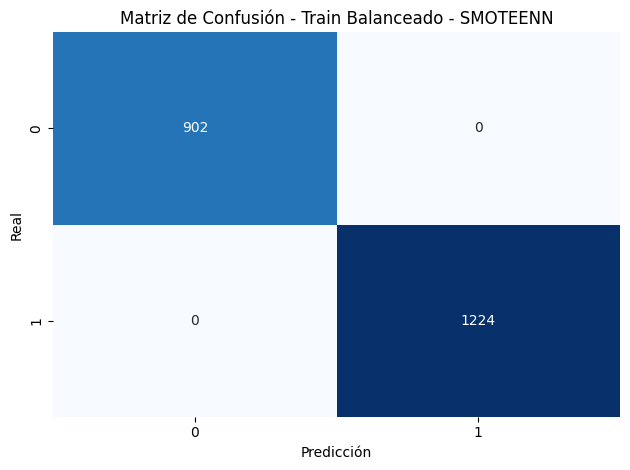


📋 FLAML - SMOTEENN - Test Balanceado
              precision    recall  f1-score   support

         0.0       0.92      0.88      0.90       226
         1.0       0.92      0.94      0.93       305

    accuracy                           0.92       531
   macro avg       0.92      0.91      0.91       531
weighted avg       0.92      0.92      0.92       531



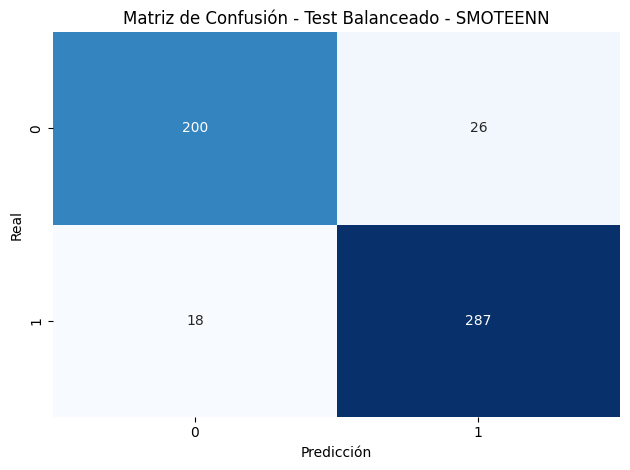


📈 Curvas de Aprendizaje: FLAML - SMOTEENN


C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\joblib\externals\loky\process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py:547: FitFailedWarning: 
5 fits failed out of a total of 25.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, 

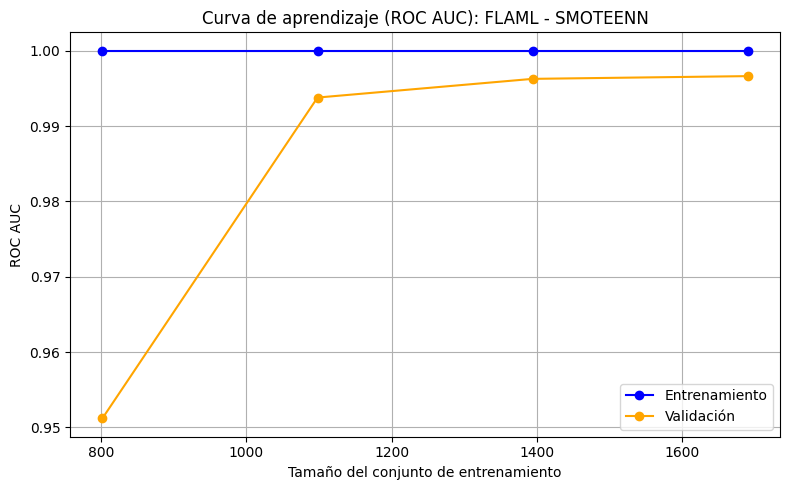

C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py:547: FitFailedWarning: 
5 fits failed out of a total of 25.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Pedro López\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py", line 1474, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\Pedro López\AppData\Roaming\P

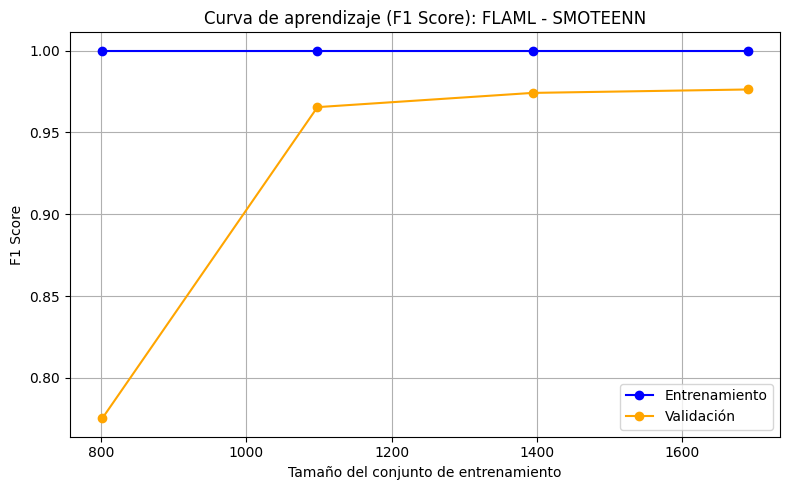


🔄 Evaluando con técnica de balanceo: ADASYN

🏆 Mejor modelo con ADASYN: rf
Hiperparámetros óptimos: {'n_estimators': 549, 'max_features': 0.20051533478633063, 'max_leaves': 410, 'criterion': 'gini'}

📋 FLAML - ADASYN - Train Balanceado
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1224
         1.0       1.00      1.00      1.00      1248

    accuracy                           1.00      2472
   macro avg       1.00      1.00      1.00      2472
weighted avg       1.00      1.00      1.00      2472



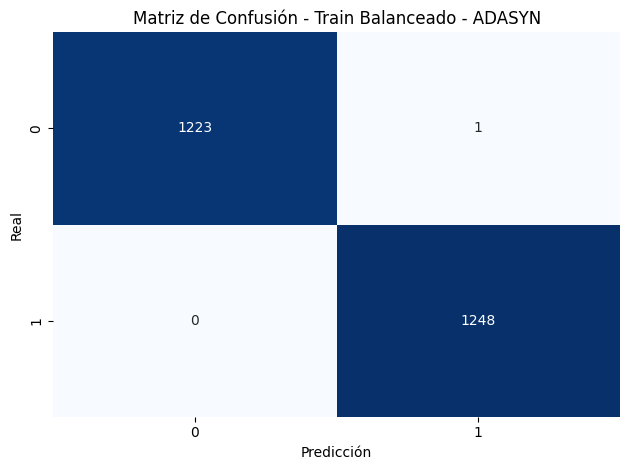


📋 FLAML - ADASYN - Test Balanceado
              precision    recall  f1-score   support

         0.0       0.96      0.75      0.84       306
         1.0       0.79      0.97      0.87       302

    accuracy                           0.86       608
   macro avg       0.88      0.86      0.86       608
weighted avg       0.88      0.86      0.86       608



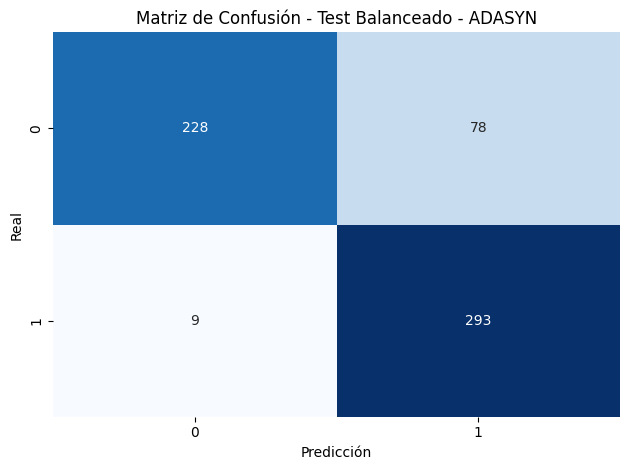


📈 Curvas de Aprendizaje: FLAML - ADASYN


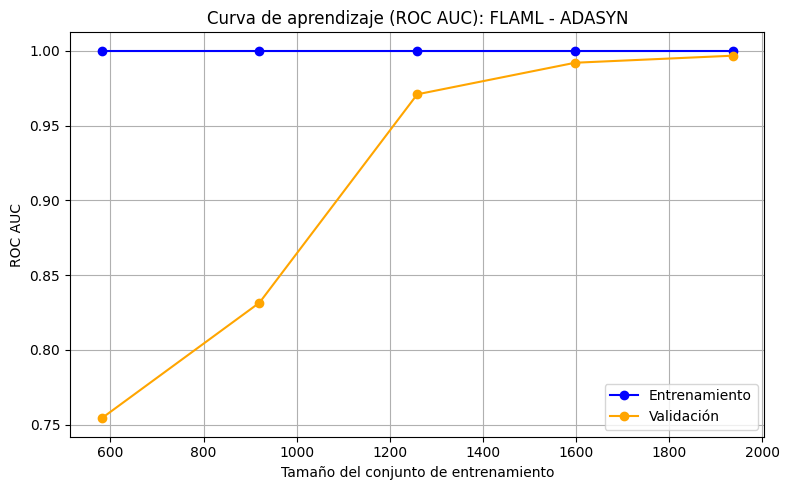

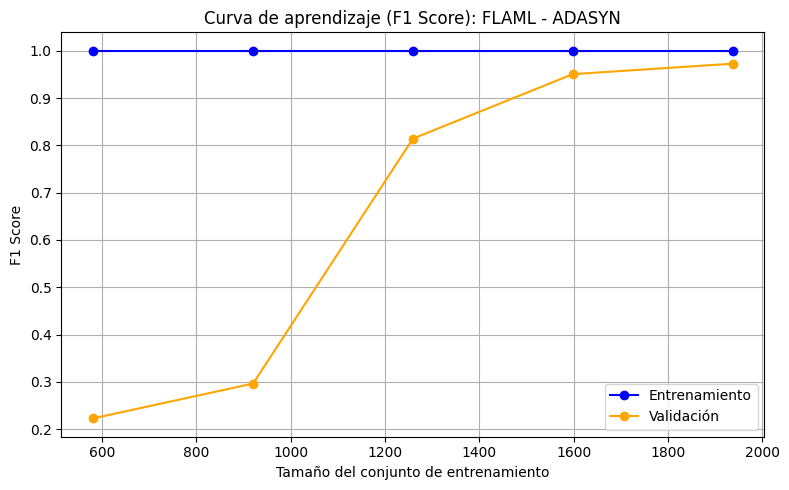


🔄 Evaluando con técnica de balanceo: BorderlineSMOTE

🏆 Mejor modelo con BorderlineSMOTE: extra_tree
Hiperparámetros óptimos: {'n_estimators': 355, 'max_features': 0.2743378973143104, 'max_leaves': 334, 'criterion': 'gini'}

📋 FLAML - BorderlineSMOTE - Train Balanceado
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1224
         1.0       1.00      1.00      1.00      1224

    accuracy                           1.00      2448
   macro avg       1.00      1.00      1.00      2448
weighted avg       1.00      1.00      1.00      2448



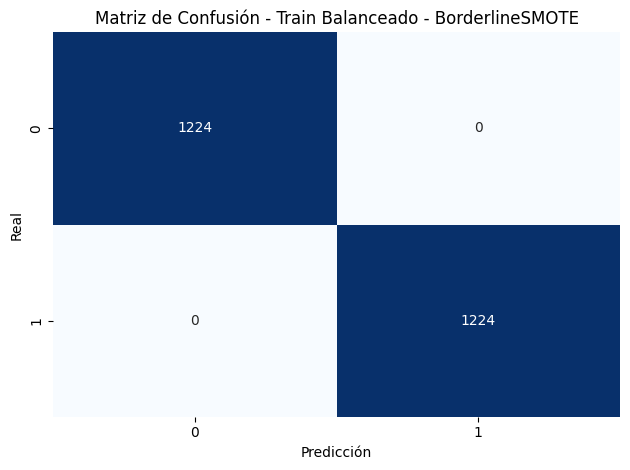


📋 FLAML - BorderlineSMOTE - Test Balanceado
              precision    recall  f1-score   support

         0.0       0.90      0.92      0.91       306
         1.0       0.92      0.90      0.91       306

    accuracy                           0.91       612
   macro avg       0.91      0.91      0.91       612
weighted avg       0.91      0.91      0.91       612



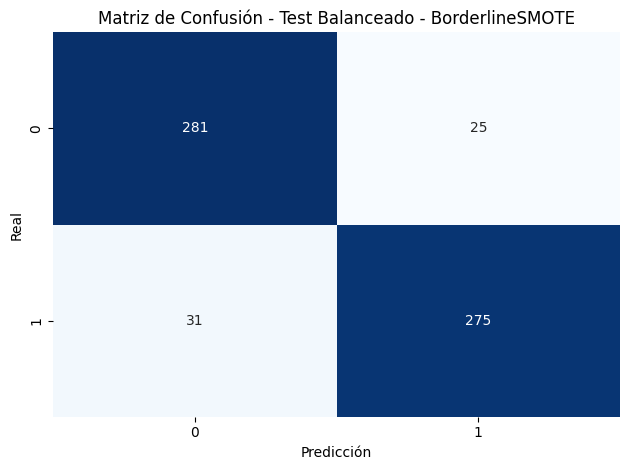


📈 Curvas de Aprendizaje: FLAML - BorderlineSMOTE


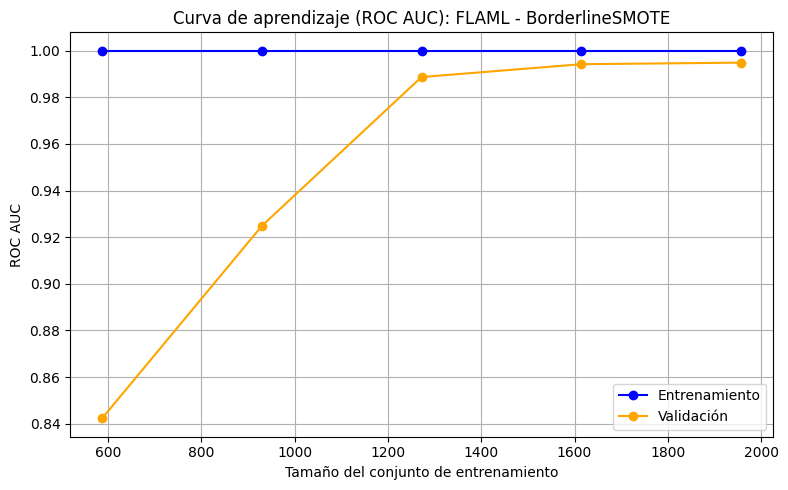

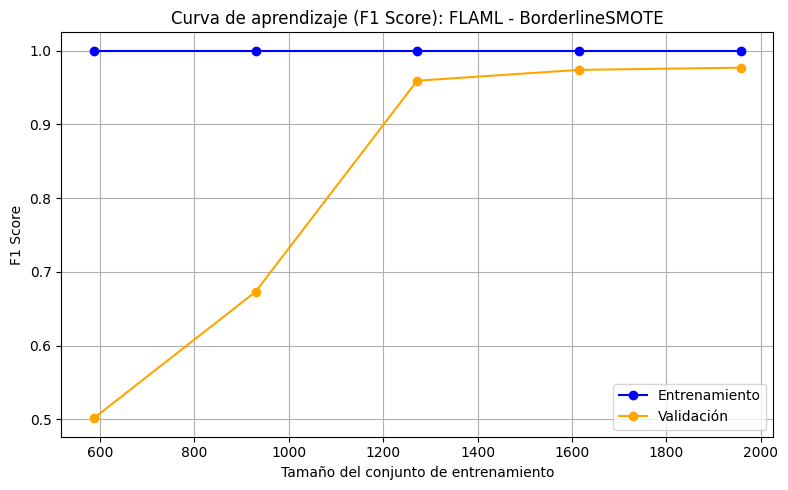

In [102]:
from flaml import AutoML
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE, ADASYN, BorderlineSMOTE
from imblearn.combine import SMOTEENN, SMOTETomek  
from sklearn.model_selection import StratifiedKFold, learning_curve, train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt
import numpy as np
import random
import seaborn as sns

# Reproducibilidad
random.seed(42)
np.random.seed(42)

# Técnicas de balanceo
balancing_strategies = {
    'SMOTEENN': SMOTEENN(random_state=42, smote=SMOTE(k_neighbors=3)),
    'ADASYN': ADASYN(random_state=42),
    'BorderlineSMOTE': BorderlineSMOTE(k_neighbors=3, random_state=42),
}

results_summary = {}

# (Las funciones auxiliares siguen igual: plot_learning_curves_dual, plot_conf_matrix...)

# Split reproducible
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

# Iteración por técnica de balanceo
for strategy_name, balancer in balancing_strategies.items():
    print(f"\n🔄 Evaluando con técnica de balanceo: {strategy_name}")

    # Pipeline para balancear y preprocesar
    balance_pipe = ImbPipeline(steps=[
        ('preprocessing', preprocessor),
        ('balancing', balancer)
    ])

    # Balanceo de entrenamiento
    X_train_bal, y_train_bal = balance_pipe.fit_resample(X_train, y_train)

    # Balanceo de test con el MISMO balanceador
    balance_pipe_test = ImbPipeline(steps=[
        ('preprocessing', preprocessor),
        ('balancing', balancer)
    ])
    X_test_bal, y_test_bal = balance_pipe_test.fit_resample(X_test, y_test)

    # FLAML AutoML
    automl = AutoML()
    automl_settings = {
        "time_budget": 300,
        "metric": 'f1',
        "task": 'classification',
        "log_file_name": f"automl_{strategy_name}.log",
        "eval_method": "cv",
        "verbose": 0,
        "seed": 42,
        "split_type": "stratified",
        "n_splits": 5,
        "split_ratio": 0.8
    }

    automl.fit(X_train=X_train_bal, y_train=y_train_bal, **automl_settings)

    print(f"\n🏆 Mejor modelo con {strategy_name}: {automl.best_estimator}")
    print("Hiperparámetros óptimos:", automl.best_config)

    # ====================
    # Evaluación en TRAIN BALANCEADO
    # ====================
    y_proba_train = automl.predict_proba(X_train_bal)[:, 1]
    y_pred_train = (y_proba_train >= 0.3).astype(int)

    print(f"\n📋 FLAML - {strategy_name} - Train Balanceado")
    print(classification_report(y_train_bal, y_pred_train))
    plot_conf_matrix(y_train_bal, y_pred_train, model_name=f"Train Balanceado - {strategy_name}")

    # ====================
    # Evaluación en TEST BALANCEADO
    # ====================
    y_proba_test = automl.predict_proba(X_test_bal)[:, 1]
    y_pred_test = (y_proba_test >= 0.3).astype(int)

    print(f"\n📋 FLAML - {strategy_name} - Test Balanceado")
    print(classification_report(y_test_bal, y_pred_test))
    plot_conf_matrix(y_test_bal, y_pred_test, model_name=f"Test Balanceado - {strategy_name}")

    # ====================
    # Curvas de aprendizaje (sobre datos preprocesados y balanceados)
    # ====================
    print(f"\n📈 Curvas de Aprendizaje: FLAML - {strategy_name}")

    X_train_enc = preprocessor.transform(X_train)
    X_train_bal_enc, y_train_bal_enc = balancer.fit_resample(X_train_enc, y_train)

    plot_learning_curves_dual(make_pipeline(automl.model), X_train_bal_enc, y_train_bal_enc, title=f"FLAML - {strategy_name}")






## Explicabilidad del modelo


🔍 XGBoost (evaluado en test balanceado):
              precision    recall  f1-score   support

         0.0       0.94      0.87      0.90       306
         1.0       0.88      0.95      0.91       306

    accuracy                           0.91       612
   macro avg       0.91      0.91      0.91       612
weighted avg       0.91      0.91      0.91       612



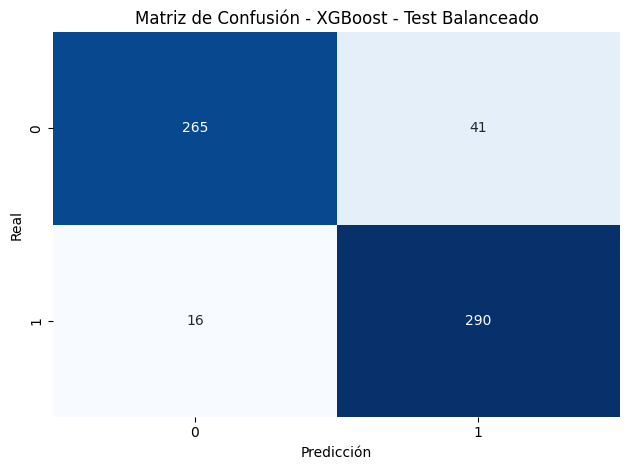

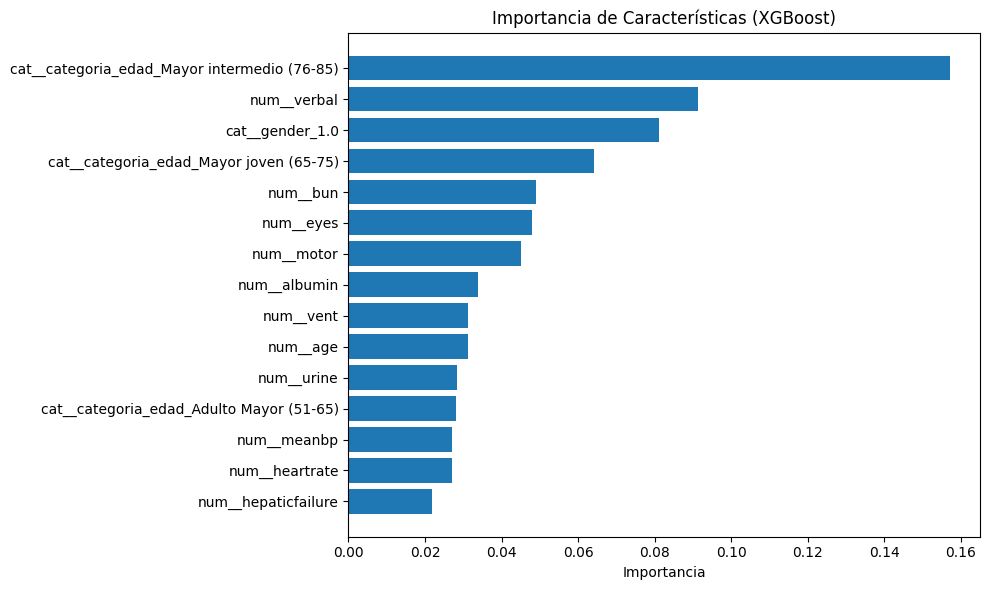

C:\Users\Pedro López\AppData\Local\Temp\ipykernel_8008\3444090599.py:83: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, features=X_test_resampled, feature_names=feature_names)


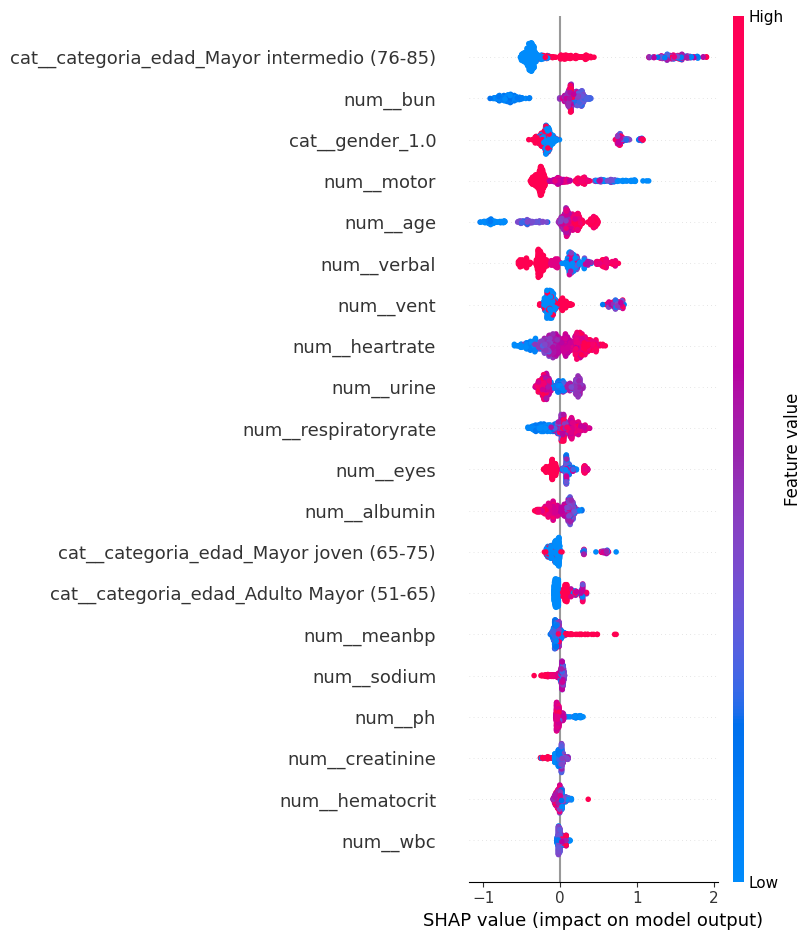

In [103]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import shap
from lime.lime_tabular import LimeTabularExplainer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score, train_test_split
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.combine import SMOTETomek
import xgboost as xgb
import seaborn as sns
from sklearn.metrics import confusion_matrix

# === 1. Preprocesamiento ===
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical),
        ('cat', OneHotEncoder(drop='first'), categorical)
    ]
)

# === 2. Split de datos ===
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=seed)

# === 3. Preprocesamiento ===
X_train_proc = preprocessor.fit_transform(X_train)
X_test_proc = preprocessor.transform(X_test)

# === 4. Balanceo con SMOTETomek ===
smote_tomek = SMOTETomek(random_state=seed)
X_train_resampled, y_train_resampled = smote_tomek.fit_resample(X_train_proc, y_train)
X_test_resampled, y_test_resampled = smote_tomek.fit_resample(X_test_proc, y_test)

# === 5. Entrenamiento del modelo ===
xgb_model = xgb.XGBClassifier(
    eval_metric='logloss',
    learning_rate = 0.05,
    max_depth = 3, 
    n_estimators = 100,
    random_state=seed
)
xgb_model.fit(X_train_resampled, y_train_resampled)

# === 6. Evaluación en test balanceado ===
y_proba_bal = xgb_model.predict_proba(X_test_resampled)[:, 1]
y_pred_bal = (y_proba_bal >= 0.3).astype(int)

print("\n🔍 XGBoost (evaluado en test balanceado):")
print(classification_report(y_test_resampled, y_pred_bal))

def plot_conf_matrix(y_true, y_pred, model_name=""):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(f'Matriz de Confusión - {model_name}')
    plt.xlabel('Predicción')
    plt.ylabel('Real')
    plt.tight_layout()
    plt.show()

plot_conf_matrix(y_test_resampled, y_pred_bal, model_name="XGBoost - Test Balanceado")

# === 7. Importancia de características ===
feature_names = preprocessor.get_feature_names_out()
importances = xgb_model.feature_importances_
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'].head(15), importance_df['Importance'].head(15))
plt.gca().invert_yaxis()
plt.title('Importancia de Características (XGBoost)')
plt.xlabel('Importancia')
plt.tight_layout()
plt.show()

# === 8. Interpretabilidad con SHAP ===
explainer_shap = shap.Explainer(xgb_model, X_train_resampled, feature_names=feature_names)
shap_values = explainer_shap(X_test_resampled)

shap.summary_plot(shap_values, features=X_test_resampled, feature_names=feature_names)

i = 0  # índice del ejemplo a interpretar
shap.initjs()
shap.force_plot(
    base_value=shap_values.base_values[i],
    shap_values=shap_values.values[i],
    features=X_test_resampled[i],
    feature_names=feature_names
)

# === 9. Interpretabilidad con LIME ===
explainer_lime = LimeTabularExplainer(
    training_data=np.array(X_train_resampled),
    feature_names=feature_names,
    class_names=['No', 'Sí'],
    mode='classification'
)

exp = explainer_lime.explain_instance(
    data_row=X_test_resampled[i],
    predict_fn=xgb_model.predict_proba,
    num_features=10
)

exp.show_in_notebook(show_table=True)




## Comparación con las métricas actuales

✅ Fold 1 completado
✅ Fold 2 completado
✅ Fold 3 completado
✅ Fold 4 completado
✅ Fold 5 completado

🔎 Resultados Promedio (5-Fold CV):

AUC - Modelo:   0.812 ± 0.039
AUC - SAPS II:  0.775 ± 0.050
AUC - SOFA:     0.685 ± 0.076
AUC - APACHE:   0.840 ± 0.038

Brier - Modelo:   0.087 ± 0.003
Brier - SAPS II:  0.073 ± 0.001
Brier - SOFA:     0.092 ± 0.006
Brier - APACHE:   0.060 ± 0.007


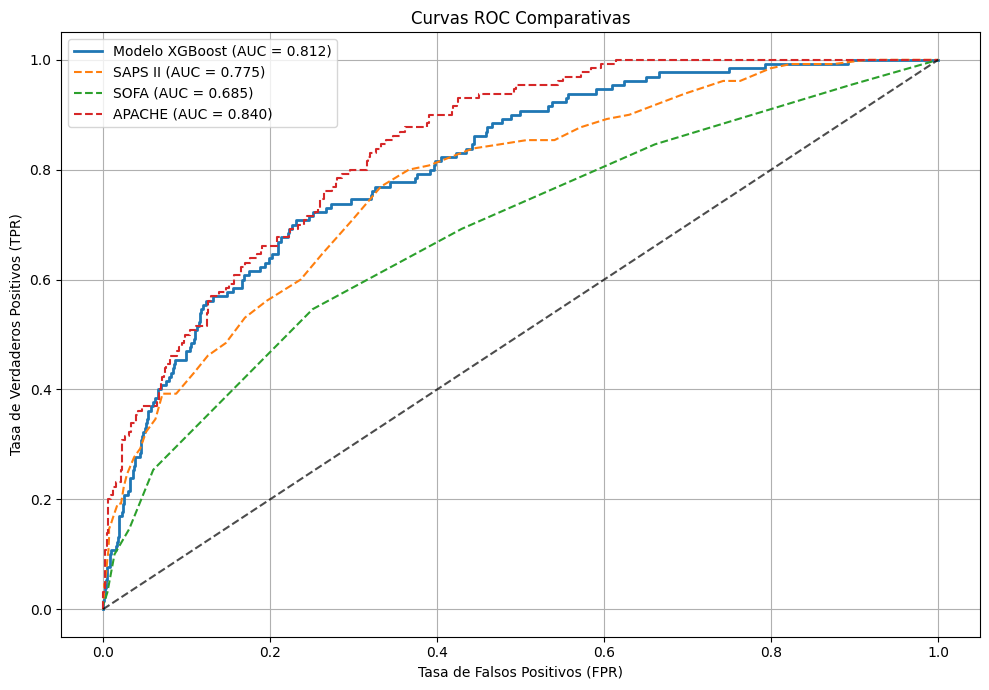

In [104]:
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import roc_auc_score, brier_score_loss, roc_curve
from imblearn.combine import SMOTETomek
import xgboost as xgb
import matplotlib.pyplot as plt

# ========= 1. Variables =========
features = [
    'intubated', 'vent', 'dialysis', 'eyes', 'motor', 'verbal', 'meds', 'urine', 'wbc', 'temperature',
    'respiratoryrate', 'sodium', 'heartrate', 'meanbp', 'ph', 'hematocrit', 'creatinine', 'albumin', 'pao2',
    'pco2', 'bun', 'glucose', 'bilirubin', 'fio2', 'gender', 'age', 'hepaticfailure', 'lymphoma',
    'metastaticcancer', 'leukemia', 'immunosuppression', 'cirrhosis', 'categoria_edad'
]

X = df_final[features]
y = df_final['diedinhospital']

categorical = ['gender', 'categoria_edad']
numerical = list(set(features) - set(categorical))

# ========= 2. Preprocesamiento =========
preprocessor = ColumnTransformer([
    ('num', StandardScaler(), numerical),
    ('cat', OneHotEncoder(drop='first'), categorical)
])

smote_tomek = SMOTETomek(random_state=42)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ========= 3. Métricas =========
auc_scores = []
brier_scores = []
auc_saps2_list = []
auc_sofa_list = []
auc_apache_list = []
brier_saps2_list = []
brier_sofa_list = []
brier_apache_list = []

# Para curvas ROC
all_y_true = []
all_y_pred_proba = []
all_saps2_probs = []
all_sofa_probs = []
all_apache_probs = []

for fold, (train_idx, test_idx) in enumerate(cv.split(X, y), 1):
    X_train_fold, X_test_fold = X.iloc[train_idx], X.iloc[test_idx]
    y_train_fold, y_test_fold = y.iloc[train_idx], y.iloc[test_idx]

    X_train_proc = preprocessor.fit_transform(X_train_fold)
    X_test_proc = preprocessor.transform(X_test_fold)

    X_resampled, y_resampled = smote_tomek.fit_resample(X_train_proc, y_train_fold)

    model = xgb.XGBClassifier(
    eval_metric='logloss',
    learning_rate = 0.05,
    max_depth = 3, 
    n_estimators = 100,
    random_state=seed
    )
    model.fit(X_resampled, y_resampled)

    y_pred_proba = model.predict_proba(X_test_proc)[:, 1]
    saps2_probs = df_final.iloc[test_idx]['saps2_probabilidad']
    sofa_probs = df_final.iloc[test_idx]['sofa_probabilidad']
    apache_probs = df_final.iloc[test_idx]['predictedicumortality']

    auc_scores.append(roc_auc_score(y_test_fold, y_pred_proba))
    brier_scores.append(brier_score_loss(y_test_fold, y_pred_proba))

    auc_saps2_list.append(roc_auc_score(y_test_fold, saps2_probs))
    auc_sofa_list.append(roc_auc_score(y_test_fold, sofa_probs))
    auc_apache_list.append(roc_auc_score(y_test_fold, apache_probs))

    brier_saps2_list.append(brier_score_loss(y_test_fold, saps2_probs))
    brier_sofa_list.append(brier_score_loss(y_test_fold, sofa_probs))
    brier_apache_list.append(brier_score_loss(y_test_fold, apache_probs))

    # Acumular para ROC global
    all_y_true.extend(y_test_fold)
    all_y_pred_proba.extend(y_pred_proba)
    all_saps2_probs.extend(saps2_probs)
    all_sofa_probs.extend(sofa_probs)
    all_apache_probs.extend(apache_probs)

    print(f"✅ Fold {fold} completado")

# ========= 4. Resultados Promedio =========
print("\n🔎 Resultados Promedio (5-Fold CV):\n")
print(f"AUC - Modelo:   {np.mean(auc_scores):.3f} ± {np.std(auc_scores):.3f}")
print(f"AUC - SAPS II:  {np.mean(auc_saps2_list):.3f} ± {np.std(auc_saps2_list):.3f}")
print(f"AUC - SOFA:     {np.mean(auc_sofa_list):.3f} ± {np.std(auc_sofa_list):.3f}")
print(f"AUC - APACHE:   {np.mean(auc_apache_list):.3f} ± {np.std(auc_apache_list):.3f}")

print()
print(f"Brier - Modelo:   {np.mean(brier_scores):.3f} ± {np.std(brier_scores):.3f}")
print(f"Brier - SAPS II:  {np.mean(brier_saps2_list):.3f} ± {np.std(brier_saps2_list):.3f}")
print(f"Brier - SOFA:     {np.mean(brier_sofa_list):.3f} ± {np.std(brier_sofa_list):.3f}")
print(f"Brier - APACHE:   {np.mean(brier_apache_list):.3f} ± {np.std(brier_apache_list):.3f}")

# ========= 5. Curvas ROC =========
fpr_model, tpr_model, _ = roc_curve(all_y_true, all_y_pred_proba)
fpr_saps2, tpr_saps2, _ = roc_curve(all_y_true, all_saps2_probs)
fpr_sofa, tpr_sofa, _ = roc_curve(all_y_true, all_sofa_probs)
fpr_apache, tpr_apache, _ = roc_curve(all_y_true, all_apache_probs)

plt.figure(figsize=(10, 7))
plt.plot(fpr_model, tpr_model, label=f'Modelo XGBoost (AUC = {np.mean(auc_scores):.3f})', linewidth=2)
plt.plot(fpr_saps2, tpr_saps2, label=f'SAPS II (AUC = {np.mean(auc_saps2_list):.3f})', linestyle='--')
plt.plot(fpr_sofa, tpr_sofa, label=f'SOFA (AUC = {np.mean(auc_sofa_list):.3f})', linestyle='--')
plt.plot(fpr_apache, tpr_apache, label=f'APACHE (AUC = {np.mean(auc_apache_list):.3f})', linestyle='--')
plt.plot([0, 1], [0, 1], 'k--', alpha=0.7)

plt.title('Curvas ROC Comparativas')
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()




 ## Ampliación del dataset final con las nuevas variables

In [105]:
df_alergias = pd.read_csv("data/alergias.csv")
df_diagnosticos = pd.read_csv("data/diagnosticos.csv")
df_historial_paciente = pd.read_csv("data/historial_pacientes.csv")
df_medicamentos = pd.read_csv("data/medicamentos_de_ingreso.csv")



In [106]:
df_final_ampliado = df_unido_cambios_valores.copy()

In [107]:
df_final_ampliado_alergias = df_final_ampliado.merge(df_alergias, on='patientunitstayid', how='left')
df_final_ampliado_alergias.head(10)

,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore,apachescore,predictedicumortality,gender,age,diedinhospital,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,categoria_edad,sofa_score_modificado,saps2_score_modificado,saps2_probabilidad,sofa_probabilidad,Medicamento_Alergias,Medicamento_Antiinflamatorio,Medicamento_Cardiovascular,Medicamento_Endocrino,Medicamento_Gastrointestinal,Medicamento_Infeccioso,Medicamento_Neurológico,Medicamento_Nutricional,Medicamento_Oncológico,Medicamento_Renal,Medicamento_Respiratorio,Medicamento_Urológico,Otros Medicamentos
0,8893,143870,0,0,0,4.0,6.0,5.0,0.0,1635.279454,11.700000,36.4,60.0,133.000000,40.0,47.0,7.385113,34.100000,1.140000,2.974699,119.603774,40.566038,14.000000,140.00000,0.998667,58.867925,43.0,60.0,0.015707,0.0,76.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mayor intermedio (76-85),5,48.0,0.014407,0.095349,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,203242,145427,0,0,0,4.0,6.0,5.0,0.0,1979.625997,21.100000,36.2,41.0,141.000000,49.0,72.0,7.374362,40.400000,1.050000,3.018103,137.858621,43.118966,14.000000,118.00000,1.158163,58.379310,26.0,37.0,0.009514,0.0,61.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65),4,34.0,0.005182,0.062973,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2143574,148611,0,0,0,4.0,6.0,5.0,0.0,2435.257504,7.300000,36.2,45.0,142.000000,105.0,108.0,7.395923,47.500000,0.820000,3.224000,136.361538,38.192308,7.000000,112.00000,0.741304,60.846154,16.0,16.0,0.001274,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Joven (18-35),4,17.0,0.001486,0.062973,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,92929,151867,0,0,0,4.0,6.0,5.0,0.0,2208.741333,12.800000,37.1,34.0,136.000000,100.0,102.0,7.350955,40.200000,1.070000,2.918333,112.390909,41.440909,10.000000,113.00000,2.542593,50.545455,14.0,14.0,0.002713,0.0,44.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Medio (36-50),6,30.0,0.003864,0.141851,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,128205,153972,0,0,0,4.0,6.0,5.0,0.0,1979.625997,8.100000,36.3,10.0,138.000000,90.0,71.0,7.374362,26.100000,0.930000,3.018103,137.858621,43.118966,20.000000,109.00000,1.158163,58.379310,24.0,35.0,0.009329,0.0,63.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65),4,29.0,0.003591,0.062973,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,2382037,156308,0,1,0,4.0,6.0,5.0,0.0,2487.446400,6.100000,35.8,45.0,147.000000,98.0,61.0,7.355500,27.000000,1.300000,2.300000,95.933333,40.700000,36.000000,446.00000,0.300000,59.166667,41.0,75.0,0.093746,0.0,87.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,Mayor avanzado (86+),6,53.0,0.020694,0.141851,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,1767315,157427,0,0,0,4.0,6.0,5.0,0.0,1672.244963,11.063699,36.2,17.0,138.000000,108.0,52.0,7.360536,32.600446,1.320000,2.895146,128.183929,41.667857,18.000000,76.00000,1.295876,57.767857,18.0,34.0,0.008058,0.0,73.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mayor joven (65-75),7,45.0,0.011583,0.205870,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,1776370,158056,0,0,0,4.0,6.0,5.0,0.0,2208.741333,17.700000,36.3,24.0,136.455357,104.0,55.0,7.350955,39.500000,1.955446,2.918333,112.390909,41.440909,24.750000,173.87395,2.542593,50.545455,19.0,19.0,0.005533,0.0,39.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Medio (36-50),9,30.0,0.003864,0.389361,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,154804,160762,0,0,0,4.0,6.0,5.0,0.0,1672.244963,10.800000,36.4,16.0,137.804348,88.0,71.0,7.360536,32.500000,1.700000,2.895146,128.183929,41.667857,30.795614,160.00000,1.295876,57.767857,13.0,29.0,0.001187,0.0,71.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mayor joven (65-75),6,36.0,0.006000,0.141851,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,9272,162502,0,0,0,4.0,6.0,5.0,0.0,1635.279454,12.200000,36.1,45.0,140.000000,109.0,59.0,7.450000,37.8

In [108]:
df_final_ampliado_diagnosticos = df_final_ampliado_alergias.merge(df_diagnosticos, on='patientunitstayid', how='left')
df_final_ampliado_diagnosticos.head(10)


,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore,apachescore,predictedicumortality,gender,age,diedinhospital,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,categoria_edad,sofa_score_modificado,saps2_score_modificado,saps2_probabilidad,sofa_probabilidad,Medicamento_Alergias,Medicamento_Antiinflamatorio,Medicamento_Cardiovascular,Medicamento_Endocrino,Medicamento_Gastrointestinal,Medicamento_Infeccioso,Medicamento_Neurológico,Medicamento_Nutricional,Medicamento_Oncológico,Medicamento_Renal,Medicamento_Respiratorio,Medicamento_Urológico,Otros Medicamentos,Enfermedad_Cardiovascular,Enfermedad_Respiratoria,Enfermedad_Renal,Enfermedad_Neurológica,Enfermedad_Endocrinas_y_Metabólica,Enfermedad_Infecciosa,Enfermedad_Gastrointestinal,Enfermedad_Hematológica,Trauma_Quemaduras,Enfermedad_Ocológica,Toxicología_y_Farmacología,Medicina General_Cirugía_Transplantes
0,8893,143870,0,0,0,4.0,6.0,5.0,0.0,1635.279454,11.700000,36.4,60.0,133.000000,40.0,47.0,7.385113,34.100000,1.140000,2.974699,119.603774,40.566038,14.000000,140.00000,0.998667,58.867925,43.0,60.0,0.015707,0.0,76.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mayor intermedio (76-85),5,48.0,0.014407,0.095349,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,203242,145427,0,0,0,4.0,6.0,5.0,0.0,1979.625997,21.100000,36.2,41.0,141.000000,49.0,72.0,7.374362,40.400000,1.050000,3.018103,137.858621,43.118966,14.000000,118.00000,1.158163,58.379310,26.0,37.0,0.009514,0.0,61.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65),4,34.0,0.005182,0.062973,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2,2143574,148611,0,0,0,4.0,6.0,5.0,0.0,2435.257504,7.300000,36.2,45.0,142.000000,105.0,108.0,7.395923,47.500000,0.820000,3.224000,136.361538,38.192308,7.000000,112.00000,0.741304,60.846154,16.0,16.0,0.001274,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Joven (18-35),4,17.0,0.001486,0.062973,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,92929,151867,0,0,0,4.0,6.0,5.0,0.0,2208.741333,12.800000,37.1,34.0,136.000000,100.0,102.0,7.350955,40.200000,1.070000,2.918333,112.390909,41.440909,10.000000,113.00000,2.542593,50.545455,14.0,14.0,0.002713,0.0,44.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Medio (36-50),6,30.0,0.003864,0.141851,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,128205,153972,0,0,0,4.0,6.0,5.0,0.0,1979.625997,8.100000,36.3,10.0,138.000000,90.0,71.0,7.374362,26.100000,0.930000,3.018103,137.858621,43.118966,20.000000,109.00000,1.158163,58.379310,24.0,35.0,0.009329,0.0,63.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65),4,29.0,0.003591,0.062973,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
5,2382037,156308,0,1,0,4.0,6.0,5.0,0.0,2487.446400,6.100000,35.8,45.0,147.000000,98.0,61.0,7.355500,27.000000,1.300000,2.300000,95.933333,40.700000,36.000000,446.00000,0.300000,59.166667,41.0,75.0,0.093746,0.0,87.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,Mayor avanzado (86+),6,53.0,0.020694,0.141851,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
6,1767315,157427,0,0,0,4.0,6.0,5.0,0.0,1672.244963,11.063699,36.2,17.0,138.000000,108.0,52.0,7.360536,32.600446,1.320000,2.895146,128.183929,41.667857,18.000000,76.00000,1.295876,57.767857,18.0,34.0,0.008058,0.0,73.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mayor joven (65-75),7,45.0,0.011583,0.205870,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,1776370,158056,0,0,0,4.0,6.0,5.0,0.0,2208.741333,17.700000,36.3,24.0,136.455357,104.0,55.0,7.350955,39.500000,1.955446,2.918333,112.390909,41.440909,24.750

In [109]:
df_final_ampliado_paciente = df_final_ampliado_diagnosticos.merge(df_historial_paciente, on='patientunitstayid', how='left')
df_final_ampliado_paciente.head(10)

,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore,apachescore,predictedicumortality,gender,age,diedinhospital,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,categoria_edad,sofa_score_modificado,saps2_score_modificado,saps2_probabilidad,sofa_probabilidad,Medicamento_Alergias,Medicamento_Antiinflamatorio,Medicamento_Cardiovascular,Medicamento_Endocrino,Medicamento_Gastrointestinal,Medicamento_Infeccioso,Medicamento_Neurológico,Medicamento_Nutricional,Medicamento_Oncológico,Medicamento_Renal,Medicamento_Respiratorio,Medicamento_Urológico,Otros Medicamentos,Enfermedad_Cardiovascular,Enfermedad_Respiratoria,Enfermedad_Renal,Enfermedad_Neurológica,Enfermedad_Endocrinas_y_Metabólica,Enfermedad_Infecciosa,Enfermedad_Gastrointestinal,Enfermedad_Hematológica,Trauma_Quemaduras,Enfermedad_Ocológica,Toxicología_y_Farmacología,Medicina General_Cirugía_Transplantes,Historial_no_disponible,No_tuvo_problemas,Tuvo_problemas_Cardivaculares,Tuvo_problemas_Endocrinos,Tuvo_problemas_Gastrointestinales,Tuvo_problemas_Hematologicos,Tuvo_problemas_Neurologicos,Tuvo_problemas_Renales,Tuvo_problemas_Respiratorios,Tuvo_problemas_Reumatologicos,tuvo_problemas_Infecciosos
0,8893,143870,0,0,0,4.0,6.0,5.0,0.0,1635.279454,11.700000,36.4,60.0,133.000000,40.0,47.0,7.385113,34.100000,1.140000,2.974699,119.603774,40.566038,14.000000,140.00000,0.998667,58.867925,43.0,60.0,0.015707,0.0,76.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mayor intermedio (76-85),5,48.0,0.014407,0.095349,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,203242,145427,0,0,0,4.0,6.0,5.0,0.0,1979.625997,21.100000,36.2,41.0,141.000000,49.0,72.0,7.374362,40.400000,1.050000,3.018103,137.858621,43.118966,14.000000,118.00000,1.158163,58.379310,26.0,37.0,0.009514,0.0,61.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65),4,34.0,0.005182,0.062973,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2143574,148611,0,0,0,4.0,6.0,5.0,0.0,2435.257504,7.300000,36.2,45.0,142.000000,105.0,108.0,7.395923,47.500000,0.820000,3.224000,136.361538,38.192308,7.000000,112.00000,0.741304,60.846154,16.0,16.0,0.001274,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Joven (18-35),4,17.0,0.001486,0.062973,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,92929,151867,0,0,0,4.0,6.0,5.0,0.0,2208.741333,12.800000,37.1,34.0,136.000000,100.0,102.0,7.350955,40.200000,1.070000,2.918333,112.390909,41.440909,10.000000,113.00000,2.542593,50.545455,14.0,14.0,0.002713,0.0,44.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Medio (36-50),6,30.0,0.003864,0.141851,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,128205,153972,0,0,0,4.0,6.0,5.0,0.0,1979.625997,8.100000,36.3,10.0,138.000000,90.0,71.0,7.374362,26.100000,0.930000,3.018103,137.858621,43.118966,20.000000,109.00000,1.158163,58.379310,24.0,35.0,0.009329,0.0,63.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65),4,29.0,0.003591,0.062973,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,2382037,156308,0,1,0,4.0,6.0,5.0,0.0,2487.446400,6.100000,35.8,45.0,147.000000,98.0,61.0,7.355500,27.000000,1.300000,2.300000,95.933333,40.700000,36.000000,446.00000,0.300000,59.166667,41.0,75.0,0.093746,0.0,87.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,Mayor avanzado (86+),6,53.0,0.020694,0.141851,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1

In [110]:
df_final_ampliado_medicamentos = df_final_ampliado_paciente.merge(df_medicamentos, on='patientunitstayid', how='left')
df_final_ampliado_medicamentos.head(10)

,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore,apachescore,predictedicumortality,gender,age,diedinhospital,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,categoria_edad,sofa_score_modificado,saps2_score_modificado,saps2_probabilidad,sofa_probabilidad,Medicamento_Alergias_x,Medicamento_Antiinflamatorio_x,Medicamento_Cardiovascular_x,Medicamento_Endocrino_x,Medicamento_Gastrointestinal_x,Medicamento_Infeccioso_x,Medicamento_Neurológico_x,Medicamento_Nutricional_x,Medicamento_Oncológico_x,Medicamento_Renal_x,Medicamento_Respiratorio_x,Medicamento_Urológico_x,Otros Medicamentos_x,Enfermedad_Cardiovascular,Enfermedad_Respiratoria,Enfermedad_Renal,Enfermedad_Neurológica,Enfermedad_Endocrinas_y_Metabólica,Enfermedad_Infecciosa,Enfermedad_Gastrointestinal,Enfermedad_Hematológica,Trauma_Quemaduras,Enfermedad_Ocológica,Toxicología_y_Farmacología,Medicina General_Cirugía_Transplantes,Historial_no_disponible,No_tuvo_problemas,Tuvo_problemas_Cardivaculares,Tuvo_problemas_Endocrinos,Tuvo_problemas_Gastrointestinales,Tuvo_problemas_Hematologicos,Tuvo_problemas_Neurologicos,Tuvo_problemas_Renales,Tuvo_problemas_Respiratorios,Tuvo_problemas_Reumatologicos,tuvo_problemas_Infecciosos,Medicamento_Alergias_y,Medicamento_Antiinflamatorio_y,Medicamento_Cardiovascular_y,Medicamento_Endocrino_y,Medicamento_Gastrointestinal_y,Medicamento_Infeccioso_y,Medicamento_Neurológico_y,Medicamento_Nutricional_y,Medicamento_Oncológico_y,Medicamento_Renal_y,Medicamento_Respiratorio_y,Medicamento_Urológico_y,Otros Medicamentos_y
0,8893,143870,0,0,0,4.0,6.0,5.0,0.0,1635.279454,11.700000,36.4,60.0,133.000000,40.0,47.0,7.385113,34.100000,1.140000,2.974699,119.603774,40.566038,14.000000,140.00000,0.998667,58.867925,43.0,60.0,0.015707,0.0,76.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mayor intermedio (76-85),5,48.0,0.014407,0.095349,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,203242,145427,0,0,0,4.0,6.0,5.0,0.0,1979.625997,21.100000,36.2,41.0,141.000000,49.0,72.0,7.374362,40.400000,1.050000,3.018103,137.858621,43.118966,14.000000,118.00000,1.158163,58.379310,26.0,37.0,0.009514,0.0,61.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65),4,34.0,0.005182,0.062973,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2143574,148611,0,0,0,4.0,6.0,5.0,0.0,2435.257504,7.300000,36.2,45.0,142.000000,105.0,108.0,7.395923,47.500000,0.820000,3.224000,136.361538,38.192308,7.000000,112.00000,0.741304,60.846154,16.0,16.0,0.001274,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Joven (18-35),4,17.0,0.001486,0.062973,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,92929,151867,0,0,0,4.0,6.0,5.0,0.0,2208.741333,12.800000,37.1,34.0,136.000000,100.0,102.0,7.350955,40.200000,1.070000,2.918333,112.390909,41.440909,10.000000,113.00000,2.542593,50.545455,14.0,14.0,0.002713,0.0,44.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Medio (36-50),6,30.0,0.003864,0.141851,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,128205,153972,0,0,0,4.0,6.0,5.0,0.0,1979.625997,8.100000,36.3,10.0,138.000000,90.0,71.0,7.374362,26.100000,0.930000,3.018103,137.858621,43.118966,20.000000,109.00000,1.158163,58.379310,24.0,35.0,0.009329,0.0,63.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65),4,29.0,0.003591,0.062973,NaN,

In [111]:
nuevas_columnas = [
    'Medicamento_Alergias_x', 'Medicamento_Antiinflamatorio_x', 'Medicamento_Cardiovascular_x',
    'Medicamento_Endocrino_x', 'Medicamento_Gastrointestinal_x', 'Medicamento_Infeccioso_x',
    'Medicamento_Neurológico_x', 'Medicamento_Nutricional_x', 'Medicamento_Oncológico_x',
    'Medicamento_Renal_x', 'Medicamento_Respiratorio_x', 'Medicamento_Urológico_x',
    'Otros Medicamentos_x', 'Enfermedad_Cardiovascular', 'Enfermedad_Respiratoria',
    'Enfermedad_Renal', 'Enfermedad_Neurológica', 'Enfermedad_Endocrinas_y_Metabólica',
    'Enfermedad_Infecciosa', 'Enfermedad_Gastrointestinal', 'Enfermedad_Hematológica',
    'Trauma_Quemaduras', 'Enfermedad_Ocológica', 'Toxicología_y_Farmacología',
    'Medicina General_Cirugía_Transplantes',
    'Tuvo_problemas_Cardivaculares', 'Tuvo_problemas_Endocrinos',
    'Tuvo_problemas_Gastrointestinales', 'Tuvo_problemas_Hematologicos',
    'Tuvo_problemas_Neurologicos', 'Tuvo_problemas_Renales', 'Tuvo_problemas_Respiratorios',
    'Tuvo_problemas_Reumatologicos', 'tuvo_problemas_Infecciosos', 'Medicamento_Alergias_y',
    'Medicamento_Antiinflamatorio_y', 'Medicamento_Cardiovascular_y', 'Medicamento_Endocrino_y',
    'Medicamento_Gastrointestinal_y', 'Medicamento_Infeccioso_y', 'Medicamento_Neurológico_y',
    'Medicamento_Nutricional_y', 'Medicamento_Oncológico_y', 'Medicamento_Renal_y',
    'Medicamento_Respiratorio_y', 'Medicamento_Urológico_y', 'Otros Medicamentos_y'
]
nuevas_columnas_2  = ['Historial_no_disponible', 'No_tuvo_problemas']
df_final_ampliado_medicamentos[nuevas_columnas] = df_final_ampliado_medicamentos[nuevas_columnas].fillna(0.0)
df_final_ampliado_medicamentos[nuevas_columnas_2] = df_final_ampliado_medicamentos[nuevas_columnas_2].fillna(1.0)
df_final_ampliado_final = df_final_ampliado_medicamentos.copy()
df_final_ampliado_final.head(10)



,apacheapsvarid,patientunitstayid,intubated,vent,dialysis,eyes,motor,verbal,meds,urine,wbc,temperature,respiratoryrate,sodium,heartrate,meanbp,ph,hematocrit,creatinine,albumin,pao2,pco2,bun,glucose,bilirubin,fio2,acutephysiologyscore,apachescore,predictedicumortality,gender,age,diedinhospital,aids,hepaticfailure,lymphoma,metastaticcancer,leukemia,immunosuppression,cirrhosis,categoria_edad,sofa_score_modificado,saps2_score_modificado,saps2_probabilidad,sofa_probabilidad,Medicamento_Alergias_x,Medicamento_Antiinflamatorio_x,Medicamento_Cardiovascular_x,Medicamento_Endocrino_x,Medicamento_Gastrointestinal_x,Medicamento_Infeccioso_x,Medicamento_Neurológico_x,Medicamento_Nutricional_x,Medicamento_Oncológico_x,Medicamento_Renal_x,Medicamento_Respiratorio_x,Medicamento_Urológico_x,Otros Medicamentos_x,Enfermedad_Cardiovascular,Enfermedad_Respiratoria,Enfermedad_Renal,Enfermedad_Neurológica,Enfermedad_Endocrinas_y_Metabólica,Enfermedad_Infecciosa,Enfermedad_Gastrointestinal,Enfermedad_Hematológica,Trauma_Quemaduras,Enfermedad_Ocológica,Toxicología_y_Farmacología,Medicina General_Cirugía_Transplantes,Historial_no_disponible,No_tuvo_problemas,Tuvo_problemas_Cardivaculares,Tuvo_problemas_Endocrinos,Tuvo_problemas_Gastrointestinales,Tuvo_problemas_Hematologicos,Tuvo_problemas_Neurologicos,Tuvo_problemas_Renales,Tuvo_problemas_Respiratorios,Tuvo_problemas_Reumatologicos,tuvo_problemas_Infecciosos,Medicamento_Alergias_y,Medicamento_Antiinflamatorio_y,Medicamento_Cardiovascular_y,Medicamento_Endocrino_y,Medicamento_Gastrointestinal_y,Medicamento_Infeccioso_y,Medicamento_Neurológico_y,Medicamento_Nutricional_y,Medicamento_Oncológico_y,Medicamento_Renal_y,Medicamento_Respiratorio_y,Medicamento_Urológico_y,Otros Medicamentos_y
0,8893,143870,0,0,0,4.0,6.0,5.0,0.0,1635.279454,11.700000,36.4,60.0,133.000000,40.0,47.0,7.385113,34.100000,1.140000,2.974699,119.603774,40.566038,14.000000,140.00000,0.998667,58.867925,43.0,60.0,0.015707,0.0,76.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Mayor intermedio (76-85),5,48.0,0.014407,0.095349,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,203242,145427,0,0,0,4.0,6.0,5.0,0.0,1979.625997,21.100000,36.2,41.0,141.000000,49.0,72.0,7.374362,40.400000,1.050000,3.018103,137.858621,43.118966,14.000000,118.00000,1.158163,58.379310,26.0,37.0,0.009514,0.0,61.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65),4,34.0,0.005182,0.062973,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2143574,148611,0,0,0,4.0,6.0,5.0,0.0,2435.257504,7.300000,36.2,45.0,142.000000,105.0,108.0,7.395923,47.500000,0.820000,3.224000,136.361538,38.192308,7.000000,112.00000,0.741304,60.846154,16.0,16.0,0.001274,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Joven (18-35),4,17.0,0.001486,0.062973,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,92929,151867,0,0,0,4.0,6.0,5.0,0.0,2208.741333,12.800000,37.1,34.0,136.000000,100.0,102.0,7.350955,40.200000,1.070000,2.918333,112.390909,41.440909,10.000000,113.00000,2.542593,50.545455,14.0,14.0,0.002713,0.0,44.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Medio (36-50),6,30.0,0.003864,0.141851,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,128205,153972,0,0,0,4.0,6.0,5.0,0.0,1979.625997,8.100000,36.3,10.0,138.000000,90.0,71.0,7.374362,26.100000,0.930000,3.018103,137.858621,43.118966,20.000000,109.00000,1.158163,58.379310,24.0,35.0,0.009329,0.0,63.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Adulto Mayor (51-65),4,29.0,0.003591,0.062973,0.0,


🔍 XGBoost (evaluado en test balanceado):
              precision    recall  f1-score   support

         0.0       0.94      0.87      0.90       306
         1.0       0.88      0.94      0.91       306

    accuracy                           0.91       612
   macro avg       0.91      0.91      0.91       612
weighted avg       0.91      0.91      0.91       612



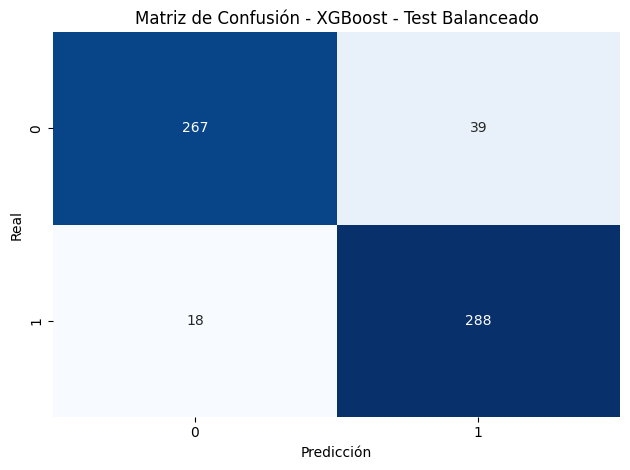

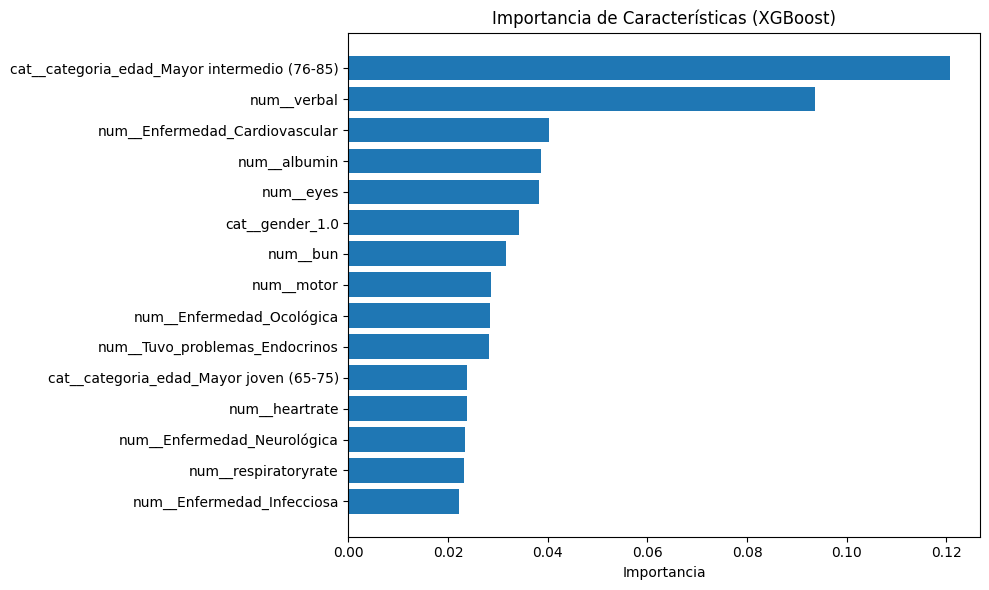

C:\Users\Pedro López\AppData\Local\Temp\ipykernel_8008\784065620.py:117: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, features=X_test_resampled, feature_names=feature_names)


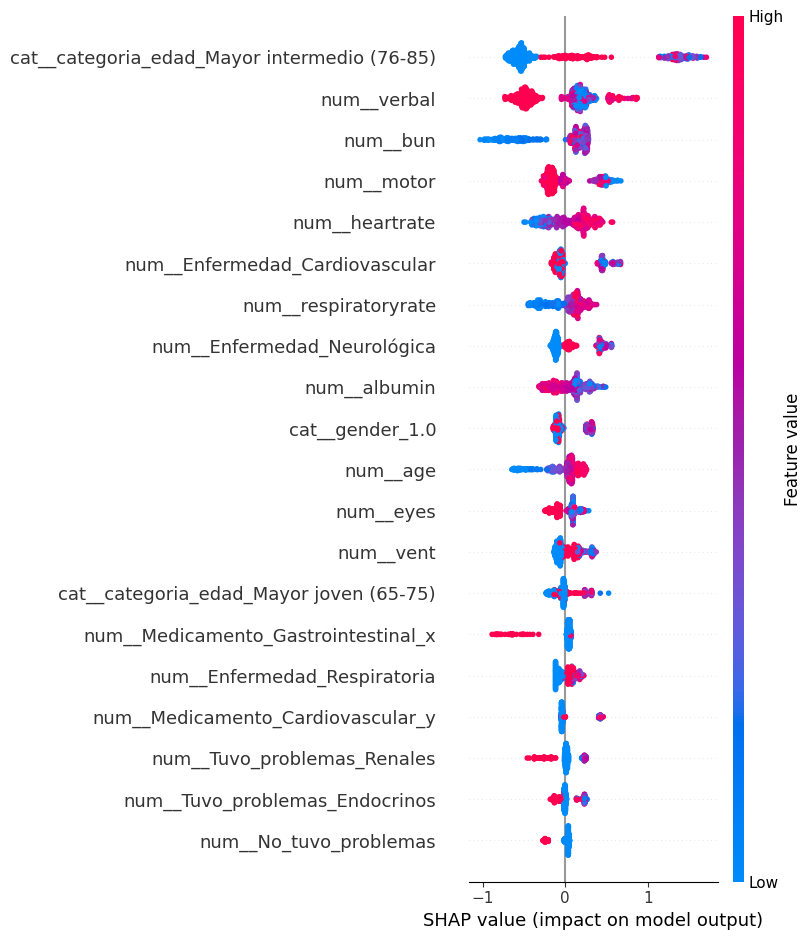

In [112]:
# === Importaciones ===
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import shap
from lime.lime_tabular import LimeTabularExplainer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import cross_val_score, train_test_split
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.combine import SMOTETomek
import xgboost as xgb
import seaborn as sns

# === Configuración ===
seed = 42
np.random.seed(seed)

# === 1. Preprocesamiento ===

features = [
    'intubated', 'vent', 'dialysis', 'eyes', 'motor', 'verbal', 'meds', 'urine', 'wbc', 'temperature',
    'respiratoryrate', 'sodium', 'heartrate', 'meanbp', 'ph', 'hematocrit', 'creatinine', 'albumin', 'pao2',
    'pco2', 'bun', 'glucose', 'bilirubin', 'fio2', 'gender', 'age', 'hepaticfailure', 'lymphoma',
    'metastaticcancer', 'leukemia', 'immunosuppression', 'cirrhosis', 'categoria_edad','Medicamento_Alergias_x', 'Medicamento_Antiinflamatorio_x', 'Medicamento_Cardiovascular_x',
    'Medicamento_Endocrino_x', 'Medicamento_Gastrointestinal_x', 'Medicamento_Infeccioso_x',
    'Medicamento_Neurológico_x', 'Medicamento_Nutricional_x', 'Medicamento_Oncológico_x',
    'Medicamento_Renal_x', 'Medicamento_Respiratorio_x', 'Medicamento_Urológico_x',
    'Otros Medicamentos_x', 'Enfermedad_Cardiovascular', 'Enfermedad_Respiratoria',
    'Enfermedad_Renal', 'Enfermedad_Neurológica', 'Enfermedad_Endocrinas_y_Metabólica',
    'Enfermedad_Infecciosa', 'Enfermedad_Gastrointestinal', 'Enfermedad_Hematológica',
    'Trauma_Quemaduras', 'Enfermedad_Ocológica', 'Toxicología_y_Farmacología',
    'Medicina General_Cirugía_Transplantes',
    'Tuvo_problemas_Cardivaculares', 'Tuvo_problemas_Endocrinos',
    'Tuvo_problemas_Gastrointestinales', 'Tuvo_problemas_Hematologicos',
    'Tuvo_problemas_Neurologicos', 'Tuvo_problemas_Renales', 'Tuvo_problemas_Respiratorios',
    'Tuvo_problemas_Reumatologicos', 'tuvo_problemas_Infecciosos', 'Medicamento_Alergias_y',
    'Medicamento_Antiinflamatorio_y', 'Medicamento_Cardiovascular_y', 'Medicamento_Endocrino_y',
    'Medicamento_Gastrointestinal_y', 'Medicamento_Infeccioso_y', 'Medicamento_Neurológico_y',
    'Medicamento_Nutricional_y', 'Medicamento_Oncológico_y', 'Medicamento_Renal_y',
    'Medicamento_Respiratorio_y', 'Medicamento_Urológico_y', 'Otros Medicamentos_y', 'Historial_no_disponible', 'No_tuvo_problemas'
]

categorical = ['gender', 'categoria_edad']
numerical = list(set(features) - set(categorical))

X_am = df_final_ampliado_final[features]
y_am = df_final_ampliado_final['diedinhospital']

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical),
        ('cat', OneHotEncoder(drop='first'), categorical)
    ]
)

# === 2. Split de datos ===
X_train, X_test, y_train, y_test = train_test_split(X_am, y_am, stratify=y_am, test_size=0.2, random_state=seed)

# === 3. Preprocesamiento ===
X_train_proc = preprocessor.fit_transform(X_train)
X_test_proc = preprocessor.transform(X_test)

# === 4. Balanceo con SMOTETomek ===
smote_tomek = SMOTETomek(random_state=seed)
X_train_resampled, y_train_resampled = smote_tomek.fit_resample(X_train_proc, y_train)
X_test_resampled, y_test_resampled = smote_tomek.fit_resample(X_test_proc, y_test)

# === 5. Entrenamiento del modelo ===
xgb_model = xgb.XGBClassifier(
    eval_metric='logloss',
    learning_rate = 0.05,
    max_depth = 3, 
    n_estimators = 100,
    random_state=seed
)
xgb_model.fit(X_train_resampled, y_train_resampled)

# === 6. Evaluación en test balanceado ===
y_proba_bal = xgb_model.predict_proba(X_test_resampled)[:, 1]
y_pred_bal = (y_proba_bal >= 0.3).astype(int)

print("\n🔍 XGBoost (evaluado en test balanceado):")
print(classification_report(y_test_resampled, y_pred_bal))

def plot_conf_matrix(y_true, y_pred, model_name=""):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(f'Matriz de Confusión - {model_name}')
    plt.xlabel('Predicción')
    plt.ylabel('Real')
    plt.tight_layout()
    plt.show()

plot_conf_matrix(y_test_resampled, y_pred_bal, model_name="XGBoost - Test Balanceado")

# === 7. Importancia de características ===
feature_names = preprocessor.get_feature_names_out()
importances = xgb_model.feature_importances_
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'].head(15), importance_df['Importance'].head(15))
plt.gca().invert_yaxis()
plt.title('Importancia de Características (XGBoost)')
plt.xlabel('Importancia')
plt.tight_layout()
plt.show()

# === 8. Interpretabilidad con SHAP ===
explainer_shap = shap.Explainer(xgb_model, X_train_resampled, feature_names=feature_names)
shap_values = explainer_shap(X_test_resampled)

shap.summary_plot(shap_values, features=X_test_resampled, feature_names=feature_names)

i = 0  # índice del ejemplo a interpretar
shap.initjs()
shap.force_plot(
    base_value=shap_values.base_values[i],
    shap_values=shap_values.values[i],
    features=X_test_resampled[i],
    feature_names=feature_names
)

# === 9. Interpretabilidad con LIME ===
explainer_lime = LimeTabularExplainer(
    training_data=np.array(X_train_resampled),
    feature_names=feature_names,
    class_names=['No', 'Sí'],
    mode='classification'
)

exp = explainer_lime.explain_instance(
    data_row=X_test_resampled[i],
    predict_fn=xgb_model.predict_proba,
    num_features=10
)

exp.show_in_notebook(show_table=True)




✅ Fold 1 completado
✅ Fold 2 completado
✅ Fold 3 completado
✅ Fold 4 completado
✅ Fold 5 completado

🔎 Resultados Promedio (5-Fold CV):

AUC - Modelo:   0.811 ± 0.031
AUC - SAPS II:  0.775 ± 0.050
AUC - SOFA:     0.685 ± 0.076
AUC - APACHE:   0.840 ± 0.038

Brier - Modelo:   0.075 ± 0.002
Brier - SAPS II:  0.073 ± 0.001
Brier - SOFA:     0.092 ± 0.006
Brier - APACHE:   0.060 ± 0.007


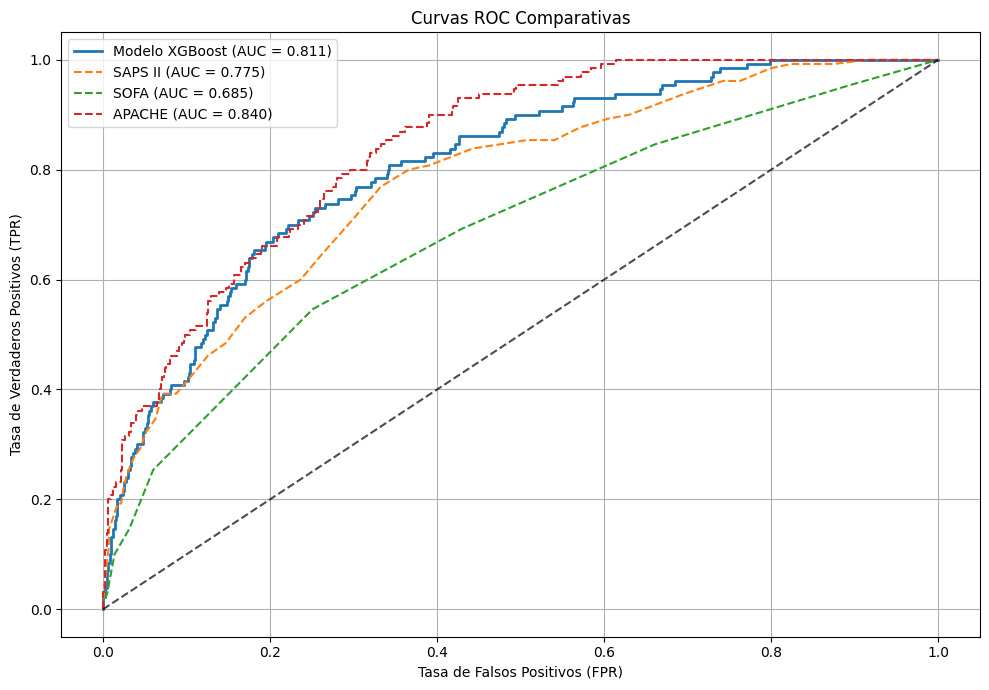

In [113]:
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import roc_auc_score, brier_score_loss, roc_curve
from imblearn.combine import SMOTETomek
import xgboost as xgb
import matplotlib.pyplot as plt

# ========= 1. Variables =========
features = [
    'intubated', 'vent', 'dialysis', 'eyes', 'motor', 'verbal', 'meds', 'urine', 'wbc', 'temperature',
    'respiratoryrate', 'sodium', 'heartrate', 'meanbp', 'ph', 'hematocrit', 'creatinine', 'albumin', 'pao2',
    'pco2', 'bun', 'glucose', 'bilirubin', 'fio2', 'gender', 'age', 'hepaticfailure', 'lymphoma',
    'metastaticcancer', 'leukemia', 'immunosuppression', 'cirrhosis', 'categoria_edad','Medicamento_Alergias_x', 'Medicamento_Antiinflamatorio_x', 'Medicamento_Cardiovascular_x',
    'Medicamento_Endocrino_x', 'Medicamento_Gastrointestinal_x', 'Medicamento_Infeccioso_x',
    'Medicamento_Neurológico_x', 'Medicamento_Nutricional_x', 'Medicamento_Oncológico_x',
    'Medicamento_Renal_x', 'Medicamento_Respiratorio_x', 'Medicamento_Urológico_x',
    'Otros Medicamentos_x', 'Enfermedad_Cardiovascular', 'Enfermedad_Respiratoria',
    'Enfermedad_Renal', 'Enfermedad_Neurológica', 'Enfermedad_Endocrinas_y_Metabólica',
    'Enfermedad_Infecciosa', 'Enfermedad_Gastrointestinal', 'Enfermedad_Hematológica',
    'Trauma_Quemaduras', 'Enfermedad_Ocológica', 'Toxicología_y_Farmacología',
    'Medicina General_Cirugía_Transplantes',
    'Tuvo_problemas_Cardivaculares', 'Tuvo_problemas_Endocrinos',
    'Tuvo_problemas_Gastrointestinales', 'Tuvo_problemas_Hematologicos',
    'Tuvo_problemas_Neurologicos', 'Tuvo_problemas_Renales', 'Tuvo_problemas_Respiratorios',
    'Tuvo_problemas_Reumatologicos', 'tuvo_problemas_Infecciosos', 'Medicamento_Alergias_y',
    'Medicamento_Antiinflamatorio_y', 'Medicamento_Cardiovascular_y', 'Medicamento_Endocrino_y',
    'Medicamento_Gastrointestinal_y', 'Medicamento_Infeccioso_y', 'Medicamento_Neurológico_y',
    'Medicamento_Nutricional_y', 'Medicamento_Oncológico_y', 'Medicamento_Renal_y',
    'Medicamento_Respiratorio_y', 'Medicamento_Urológico_y', 'Otros Medicamentos_y', 'Historial_no_disponible', 'No_tuvo_problemas'
]

X = df_final_ampliado_final[features]
y = df_final_ampliado_final['diedinhospital']

categorical = ['gender', 'categoria_edad']
numerical = list(set(features) - set(categorical))

# ========= 2. Preprocesamiento =========
preprocessor = ColumnTransformer([
    ('num', StandardScaler(), numerical),
    ('cat', OneHotEncoder(drop='first'), categorical)
])

smote_tomek = SMOTETomek(random_state=42)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ========= 3. Métricas =========
auc_scores = []
brier_scores = []
auc_saps2_list = []
auc_sofa_list = []
auc_apache_list = []
brier_saps2_list = []
brier_sofa_list = []
brier_apache_list = []

# Para curvas ROC
all_y_true = []
all_y_pred_proba = []
all_saps2_probs = []
all_sofa_probs = []
all_apache_probs = []

for fold, (train_idx, test_idx) in enumerate(cv.split(X, y), 1):
    X_train_fold, X_test_fold = X.iloc[train_idx], X.iloc[test_idx]
    y_train_fold, y_test_fold = y.iloc[train_idx], y.iloc[test_idx]

    X_train_proc = preprocessor.fit_transform(X_train_fold)
    X_test_proc = preprocessor.transform(X_test_fold)

    X_resampled, y_resampled = smote_tomek.fit_resample(X_train_proc, y_train_fold)

    model = xgb.XGBClassifier(
        eval_metric='logloss',
        learning_rate = 0.05,
        max_depth = 3, 
        n_estimators = 100,
        random_state=seed
    )
    model.fit(X_resampled, y_resampled)

    y_pred_proba = model.predict_proba(X_test_proc)[:, 1]
    saps2_probs = df_final.iloc[test_idx]['saps2_probabilidad']
    sofa_probs = df_final.iloc[test_idx]['sofa_probabilidad']
    apache_probs = df_final.iloc[test_idx]['predictedicumortality']

    auc_scores.append(roc_auc_score(y_test_fold, y_pred_proba))
    brier_scores.append(brier_score_loss(y_test_fold, y_pred_proba))

    auc_saps2_list.append(roc_auc_score(y_test_fold, saps2_probs))
    auc_sofa_list.append(roc_auc_score(y_test_fold, sofa_probs))
    auc_apache_list.append(roc_auc_score(y_test_fold, apache_probs))

    brier_saps2_list.append(brier_score_loss(y_test_fold, saps2_probs))
    brier_sofa_list.append(brier_score_loss(y_test_fold, sofa_probs))
    brier_apache_list.append(brier_score_loss(y_test_fold, apache_probs))

    # Acumular para ROC global
    all_y_true.extend(y_test_fold)
    all_y_pred_proba.extend(y_pred_proba)
    all_saps2_probs.extend(saps2_probs)
    all_sofa_probs.extend(sofa_probs)
    all_apache_probs.extend(apache_probs)

    print(f"✅ Fold {fold} completado")

# ========= 4. Resultados Promedio =========
print("\n🔎 Resultados Promedio (5-Fold CV):\n")
print(f"AUC - Modelo:   {np.mean(auc_scores):.3f} ± {np.std(auc_scores):.3f}")
print(f"AUC - SAPS II:  {np.mean(auc_saps2_list):.3f} ± {np.std(auc_saps2_list):.3f}")
print(f"AUC - SOFA:     {np.mean(auc_sofa_list):.3f} ± {np.std(auc_sofa_list):.3f}")
print(f"AUC - APACHE:   {np.mean(auc_apache_list):.3f} ± {np.std(auc_apache_list):.3f}")

print()
print(f"Brier - Modelo:   {np.mean(brier_scores):.3f} ± {np.std(brier_scores):.3f}")
print(f"Brier - SAPS II:  {np.mean(brier_saps2_list):.3f} ± {np.std(brier_saps2_list):.3f}")
print(f"Brier - SOFA:     {np.mean(brier_sofa_list):.3f} ± {np.std(brier_sofa_list):.3f}")
print(f"Brier - APACHE:   {np.mean(brier_apache_list):.3f} ± {np.std(brier_apache_list):.3f}")

# ========= 5. Curvas ROC =========
fpr_model, tpr_model, _ = roc_curve(all_y_true, all_y_pred_proba)
fpr_saps2, tpr_saps2, _ = roc_curve(all_y_true, all_saps2_probs)
fpr_sofa, tpr_sofa, _ = roc_curve(all_y_true, all_sofa_probs)
fpr_apache, tpr_apache, _ = roc_curve(all_y_true, all_apache_probs)

plt.figure(figsize=(10, 7))
plt.plot(fpr_model, tpr_model, label=f'Modelo XGBoost (AUC = {np.mean(auc_scores):.3f})', linewidth=2)
plt.plot(fpr_saps2, tpr_saps2, label=f'SAPS II (AUC = {np.mean(auc_saps2_list):.3f})', linestyle='--')
plt.plot(fpr_sofa, tpr_sofa, label=f'SOFA (AUC = {np.mean(auc_sofa_list):.3f})', linestyle='--')
plt.plot(fpr_apache, tpr_apache, label=f'APACHE (AUC = {np.mean(auc_apache_list):.3f})', linestyle='--')
plt.plot([0, 1], [0, 1], 'k--', alpha=0.7)

plt.title('Curvas ROC Comparativas')
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()



 ## Reducción del dataset

✅ Fold 1 completado
✅ Fold 2 completado
✅ Fold 3 completado
✅ Fold 4 completado
✅ Fold 5 completado

🔎 Resultados Promedio (5-Fold CV):

AUC - Modelo:   0.804 ± 0.040
AUC - SAPS II:  0.775 ± 0.050
AUC - SOFA:     0.685 ± 0.076
AUC - APACHE:   0.840 ± 0.038

Brier - Modelo:   0.102 ± 0.007
Brier - SAPS II:  0.073 ± 0.001
Brier - SOFA:     0.092 ± 0.006
Brier - APACHE:   0.060 ± 0.007


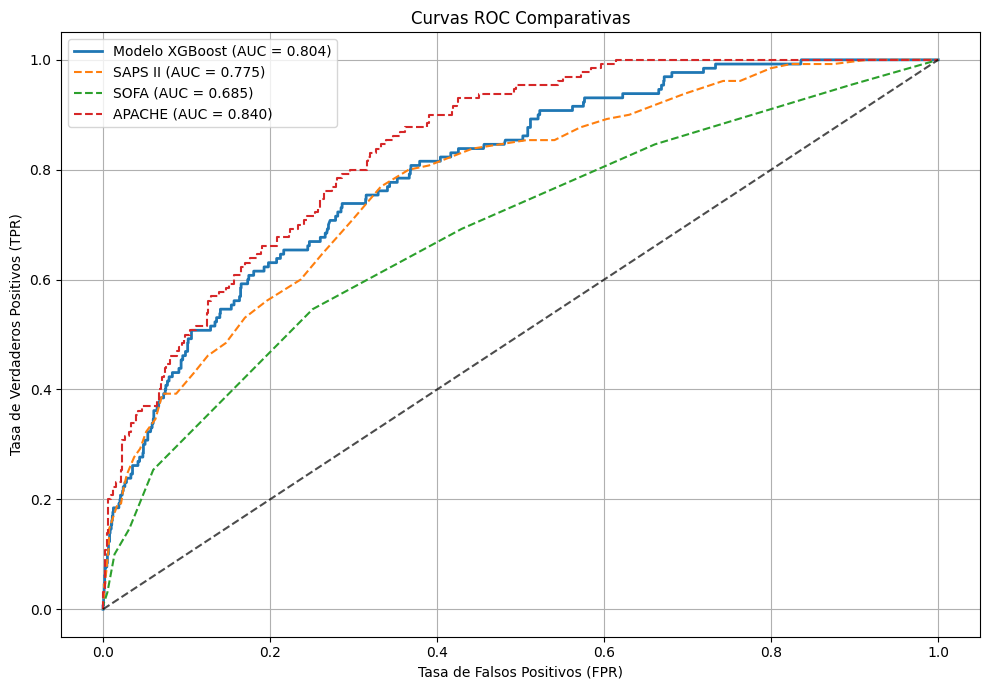

In [114]:
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import roc_auc_score, brier_score_loss, roc_curve
from imblearn.combine import SMOTETomek
import xgboost as xgb
import matplotlib.pyplot as plt

# ========= 1. Variables =========
features = [
    'motor', 'verbal','urine', 'heartrate', 'vent','bun','gender', 'age',
    'categoria_edad', 'albumin'
]   

X = df_final_ampliado_final[features]
y = df_final_ampliado_final['diedinhospital']

categorical = ['gender', 'categoria_edad']
numerical = list(set(features) - set(categorical))

# ========= 2. Preprocesamiento =========
preprocessor = ColumnTransformer([
    ('num', StandardScaler(), numerical),
    ('cat', OneHotEncoder(drop='first'), categorical)
])

smote_tomek = SMOTETomek(random_state=42)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ========= 3. Métricas =========
auc_scores = []
brier_scores = []
auc_saps2_list = []
auc_sofa_list = []
auc_apache_list = []
brier_saps2_list = []
brier_sofa_list = []
brier_apache_list = []

# Para curvas ROC
all_y_true = []
all_y_pred_proba = []
all_saps2_probs = []
all_sofa_probs = []
all_apache_probs = []

for fold, (train_idx, test_idx) in enumerate(cv.split(X, y), 1):
    X_train_fold, X_test_fold = X.iloc[train_idx], X.iloc[test_idx]
    y_train_fold, y_test_fold = y.iloc[train_idx], y.iloc[test_idx]

    X_train_proc = preprocessor.fit_transform(X_train_fold)
    X_test_proc = preprocessor.transform(X_test_fold)

    X_resampled, y_resampled = smote_tomek.fit_resample(X_train_proc, y_train_fold)

    model = xgb.XGBClassifier(
        eval_metric='logloss',
        learning_rate = 0.05,
        max_depth = 3, 
        n_estimators = 100,
        random_state=seed
    )
    model.fit(X_resampled, y_resampled)

    y_pred_proba = model.predict_proba(X_test_proc)[:, 1]
    saps2_probs = df_final.iloc[test_idx]['saps2_probabilidad']
    sofa_probs = df_final.iloc[test_idx]['sofa_probabilidad']
    apache_probs = df_final.iloc[test_idx]['predictedicumortality']

    auc_scores.append(roc_auc_score(y_test_fold, y_pred_proba))
    brier_scores.append(brier_score_loss(y_test_fold, y_pred_proba))

    auc_saps2_list.append(roc_auc_score(y_test_fold, saps2_probs))
    auc_sofa_list.append(roc_auc_score(y_test_fold, sofa_probs))
    auc_apache_list.append(roc_auc_score(y_test_fold, apache_probs))

    brier_saps2_list.append(brier_score_loss(y_test_fold, saps2_probs))
    brier_sofa_list.append(brier_score_loss(y_test_fold, sofa_probs))
    brier_apache_list.append(brier_score_loss(y_test_fold, apache_probs))

    # Acumular para ROC global
    all_y_true.extend(y_test_fold)
    all_y_pred_proba.extend(y_pred_proba)
    all_saps2_probs.extend(saps2_probs)
    all_sofa_probs.extend(sofa_probs)
    all_apache_probs.extend(apache_probs)

    print(f"✅ Fold {fold} completado")

# ========= 4. Resultados Promedio =========
print("\n🔎 Resultados Promedio (5-Fold CV):\n")
print(f"AUC - Modelo:   {np.mean(auc_scores):.3f} ± {np.std(auc_scores):.3f}")
print(f"AUC - SAPS II:  {np.mean(auc_saps2_list):.3f} ± {np.std(auc_saps2_list):.3f}")
print(f"AUC - SOFA:     {np.mean(auc_sofa_list):.3f} ± {np.std(auc_sofa_list):.3f}")
print(f"AUC - APACHE:   {np.mean(auc_apache_list):.3f} ± {np.std(auc_apache_list):.3f}")

print()
print(f"Brier - Modelo:   {np.mean(brier_scores):.3f} ± {np.std(brier_scores):.3f}")
print(f"Brier - SAPS II:  {np.mean(brier_saps2_list):.3f} ± {np.std(brier_saps2_list):.3f}")
print(f"Brier - SOFA:     {np.mean(brier_sofa_list):.3f} ± {np.std(brier_sofa_list):.3f}")
print(f"Brier - APACHE:   {np.mean(brier_apache_list):.3f} ± {np.std(brier_apache_list):.3f}")

# ========= 5. Curvas ROC =========
fpr_model, tpr_model, _ = roc_curve(all_y_true, all_y_pred_proba)
fpr_saps2, tpr_saps2, _ = roc_curve(all_y_true, all_saps2_probs)
fpr_sofa, tpr_sofa, _ = roc_curve(all_y_true, all_sofa_probs)
fpr_apache, tpr_apache, _ = roc_curve(all_y_true, all_apache_probs)

plt.figure(figsize=(10, 7))
plt.plot(fpr_model, tpr_model, label=f'Modelo XGBoost (AUC = {np.mean(auc_scores):.3f})', linewidth=2)
plt.plot(fpr_saps2, tpr_saps2, label=f'SAPS II (AUC = {np.mean(auc_saps2_list):.3f})', linestyle='--')
plt.plot(fpr_sofa, tpr_sofa, label=f'SOFA (AUC = {np.mean(auc_sofa_list):.3f})', linestyle='--')
plt.plot(fpr_apache, tpr_apache, label=f'APACHE (AUC = {np.mean(auc_apache_list):.3f})', linestyle='--')
plt.plot([0, 1], [0, 1], 'k--', alpha=0.7)

plt.title('Curvas ROC Comparativas')
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

 ## Combinación dataset

✅ Fold 1 completado
✅ Fold 2 completado
✅ Fold 3 completado
✅ Fold 4 completado
✅ Fold 5 completado

🔎 Resultados Promedio (5-Fold CV):

AUC - Modelo:   0.814 ± 0.032
AUC - SAPS II:  0.775 ± 0.050
AUC - SOFA:     0.685 ± 0.076
AUC - APACHE:   0.840 ± 0.038

Brier - Modelo:   0.084 ± 0.004
Brier - SAPS II:  0.073 ± 0.001
Brier - SOFA:     0.092 ± 0.006
Brier - APACHE:   0.060 ± 0.007


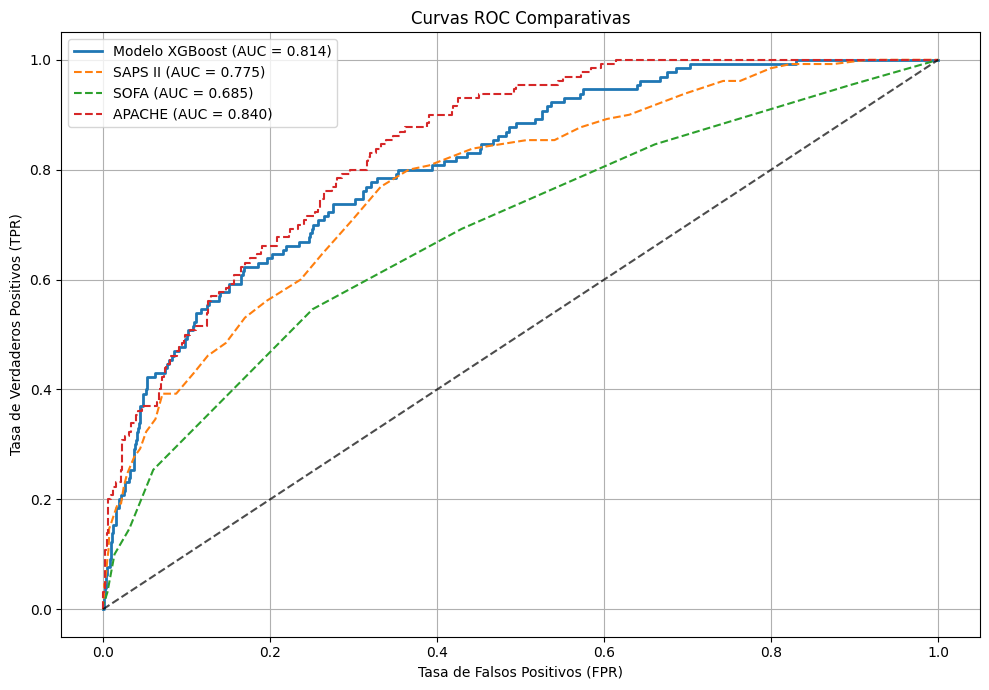

In [115]:
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import roc_auc_score, brier_score_loss, roc_curve
from imblearn.combine import SMOTETomek
import xgboost as xgb
import matplotlib.pyplot as plt

# ========= 1. Variables =========
features = [
"categoria_edad", "age", "gender", "respiratoryrate", "verbal", "motor", "meanbp", "hepaticfailure",
"eyes", "heartrate", "vent", "bun", "albumin", "urine","Tuvo_problemas_Cardivaculares", 
"Enfermedad_Cardiovascular", "Enfermedad_Neurológica", "Tuvo_problemas_Endocrinos", "Enfermedad_Ocológica", "Enfermedad_Infecciosa"
] 

X = df_final_ampliado_final[features]
y = df_final_ampliado_final['diedinhospital']

categorical = ['gender', 'categoria_edad']
numerical = list(set(features) - set(categorical))

# ========= 2. Preprocesamiento =========
preprocessor = ColumnTransformer([
    ('num', StandardScaler(), numerical),
    ('cat', OneHotEncoder(drop='first'), categorical)
])

smote_tomek = SMOTETomek(random_state=42)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ========= 3. Métricas =========
auc_scores = []
brier_scores = []
auc_saps2_list = []
auc_sofa_list = []
auc_apache_list = []
brier_saps2_list = []
brier_sofa_list = []
brier_apache_list = []

# Para curvas ROC
all_y_true = []
all_y_pred_proba = []
all_saps2_probs = []
all_sofa_probs = []
all_apache_probs = []

for fold, (train_idx, test_idx) in enumerate(cv.split(X, y), 1):
    X_train_fold, X_test_fold = X.iloc[train_idx], X.iloc[test_idx]
    y_train_fold, y_test_fold = y.iloc[train_idx], y.iloc[test_idx]

    X_train_proc = preprocessor.fit_transform(X_train_fold)
    X_test_proc = preprocessor.transform(X_test_fold)

    X_resampled, y_resampled = smote_tomek.fit_resample(X_train_proc, y_train_fold)

    model = xgb.XGBClassifier(
        eval_metric='logloss',
        learning_rate = 0.05,
        max_depth = 3, 
        n_estimators = 100,
        random_state=seed
    )
    model.fit(X_resampled, y_resampled)

    y_pred_proba = model.predict_proba(X_test_proc)[:, 1]
    saps2_probs = df_final.iloc[test_idx]['saps2_probabilidad']
    sofa_probs = df_final.iloc[test_idx]['sofa_probabilidad']
    apache_probs = df_final.iloc[test_idx]['predictedicumortality']

    auc_scores.append(roc_auc_score(y_test_fold, y_pred_proba))
    brier_scores.append(brier_score_loss(y_test_fold, y_pred_proba))

    auc_saps2_list.append(roc_auc_score(y_test_fold, saps2_probs))
    auc_sofa_list.append(roc_auc_score(y_test_fold, sofa_probs))
    auc_apache_list.append(roc_auc_score(y_test_fold, apache_probs))

    brier_saps2_list.append(brier_score_loss(y_test_fold, saps2_probs))
    brier_sofa_list.append(brier_score_loss(y_test_fold, sofa_probs))
    brier_apache_list.append(brier_score_loss(y_test_fold, apache_probs))

    # Acumular para ROC global
    all_y_true.extend(y_test_fold)
    all_y_pred_proba.extend(y_pred_proba)
    all_saps2_probs.extend(saps2_probs)
    all_sofa_probs.extend(sofa_probs)
    all_apache_probs.extend(apache_probs)

    print(f"✅ Fold {fold} completado")

# ========= 4. Resultados Promedio =========
print("\n🔎 Resultados Promedio (5-Fold CV):\n")
print(f"AUC - Modelo:   {np.mean(auc_scores):.3f} ± {np.std(auc_scores):.3f}")
print(f"AUC - SAPS II:  {np.mean(auc_saps2_list):.3f} ± {np.std(auc_saps2_list):.3f}")
print(f"AUC - SOFA:     {np.mean(auc_sofa_list):.3f} ± {np.std(auc_sofa_list):.3f}")
print(f"AUC - APACHE:   {np.mean(auc_apache_list):.3f} ± {np.std(auc_apache_list):.3f}")

print()
print(f"Brier - Modelo:   {np.mean(brier_scores):.3f} ± {np.std(brier_scores):.3f}")
print(f"Brier - SAPS II:  {np.mean(brier_saps2_list):.3f} ± {np.std(brier_saps2_list):.3f}")
print(f"Brier - SOFA:     {np.mean(brier_sofa_list):.3f} ± {np.std(brier_sofa_list):.3f}")
print(f"Brier - APACHE:   {np.mean(brier_apache_list):.3f} ± {np.std(brier_apache_list):.3f}")

# ========= 5. Curvas ROC =========
fpr_model, tpr_model, _ = roc_curve(all_y_true, all_y_pred_proba)
fpr_saps2, tpr_saps2, _ = roc_curve(all_y_true, all_saps2_probs)
fpr_sofa, tpr_sofa, _ = roc_curve(all_y_true, all_sofa_probs)
fpr_apache, tpr_apache, _ = roc_curve(all_y_true, all_apache_probs)

plt.figure(figsize=(10, 7))
plt.plot(fpr_model, tpr_model, label=f'Modelo XGBoost (AUC = {np.mean(auc_scores):.3f})', linewidth=2)
plt.plot(fpr_saps2, tpr_saps2, label=f'SAPS II (AUC = {np.mean(auc_saps2_list):.3f})', linestyle='--')
plt.plot(fpr_sofa, tpr_sofa, label=f'SOFA (AUC = {np.mean(auc_sofa_list):.3f})', linestyle='--')
plt.plot(fpr_apache, tpr_apache, label=f'APACHE (AUC = {np.mean(auc_apache_list):.3f})', linestyle='--')
plt.plot([0, 1], [0, 1], 'k--', alpha=0.7)

plt.title('Curvas ROC Comparativas')
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
